<a href="https://colab.research.google.com/github/jjschueder/7331DataMiningNotebooks/blob/master/lab3/Lab3_Daniel_Jeff_Armando_Joe_final_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Lab 3 -  Clustering, Association Rules, or Recommenders 

#### Daniel Clark, Joe Schueder, Jeff Washburn, Armando Vela

## Business Understanding 1 (10 points)



**Introduction & describing the purpose of the data set we selected (i.e., why was this data collected in the first place?).**
    
The Iowa Liquor Sales dataset is an API from Google’s Bigquery which contains the wholesale purchases byretail stores in the Iowa area. The dataset includes the spirit purchase details by product, date of purchase,and location the item was purchased from an Iowa Class “E” liquor license holder (retail stores). The time frame of this data starts from January 1, 2012 through December 31, 2019. As part of the study commissioned by the Iowa Department of Commerce, all alcoholic sales within the state were logged into the Department system, and in turn, published as open data by the State of Iowa. The dataset contains detail on the name, product, quantity and location of the individual container or package sale between the wholesaler (vendor) and the retailer.

Our goal of the models will be to cluster the associated liquor type to create a new feature that we will use to try and improve our classification from lab-2.

    
**How will we measure the effectiveness of a good algorithm?** 
To measure the effectiveness of each clustering algorithm we will be comparing the calculated Silhouette score (i.e. Silhouette Coefficient). Additional details regarding the silhouette score is below.
    
Silhouette Score – Per scikit learn documentation, “The Silhouette Coefficient is calculated using the mean intra-cluster distance (a) and the mean nearest-cluster distance (b) for each sample. The Silhouette Coefficient for a sample is (b - a) / max(a, b). To clarify, b is the distance between a sample and the nearest cluster that the sample is not a part of. Note that Silhouette Coefficient is only defined if number of labels is 2 <= n_labels <= n_samples - 1. 
    
The best value is 1 and the worst value is -1. Values near 0 indicate overlapping clusters. Negative values indicate that the values located in each cluster have little in common with one another, suggesting the cluster was not based on a unified characteristic. We are going to use Silhouette score because it's a simple scoring metric to interpret, it shows a direct correlation to additional metrics we've reviewed such as homogeneity, completeness and V-measure. 

Why Silhouette Score?

Our silhouette score will also prove useful as it translates across clustering using the raw data as well as dimension reduced data (PCA and LDA) which we will be perforing in this procedure. The reason we are doing so is due to the number of features in our data, we want to be able to easily to see our clusters from different angles in a 3 dimensional plot. Reducing our 10+ features to a set of 3 eigen vectors, we can ensure that we are not missing a dimension that could show clusters emerge. 

In addition to Silhouette score, we will also be looking at Accuracy to assess the validity of our Random Forest classification Procedure (both the baseline procedure as well as our procedure including our best performing cluster as an additional feature in our X dataset. This will be picked up from Lab 2 where we tested different algorithms to classify different liquor types, and accuracy score (the percentage of correctly predicted instances) was our chief scoring metric. 

Once we have found the best clustering algorithm, we will take the clustering output and use as a new feature to our random forest classification to see if it improves our classification accuracy.




## Data Understanding 1 (10 points)


The initial data set was 4.63GB with 17.7 million rows. We subsetted that down to 400k rows using a random set of data from the 2019 sales data. This work was done in our initial processing from earlier. Also, the subsetted data did not have any missing values or duplicate data.  
    
Next, we further refined the 400k dataset by one-hot encoding the categorical features for sales month, liquor categories, and the stores. The stores will not be used in this analysis; however, it was still one-hot encoded for future analysis. From there, we further reduced the data down to only using 40k rows. We found that running 400k worth of data was taking a tremendous amount of time.

It's also worth noting, that we used the log transformed values for sales dollars, cost per liter, state bottle cost and volume sold in liters along with the liquor catogory to focus on our classification and ensure that outliers do not hold too heavy of a weight in our analysis. 

Each record in the dataset has been formatted so that it represents a single sale between liquor retailer and wholesaler. The liquor type varies by each instance and can represent a wide variety of sale sizes and prices, so we will need to use a clustering algorithm without a known liquor type for each designation. To do this, we will attempt to cluster with 7 total clusters defined by 3 different clustering algorithm corresponding with each of the liquor types present

More info can be found on our starting dataset here at: https://github.com/jjschueder/7331DataMiningNotebooks/blob/master/lab1/msds7331_clark_schueder_vela_washburn.ipynb


In [0]:
import pandas as pd

url_dataset = 'https://raw.githubusercontent.com/jjschueder/7331DataMiningNotebooks/master/Live%20Assignments/df1hotmerge2.csv'
data = pd.read_csv(url_dataset, nrows = 40000)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 68 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                40000 non-null  int64  
 1   pack                      40000 non-null  int64  
 2   bottle_volume_ml          40000 non-null  int64  
 3   state_bottle_cost         40000 non-null  float64
 4   state_bottle_retail       40000 non-null  float64
 5   bottles_sold              40000 non-null  int64  
 6   sale_dollars              40000 non-null  float64
 7   volume_sold_liters        40000 non-null  float64
 8   volume_sold_gallons       40000 non-null  float64
 9   counter                   40000 non-null  int64  
 10  liquor_category           40000 non-null  object 
 11  store_parent              40000 non-null  object 
 12  month                     40000 non-null  object 
 13  year                      40000 non-null  int64  
 14  monthy

In [0]:
# Import all necessary libraries we will be using in our dataset

import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import math
import re
import sklearn
import statistics
import random

from sklearn.feature_selection import SelectKBest, chi2, SelectPercentile, RFE, SelectFromModel

from sklearn.preprocessing import StandardScaler, Binarizer

from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC, LinearSVC

from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, auc, roc_curve
from IPython.display import display, HTML

from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, TimeSeriesSplit, StratifiedShuffleSplit

from sklearn.naive_bayes import MultinomialNB

from sklearn.ensemble import GradientBoostingClassifier,GradientBoostingRegressor,AdaBoostClassifier,RandomForestClassifier, BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics


%matplotlib inline

matplotlib.style.use('ggplot')

import warnings
warnings.filterwarnings('ignore')
print(data.shape)
data.head()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


(40000, 68)


,Unnamed: 0,pack,bottle_volume_ml,state_bottle_cost,state_bottle_retail,bottles_sold,sale_dollars,volume_sold_liters,volume_sold_gallons,counter,liquor_category,store_parent,month,year,monthyear,liquor_category_AMARETTO,liquor_category_BRANDY,liquor_category_GIN,liquor_category_LIQUEUR,liquor_category_Other,liquor_category_RUM,liquor_category_SCHNAPPS,liquor_category_TEQUILA,liquor_category_VODKA,liquor_category_WHISKY,store_parent_CVS,store_parent_Caseys,store_parent_Hy-Vee,store_parent_Kum&Go,store_parent_Other,store_parent_QuikTrip,store_parent_SamsClub,store_parent_SmokingJoes,store_parent_Target,store_parent_Wal-Mart,store_parent_Walgreens,month_Apr,month_Aug,month_Dec,month_Feb,month_Jan,month_Jul,month_Jun,month_Mar,month_May,month_Nov,month_Oct,month_Sep,year_2019,monthyear_Apr-2019,monthyear_Aug-2019,monthyear_Dec-2019,monthyear_Feb-2019,monthyear_Jan-2019,monthyear_Jul-2019,monthyear_Jun-2019,monthyear_Mar-2019,monthyear_May-2019,monthyear_Nov-2019,monthyear_Oct-2019,monthyear_Sep-2019,sale_dollars_trans,cost_per_liter,cost_per_liter_trans,state_bottle_cost_trans,bottles_sold_trans,volume_sold_liters_trans,grossmargin
0,0,20,375,3.85,5.78,20,115.60,7.50,1.98,1,Other,Other,Nov,2019,Nov-19,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,4.750136,15.413333,2.735233,1.348073,2.995732,2.014903,0.333910
1,1,8,50,8.75,13.13,1,13.13,0.05,0.01,1,Other,Other,Nov,2019,Nov-19,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,2.574900,262.600000,5.570632,2.169054,0.000000,-2.995732,0.333587
2,2,12,1000,16.50,24.75,6,148.50,6.00,1.58,1,GIN,Hy-Vee,May,2019,May-19,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,5.000585,24.750000,3.208825,2.803360,1.791759,1.791759,0.333333
3,3,6,750,21.17,31.76,24,762.24,18.00,4.75,1,WHISKY,Hy-Vee,Nov,2019,Nov-19,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,6.636261,42.346667,3.745890,3.052585,3.178054,2.890372,0.333438
4,4,6,1750,9.31,13.97,12,167.64,21.00,5.54,1,Other,Hy-Vee,Nov,2019,Nov-19,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,5.121819,7.982857,2.077296,2.231089,2.484907,3.044522,0.333572


#### Our data Preparation includes the following layout

Since we are predicting our liquor category type (opening to the entire list of categories and not just one), we can assign them a numerical value.  Further below, new variables were created using aggredate data on profit, total cost and revenue.


In [0]:
# Since we are predicting our liquor category type (opening to the entire list of categories and not just one), we can assign them a numerical value.

print (data['liquor_category'].unique())

"""df = pd.DataFrame({'col_1':[133,255,36,477,55,63]})
d = {'1':'M', '2': 'C', '3':'a', '4':'f', '5':'r', '6':'s'}
def ifef(col):
    col = str(col)
    return d[col[0]]

df['id_label'] = df['col_1'].apply(ifef)
print(df)"""

d = {'O':'1', 'G': '2', 'W':'3', 'T':'4', 'L':'5', 'V':'6', 'R':'7', 'S': '8', 'A':'9', 'B':'10'}

#data['id_label'] = data['liquor_category'].apply(ifef)

data['id_label'] = data['liquor_category'].astype(str).str[0].map(d)

print(data.head())

['Other' 'GIN' 'WHISKY' 'TEQUILA' 'LIQUEUR' 'VODKA' 'RUM' 'SCHNAPPS'
 'AMARETTO' 'BRANDY']
   Unnamed: 0  pack  ...  grossmargin  id_label
0           0    20  ...     0.333910         1
1           1     8  ...     0.333587         1
2           2    12  ...     0.333333         2
3           3     6  ...     0.333438         3
4           4     6  ...     0.333572         1

[5 rows x 69 columns]



As discussed, we decided to take the liquor categories and assign them numeral variables that will be easier to analyze in our project. 
Also, we decided to create a series of new variables that are an aggregate product of existing variables. You can see them outlined below:



*   Profit - which is what is left after the total bottle retail is subtracted from the total bottle cost. To help ensure we are using scalar values. we logged the data.
*   total cost - the total state bottle cost x the number of bottles sold. we transformed this figure to account for outliers
*   revenue - state bottle retail x the number of bottles sold. We transformed this to account for outliers.
*   pack trans - we transformed the pack size since the data was very skewed.


In [0]:
# Create new variables using aggredate data on profit, total cost and revenue

#do some calculations for cost and profit
data['profit'] = data['state_bottle_retail']*data['bottles_sold'] - data['state_bottle_cost']* data['bottles_sold']
data['profit_trans']= np.log(data['profit'])

data['totalcost'] = data['state_bottle_cost']* data['bottles_sold']
data['totalcost_trans']= np.log(data['totalcost'])

data['revenue'] = data['state_bottle_retail']*data['bottles_sold']
data['revenue_trans']= np.log(data['revenue'])

data['bottle_volume_ml_trans']= np.log(data['bottle_volume_ml'])

data['pack_trans']= np.log(data['pack'])

## Data Understanding 2 (10 points)

Visualize the any important attributes appropriately. Important: Provide an interpretation for any charts or graphs

In the code below, you can see that we are removing many variables from our model that we don't think will factor into the final performance. These include nominal data such as store parent, counter and date. Additionally, we will be removing a ton of one-hot encoded data that will not play a role in our classifiers.
    
Also reviewing the boxplots below, we have some uniformity in our continuous features with minimal outliers. This will help us to accurately predict our liquor categories by building multiple versions of models to compare performance. Running a quick shape feature, we can see that we are not missing any data and the number of features from the modified dataset above has gone from 68 to 11.
    
    
Additional detail regarding important attributes can be found within the charts and graphs below.



(40000, 11)


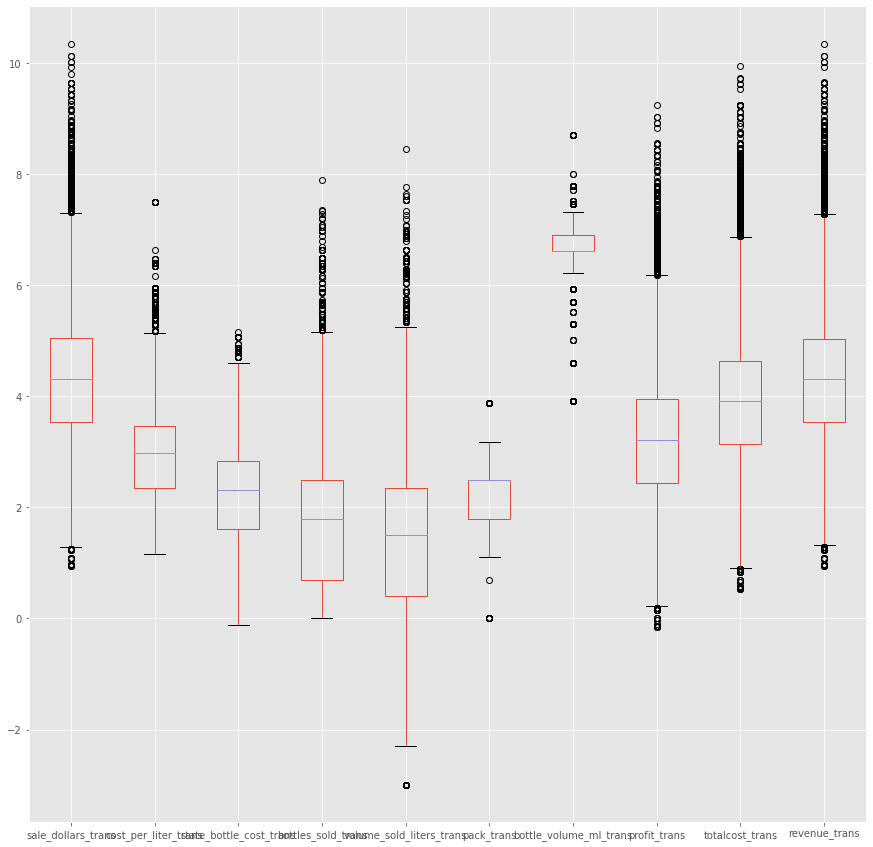

In [0]:
# Since we transformed a number of continuous variables, we can drop them so that we are working directly on our normalized data


# Remove unwanted columns, which include all the specific liquor categories, 
# except for liquor_category_WHISKY since that is what we want to classify on, along
# with all the store_ attributes
"""
cat_vars=['counter', 'liquor_category', 'store_parent',
 'month', 'year', 'monthyear', 'liquor_category_AMARETTO', 'liquor_category_BRANDY', 'liquor_category_GIN', 
 'liquor_category_LIQUEUR', 'liquor_category_Other', 'liquor_category_RUM', 'liquor_category_SCHNAPPS', 
 'liquor_category_TEQUILA', 'liquor_category_VODKA', 'month_Apr', 'month_Aug', 'month_Dec', 'month_Feb',
 'month_Jan', 'month_Jul', 'month_Jun', 'month_Mar', 'month_May', 'month_Nov', 'month_Oct', 'month_Sep', 
 'store_parent_CVS', 'store_parent_Caseys', 'store_parent_Hy-Vee', 'store_parent_Kum&Go', 
 'store_parent_Other', 'store_parent_QuikTrip', 'store_parent_SamsClub', 'store_parent_SmokingJoes', 
 'store_parent_Target', 'store_parent_Wal-Mart', 'store_parent_Walgreens']
data_vars=data.columns.values.tolist()
to_keep=[i for i in data_vars if i not in cat_vars]
"""
#keep our transformed detail, along with the timing and store name detail

to_keep=['sale_dollars_trans', 'cost_per_liter_trans',
      'state_bottle_cost_trans', 'bottles_sold_trans',
       'volume_sold_liters_trans','pack_trans', 'bottle_volume_ml_trans', 
       'profit_trans', 'totalcost_trans', 'revenue_trans', 'id_label']
data_final=data[to_keep]
data_final.columns.values

#boxplot of all the variables
plt.figure(figsize=(15, 15))
ax = data_final.boxplot()
#ax.set_yscale('log')

print(data_final.shape)

In [0]:
data_final.head()

,sale_dollars_trans,cost_per_liter_trans,state_bottle_cost_trans,bottles_sold_trans,volume_sold_liters_trans,pack_trans,bottle_volume_ml_trans,profit_trans,totalcost_trans,revenue_trans,id_label
0,4.750136,2.735233,1.348073,2.995732,2.014903,2.995732,5.926926,3.653252,4.343805,4.750136,1
1,2.574900,5.570632,2.169054,0.000000,-2.995732,2.079442,3.912023,1.477049,2.169054,2.574900,1
2,5.000585,3.208825,2.803360,1.791759,1.791759,2.484907,6.907755,3.901973,4.595120,5.000585,2
3,6.636261,3.745890,3.052585,3.178054,2.890372,1.791759,6.620073,5.537964,6.230639,6.636261,3
4,5.121819,2.077296,2.231089,2.484907,3.044522,1.791759,7.467371,4.023922,4.715996,5.121819,1


In [0]:
data_final = data_final[data_final['id_label'] < "8"]
data_final = data_final[data_final['id_label'] != "10"]
data_final['id_label'].value_counts()

6    13108
3     9045
7     5515
5     5360
4     2853
1     2386
2     1716
Name: id_label, dtype: int64


Running a quick df describe, we can se that almost all of our variables are floats to account for the transformations. With the id_label and store parent being an object features that might relate to clusters we are looking to use in our datasets. The last feature pack is represented as an int, which makes sense because they are typically sold in packs of 6, 12, 24 and 48.

In [0]:
data_final.describe()

,sale_dollars_trans,cost_per_liter_trans,state_bottle_cost_trans,bottles_sold_trans,volume_sold_liters_trans,pack_trans,bottle_volume_ml_trans,profit_trans,totalcost_trans,revenue_trans
count,39983.000000,39983.000000,39983.000000,39983.000000,39983.000000,39983.000000,39983.000000,39983.000000,39983.000000,39983.000000
mean,4.298304,2.971772,2.235141,1.657834,1.326531,2.334540,6.576575,3.200567,3.892975,4.298687
std,1.127910,0.865457,0.783014,1.106266,1.384870,0.525817,0.762560,1.127875,1.128033,1.127980
min,0.943906,1.163151,-0.116534,0.000000,-2.995732,0.000000,3.912023,-0.150823,0.536493,0.943906
25%,3.542697,2.345645,1.607436,0.693147,0.405465,1.791759,6.620073,2.446685,3.138966,3.544432
50%,4.319087,2.987700,2.306577,1.791759,1.504077,2.484907,6.620073,3.222071,3.912823,4.319087
75%,5.051393,3.465319,2.839078,2.484907,2.351375,2.484907,6.907755,3.944973,4.636521,5.042520
max,10.352874,7.495542,5.164729,7.901007,8.460623,3.871201,8.699515,9.254262,9.947409,10.352874


### Pair Plots

To explore our joint attributes, we are going to run a pairplot matrix grouped by liquor category across our top 4 feature correlations as determined from lab 2.  
* cost_per_liter_trans
* state_bottle_cost_trans
* sale_dollar_trans
* totalcost_trans

Here we can see scatter plots that show our correlations in action. 

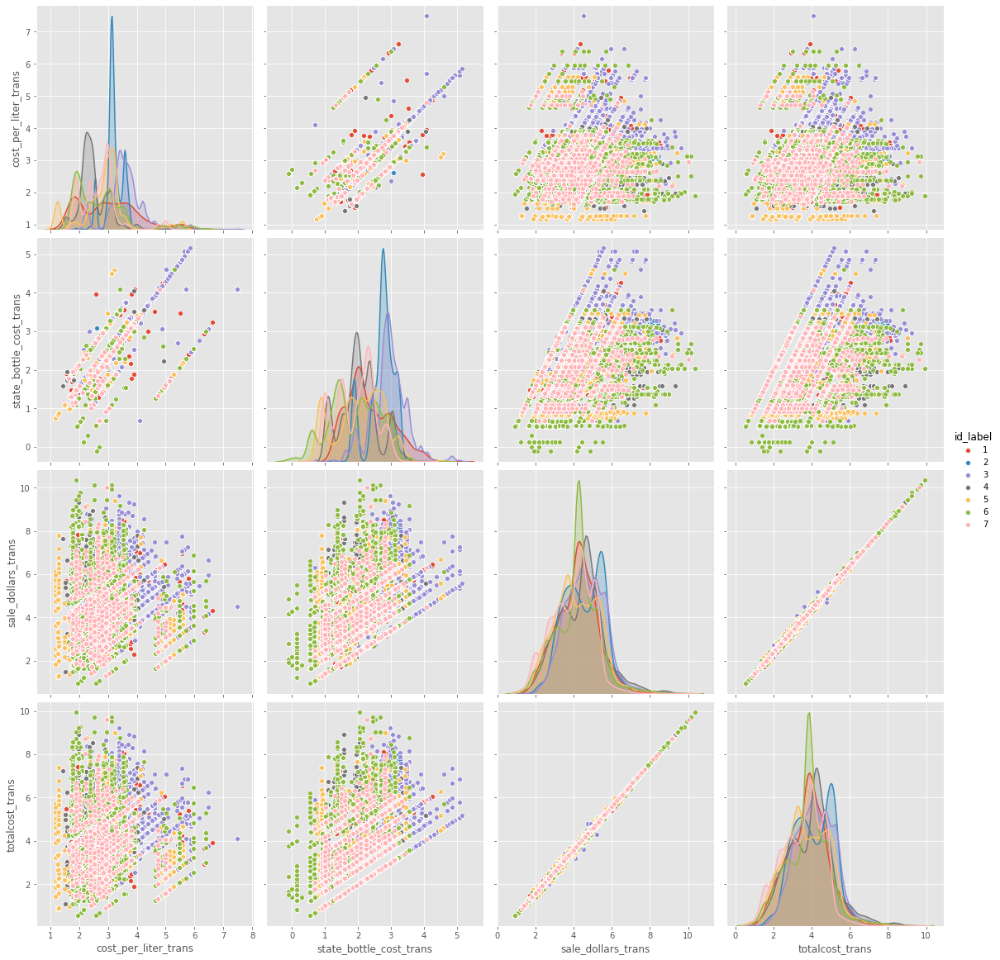

In [0]:
# Create plots for the top 4 features as found from lab 2
# cost_per_liter_trans, state_bottle_cost_trans, sale_dollars_trans, totalcost_trans
import seaborn as sns
sns.pairplot(data_final, height=4, hue= 'id_label', vars = ['cost_per_liter_trans', 'state_bottle_cost_trans', 'sale_dollars_trans', 'totalcost_trans'])

Looking at the pairplots above, we can start to see some patterns emerge from an eye test. The histogram plots seem to indicate that we might be able to get some interesting clusters based on the liquor types (1 through 7) and the density of some colors on the visuals. For example, there's a large blob of pink in the center of most plots with some green around the edge of it, and then some large blobs of purple to the far right. So based specifically on these 4 plots, we are hoping to be able to get some clusters directly related to some of our liquor types. 

One thing that is not visible with this method is the impact of dimensionality and the number of points in our dataset. Since we are working with 70k dots, there's a high likelihood that the density is so high that there could be multple purples and green right behind every pink in the plot. This is why we will be looking into PCA and LDA to hopefully account for this. 

To further explore our joint attributes, we wanted to look at the pair plots across all 10 attributes:

* sale_dollars_trans
* cost_per_liter_trans
* state_bottle_cost_trans
* bottles_sold_trans
* volume_sold_liters_trans
* pack_trans
* bottle_volume_ml_trans
* profit_trans
* totalcost_trans
* revenue_trans

Visualizing all 10 attributes against each other will help determine if we see some clustering appear across other attributes that weren't in our top 4 features from lab 2.

Doing so, we are starting to see some nice clustering around bottles_sold_trans and profit_trans, totalcost_trans, and revenue_trans using the raw liquor types as the indicators for clustes, similar to what we've seen in the visualization above. Since pack size and bottle volume are slightly more categorical than continuous (as there's a finite number of values under those features), this justifies our need to perform dimension reduction see how these variables may account for the variance in our classifier. 

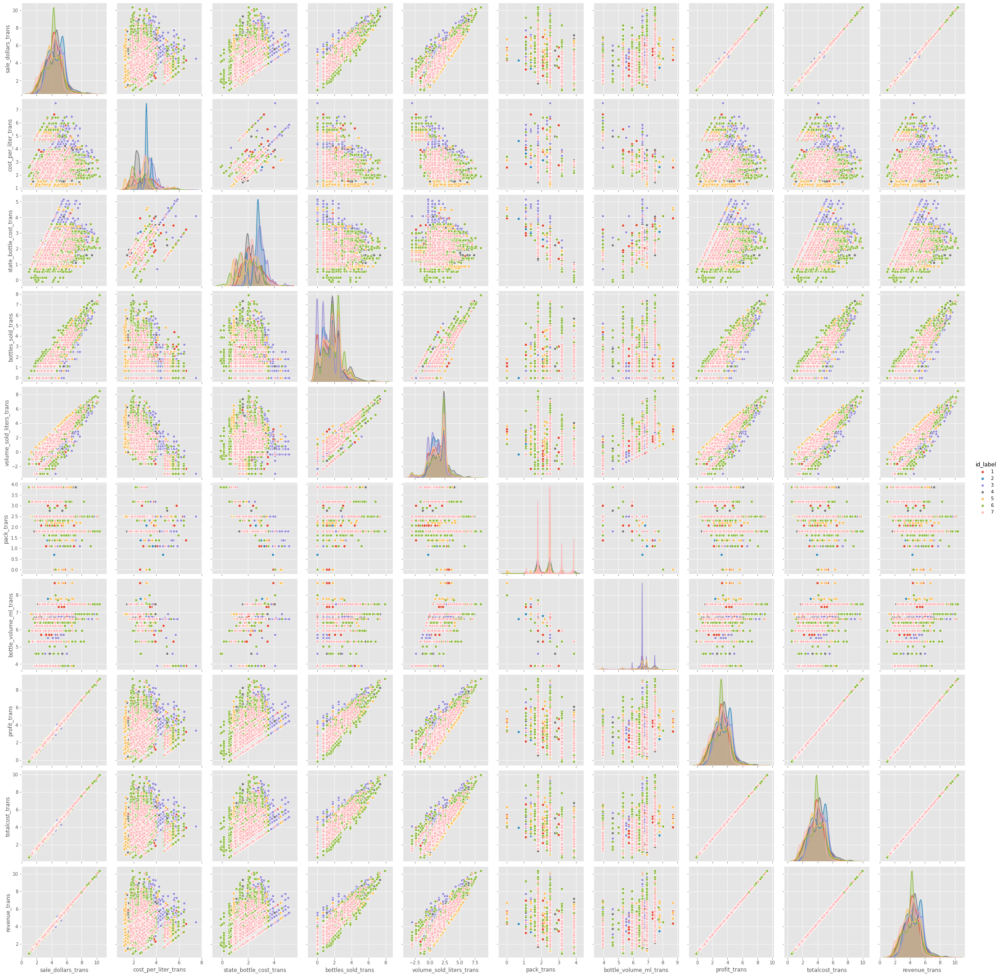

In [0]:
# Pairplot across all 10 attributes
import seaborn as sns
sns.pairplot(data_final, height=3, hue= 'id_label', vars = ['sale_dollars_trans', 'cost_per_liter_trans', 'state_bottle_cost_trans', 'bottles_sold_trans', 'volume_sold_liters_trans', 'pack_trans', 'bottle_volume_ml_trans', 'profit_trans', 'totalcost_trans', 'revenue_trans'])

### Correlation Matrix

Correlation matrix dives deeper into the relationship between all 10 of the variables in our dataset.  

To measure this, we will be able to run grid plots and heat maps with each feature against one another. The plots that are highly correlated will be closer to 1 while the plots that are highly negatively correlated will be closer to -1. 

Looking at a heat map of our correlation plot, we can see some interesting occurrences happening in the bottom right corner with regards to costs and revenue.

In addition, the bottles_sold_trans and volume_sold_liters_trans is highly correlated at 0.75 and .78 respectively to sale_dollars_trans.

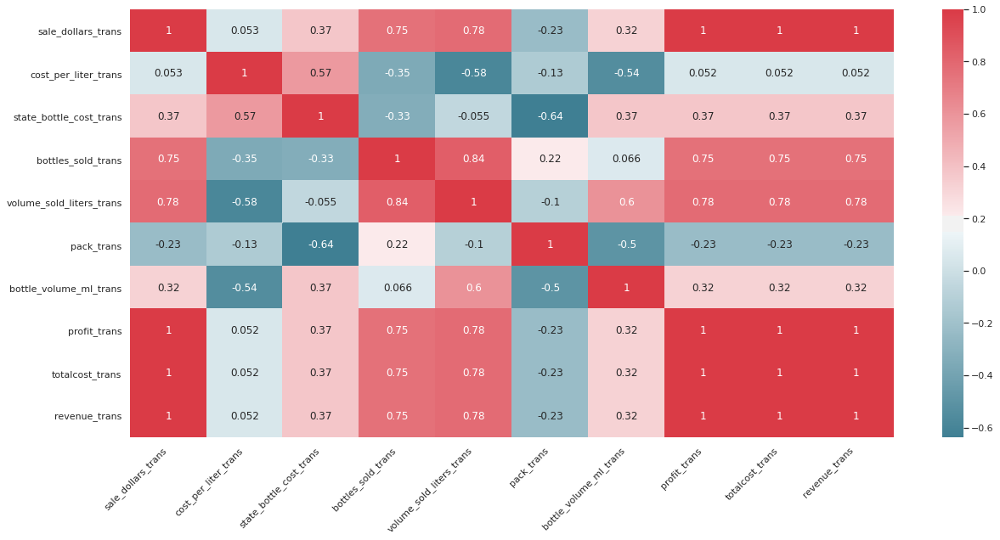

In [0]:
# plot the correlation matrix using seaborn
# https://towardsdatascience.com/visualizing-data-with-pair-plots-in-python-f228cf529166
import seaborn as sns
cmap = sns.diverging_palette(220, 10, as_cmap=True) # one of the many color mappings

# drop the counter attribute as that was used above when dealing with missing values
#del df['counter']

# show the heatmap
sns.set(style="darkgrid") # one of the many styles to plot using
f, ax = plt.subplots(figsize=(18, 9))
chart=sns.heatmap(data_final.corr(), cmap=cmap, annot=True)
chart.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
f.tight_layout()

## Modeling and Evaluation 1 (10 points)

Different tasks will require different evaluation methods. Be as thorough as possible when analyzing the data you have chosen and use visualizations of the results to explain the performance and expected outcomes whenever possible. Guide the reader through your analysis with plenty of discussion of the results. Each option is broken down by:

Train and adjust parameters (10 Points)
• Train: Perform cluster analysis using several clustering methods (adjust parameters).  

+++

For this data, we will be attempting to cluster our data on the basis of the liquor type that we classified against in lab 2, and apply that cluster into our classifier model as an an additional feature that could strengthen our classifier. As described in our business understanding section, our dataset consists of a number of features that can track the sales and records of purchases made in the state of Iowa from wholesaler to retailer. This can include quantanty detail on how much alcohol was sold during the purchase, how much the sale was for, how much profit was made, and other additional features slicing and dicing those details. The dataset includes all of 2019 data and tracks sales all over the state of Iowa. 

Our goal with the cluster is to uncover a hidden variable or relationship within the dataset that can be used to strengthen our classifier. Each record in the dataset has been formatted dso that it represents a single sale between liquor retailer and wholealer. The liquor type varies by each instance and can represent a wide variety of sale sizes and prices, so we will need to use a clustering algorithm without a known liquor type for each designation. To do this, we will start with a cluster algorithm tooled ot uncover 7 total clusters defined by 3 different clustering algorithm corresponding with each of the liquor types present. We will begin the analysis of all observations aggregated together, and then performt he same Smote procedure used in lab 2 to balance our classifier values. This will be done to ensure we are setting up our new classifier the same way we set it up in lab 2 (all the way down to the 80/20 training testing ratio, which we felt was a good balance to avoid overfitting and underfitting considering the amount of transformations we had in our set).

From there, we will then perform two dimensionality reduction procedures (PCA and LDA) so that we can combine our 11 variables to 3 sets of eigenvectors that can be used to plot our clusters in 3 dimensions. 

In [0]:
%%time
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn import metrics as mt

cv = StratifiedKFold(n_splits=10)

features = ['sale_dollars_trans', 'cost_per_liter_trans', 
       'state_bottle_cost_trans', 'bottles_sold_trans',
       'volume_sold_liters_trans', 'pack_trans', 'bottle_volume_ml_trans',
       'profit_trans', 'totalcost_trans', 'revenue_trans']

X2 = data_final[features].copy()

scaler = StandardScaler()
scaler.fit(X2)

#This makes our model's coefficients take on the same scale for accurate feature importance analysis
#Notice we scaled the data before the cross validation
X = scaler.transform(X2)

Y= data_final[['id_label']].copy()

CPU times: user 11.8 ms, sys: 0 ns, total: 11.8 ms
Wall time: 11.8 ms


Here, we are assigning our X and Y values like we did in Lab 2 using a stratified KFold cross valuation procedure. We chose this originally because we felt that it helped to give a more complete view of the performance of our model using average accuracy rather than a single accuracy score that could be a misleading view of the performance of the model. We will be doing 10 splits so we have plenty of views of the range of performance. 

In [0]:
from sklearn import metrics as mt

# train and test split before resampling
X1_train, X1_test, y1_train, y1_test = train_test_split(X, Y, test_size = 0.2, random_state = 101) 

In [0]:

print("Before OverSampling, counts of label 'Other': {}".format(sum(y1_train['id_label'] == "1")))
print("Before OverSampling, counts of label 'GIN': {} \n".format(sum(y1_train['id_label'] == "2"))) 
print("Before OverSampling, counts of label 'WHISKY': {} \n".format(sum(y1_train['id_label'] == "3"))) 
print("Before OverSampling, counts of label 'TEQUILA': {}".format(sum(y1_train['id_label'] == "4")))
print("Before OverSampling, counts of label 'LIQUEUR': {} \n".format(sum(y1_train['id_label'] == "5"))) 
print("Before OverSampling, counts of label 'VODKA': {} \n".format(sum(y1_train['id_label'] == "6"))) 
print("Before OverSampling, counts of label 'RUM': {} \n".format(sum(y1_train['id_label'] == "7"))) 


# import SMOTE module from imblearn library 
# pip install imblearn (if you don't have imblearn in your system) 
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 2) 
X1_train_res, y1_train_res = sm.fit_sample(X1_train, y1_train.values.ravel()) 
  
print('After OverSampling, the shape of train_X: {}'.format(X1_train_res.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y1_train_res.shape)) 
  
print("After OverSampling, counts of label 'Other': {}".format(sum(y1_train_res == "1"))) 
print("After OverSampling, counts of label 'GIN': {}".format(sum(y1_train_res == "2"))) 
print("After OverSampling, counts of label 'WHISKY': {}".format(sum(y1_train_res == "3"))) 
print("After OverSampling, counts of label 'TEQUILA': {}".format(sum(y1_train_res == "4"))) 
print("After OverSampling, counts of label 'LIQUEUR': {}".format(sum(y1_train_res == "5"))) 
print("After OverSampling, counts of label 'VODKA': {}".format(sum(y1_train_res == "6"))) 
print("After OverSampling, counts of label 'RUM': {}".format(sum(y1_train_res == "7"))) 

Before OverSampling, counts of label 'Other': 1902
Before OverSampling, counts of label 'GIN': 1374 

Before OverSampling, counts of label 'WHISKY': 7242 

Before OverSampling, counts of label 'TEQUILA': 2289
Before OverSampling, counts of label 'LIQUEUR': 4275 

Before OverSampling, counts of label 'VODKA': 10504 

Before OverSampling, counts of label 'RUM': 4400 

After OverSampling, the shape of train_X: (73528, 10)
After OverSampling, the shape of train_y: (73528,) 

After OverSampling, counts of label 'Other': 10504
After OverSampling, counts of label 'GIN': 10504
After OverSampling, counts of label 'WHISKY': 10504
After OverSampling, counts of label 'TEQUILA': 10504
After OverSampling, counts of label 'LIQUEUR': 10504
After OverSampling, counts of label 'VODKA': 10504
After OverSampling, counts of label 'RUM': 10504


Here we are doing a SMOTE engineering procedure which is designed to balance our classifiers in our dataset so that each liquor type we are testing is represented evenly in our classifier model. We did this because it will help us avoid having to engineer our classifier model against an unbalanced dataset which showed to be constantly overfit when testing in lab 2. 

As a result, our model ended up with over 70k observations with just over 10k observations labeled under each liquor type. In this lab, we will be building clustering algorithms and plotting each of these observations. 

In [0]:
X2.columns
X1DF = pd.DataFrame(X1_train_res, columns =X2.columns)

Here, we are going to be assigning our X training set to the label X1DF which you will see thoughout this lab. 

In [0]:
print(y1_train_res.shape)
ydf = pd.DataFrame(y1_train_res)

(73528,)


### Dimensionality reduction  

The following section uses linear discriminant analysis to reduce the number of dimensions from ten to three. Reducing the number of dimensions will allow us to better visualize our clusters since we won't need to chose 3 variables to plot against in our final graph. Doing this helps to explain 90+% of the variance of the data and allows us to view the data in chart fomat in two and three dimension. 

We tested both PCA and LDA and compared the two via silhouette score as well as accuracy score using a quick import of our Random Forest Classifier. 

Since the goal of the clusteirng for this lab is to help improve on classifications that were used in lab2(http:)  we thought that dimensionltiy reduction using Linear discriminant analysis might be useful since a Y target is specified and the algorithm optimizes based on the target. Since cluserting is easiest to visualize in three dimenions or less and three dimensions explains 90 plus percent of variance 3  was chosen as the number of components.

In the exceptional work section TSNE reduction was also used. Thought it did produce very large scores it did not improve upon the classification goals. 


In [0]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

lda = LDA(n_components=3)
X_train_lda = lda.fit_transform(X1_train_res, y1_train_res)
#X_test = lda.transform(X_test)
lda.explained_variance_ratio_

array([0.71367632, 0.13904418, 0.11337679])

We ran a quick Linear Discriminant Analysis against our SMOTE X and Y values. Doing so, we find that the 3 eigenvectors provided helped to explain over 90% of the variance of our Y value which was the liquor type. This is good because we are able to explain most of the variance with enough eigenvectors that we will be able to plot visually. 

In [0]:
X_train_lda.shape

(73528, 3)

In addition, doing so also left us with a data frame that was 73k observations long and with 3 features featuring each of the 3 eigenvectors we detirmined. 

In [0]:
X_train_lda

array([[ 1.85252337, -0.32521765, -0.56804213],
       [ 0.50371017, -0.55924543, -0.30168278],
       [-2.60531969, -9.54844453,  3.06054421],
       ...,
       [ 0.42162162, -0.59493912, -0.21386477],
       [ 0.66893012,  0.72146403,  0.89686832],
       [-0.82085565, -1.3189736 , -1.47513501]])

In [0]:
X_train_ldadf=pd.DataFrame(X_train_lda)
X_train_ldadf.columns=['First Component','Second Component', 'Third Component']

Here, we are going to convert our LDA into a dataframe labeled X_train_ldadf and labeling each of the eigenvectors as first, second and third component. 

In [0]:
ldaydf = X_train_ldadf.merge(ydf, left_index=True, right_index=True)

Here, we are going to merge it in with the y values so we have a complete dataset featuring our 3 eigenvectors and our liquor Id labels. 

In [0]:
ldaydf = ldaydf.rename(columns={0: 'Liquorlabel'})

The chart below shows a pair plot of the first and second component derived from LDA. This shows some good seperation by liquor labels. This shows that intuitively the liquor types have some speration in two dimension based on the two primary components. 

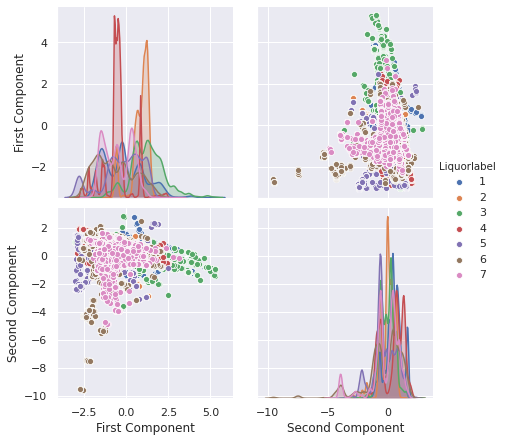

In [0]:
import seaborn as sns
sns.pairplot(ldaydf, height=3, hue= 'Liquorlabel', vars = ['First Component', 'Second Component'])

In [0]:
X1 = ldaydf['First Component']
Y1 = ldaydf['Second Component'] 
Z1 = ldaydf['Third Component']
L1 = ldaydf['Liquorlabel'].astype(int)

The chart below shows a 3-d plot of the first,second, and third components derived from LDA. This shows some seperation by liquor labels, but less obvious than the using just the first two primary components.  This shows that intuitively the liquor types have some speration in two dimension based on the two primary components. 

Additionally, there is a lot of 'mud' within the center of our 3 dimensional plot which suggests that many of our liquor labels are overlapping in the center. Hopefully, we will be able to find clustes that can help to separate these.

Text(0.5, 0.92, 'LDA data exploration')

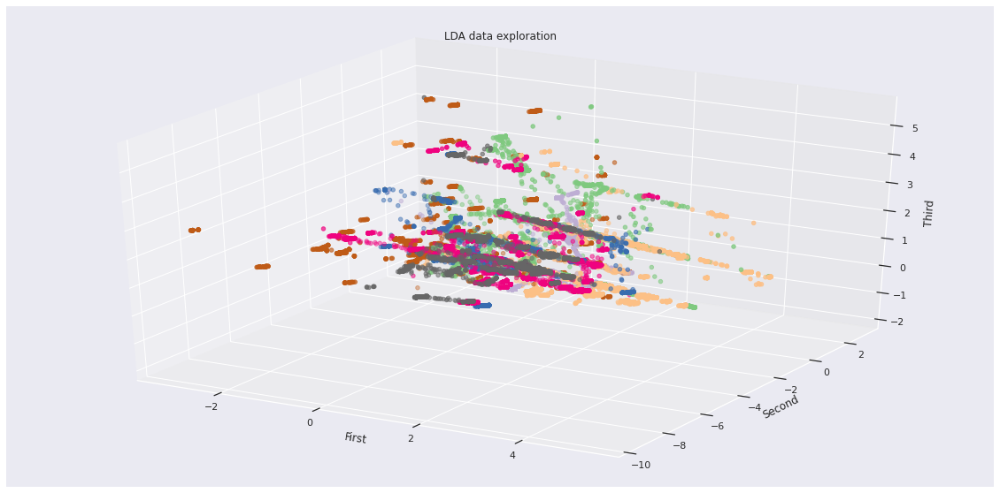

In [0]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1, Y1, Z1, c=L1, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('LDA data exploration')


Next we will look at dimensionality reduction using PCA. 

In [0]:
#https://towardsdatascience.com/credit-risk-unsupervised-clients-clustering-9eacae6807a0

to_keep=['sale_dollars_trans', 'cost_per_liter_trans',
      'state_bottle_cost_trans', 'bottles_sold_trans',
       'volume_sold_liters_trans','pack_trans', 'bottle_volume_ml_trans', 
       'profit_trans', 'totalcost_trans', 'revenue_trans']
data_final2=X1DF[to_keep]
data_final2.columns.values
from sklearn.decomposition import PCA 
pca = PCA(3)  
projected = pca.fit_transform(data_final2)
print(X1DF.shape)
print(projected.shape)

(73528, 10)
(73528, 3)


In addition to LDA, we will also look into the dimensionality reduction procedure call Principle Component Analysis. It's relatively similar to LDA except that it is unsupervised and ignores class labels. Even though we don't have any class labels in our dataset, we do have features that have a defined set of outcomes (i.e. not continuous) which would be pack size and bottle volume. So it will be interesting to see if LDA uncovered anything with this that PCA did not. 

In [0]:
from sklearn.decomposition import PCA 
pcax = PCA(3)  
projected = pcax.fit_transform(data_final2)
pcax.explained_variance_ratio_

array([0.58051545, 0.21723232, 0.16782717])

Like our LDA dimensionality reduction procedure, we were abel to explain +90% of our variance with three eigenvectors (in this case, more than 96%). 

In [0]:
X_train_pcadf=pd.DataFrame(projected)
X_train_pcadf.columns=['First Component','Second Component', 'Third Component']

pcaydf = X_train_pcadf.merge(ydf, left_index=True, right_index=True)

In [0]:
pcaydf = pcaydf.rename(columns={0: 'Liquorlabel'})

The chart below shows a pair plot of the first and second component derived from PCS. This shows some good seperation by liquor labels. This shows that intuitively the liquor types have some speration in two dimension based on the two primary components. 

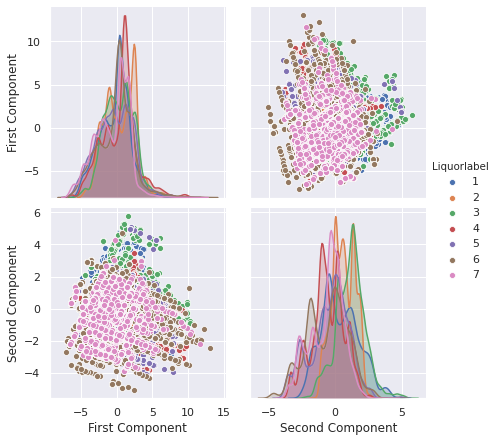

In [0]:
import seaborn as sns
sns.pairplot(pcaydf, height=3, hue= 'Liquorlabel', vars = ['First Component', 'Second Component'])

In [0]:
X1P = pcaydf['First Component']
Y1P = pcaydf['Second Component'] 
Z1P = pcaydf['Third Component']
L1P = pcaydf['Liquorlabel'].astype(int)

The chart below shows a 3-d plot of the first,second, and third components derived from PCS. This shows some seperation by liquor labels, but less obvious than the using just the first two primary components.  This shows that intuitively the liquor types have some speration in two dimension based on the two primary components. Also, we can see that there is a significant amount of additoinal 'mud' in the PCA that was not visible in the LDA 3D plot. 

Text(0.5, 0.92, 'PCA data exploration')

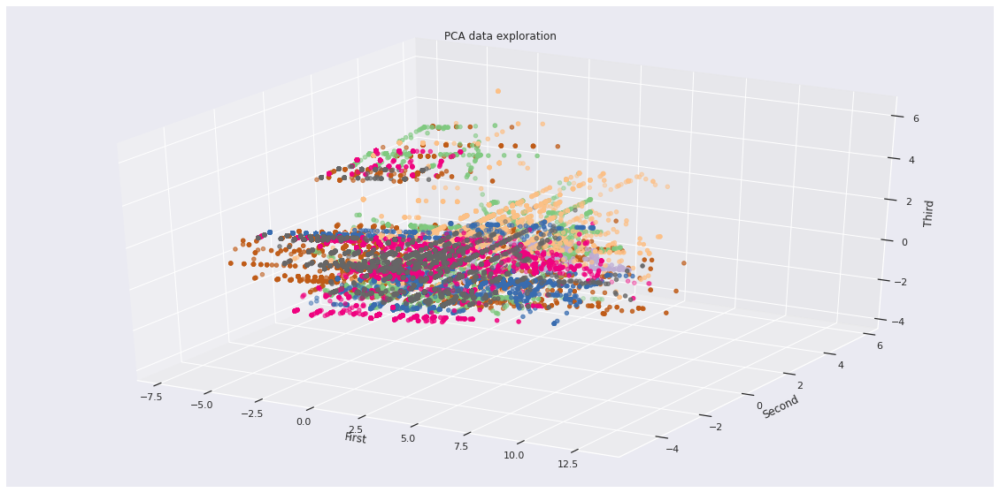

In [0]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('PCA data exploration')


Since LDA seems to provide better explanation of variance and the charts present better seperation of clusters we will use the LDA components for cluster analysis. 

### Basic Clustering
The clustering in this section will be on the LDA components with basic clustering algorithms. This clustering will help get an understanding of how the algorithms are working with default parameters before moving on to more advanced techniques in the GMM and Kmeans Clustering section and beyond. 

#### Clustering with PCA

Next we will apply our PCA dimensional reduction procedure to build a simple cluster to see how it looks visually and to see what a baseline PCA cluster would look like on a silhouette score and RF accuracy score. 

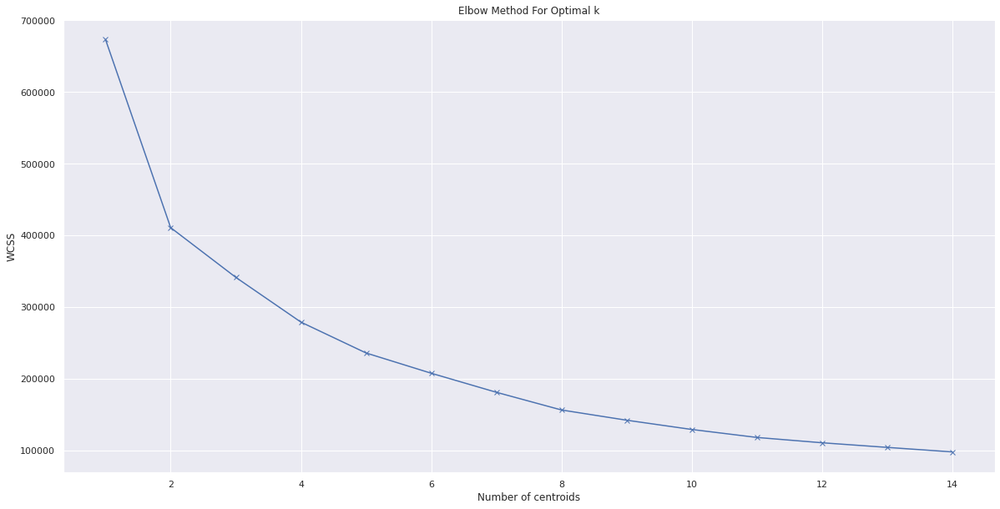

In [0]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
wcss = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(projected)
    wcss.append(km.inertia_)
plt.plot(K, wcss, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('WCSS')
plt.title('Elbow Method For Optimal k')
plt.show()

For this baseline proceedure, we decided to use the kmeans cluster algorithm since is built to build clusters based on distances between centroid points and the nearby plots, which seemed to align with the liquor classifiers we used in our exploratory data analysis. 

Using Kmeans, we started by looking at an elbow plot using the within cluster sum of squares across the number of centroids (WCSS). Here, we saw a bit of an elbow at 2 centroids, which suggests that we might get the most efficiency out of two clusters. However, we are going to move forward with 7 since that aligns to the number of liquor types we are classifying. 

In [0]:
from sklearn.cluster import KMeans

#converting our projected array to pandas df
pca=pd.DataFrame(projected)
pca.columns=['First Component','Second Component', 'Third Component']
#build our algorithm with k=7, train it on pca and make predictions
kmeansx = KMeans(n_clusters=7, init='k-means++', random_state=0)
kmeansx.fit(pca)
y_kmeans = kmeansx.predict(pca)
newfeature = kmeansx.labels_


X1CV = np.column_stack((pca,pd.get_dummies(newfeature)))
#plotting the results 
#plt.scatter(pca['First Component'], pca['Second Component'], c=y_kmeans, s=50, alpha=0.5,cmap='viridis')
centers = kmeansx.cluster_centers_
#plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50)
#plt.scatter(centers[:, 0], centers[:, 1], c='red', s=50)

We set up our kmeans set with an init of k0means++ with a number of clusters of 7 to test against our pca dataframe. Next, we will set our X, Y and Z as our 3 eigenvector features.  with L being the Y values (the liquor ids).

In [0]:
centers

array([[-0.43730214, -2.5647742 ,  1.80328633],
       [-2.76829742, -0.24115803, -0.72006339],
       [ 2.1038982 ,  0.76067221,  0.31182629],
       [-0.77176727,  1.3352179 , -0.0271654 ],
       [ 5.19395078, -0.90062178,  0.63193638],
       [-4.12653062, -0.08898145,  2.84131778],
       [ 0.72402266, -0.87085557, -0.93980359]])

In [0]:
X1P = pcaydf['First Component']
Y1P = pcaydf['Second Component'] 
Z1P = pcaydf['Third Component']
L1P = y_kmeans

Text(0.5, 0.92, 'PCA Clustering with basic Kmeans')

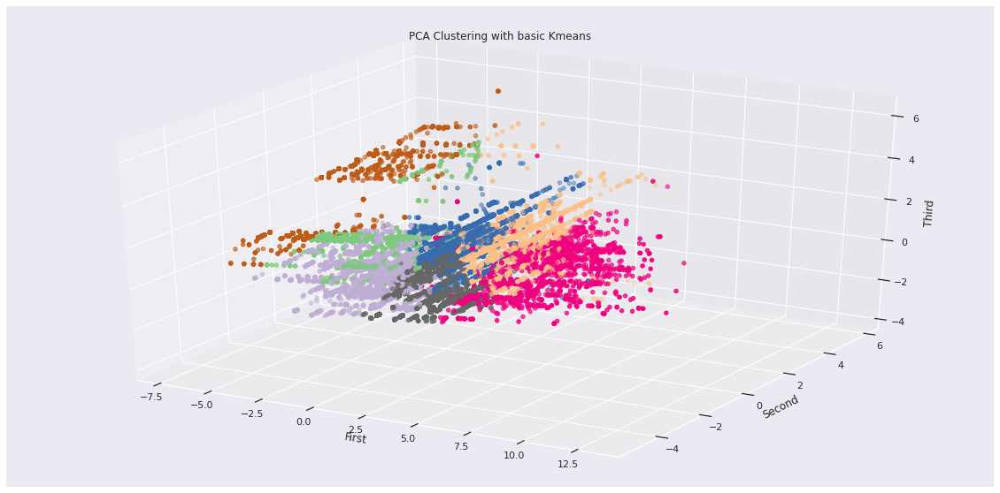

In [0]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('PCA Clustering with basic Kmeans')

In [0]:
from sklearn.metrics import silhouette_score

# Get silhouette score
knnb_sil = silhouette_score(pcaydf, L1P, random_state=123456789)
print("Average KNN Silhouette Score:", knnb_sil)

Average KNN Silhouette Score: 0.18337898578537762


From the eye test,it seems like our kmeans produce some nice clustering from a 3 dimensional viewpoint. OUtside of our green and red clusters, just about all of them look to have a similar shape and size. 

With that said, after looking at our silhouette score, we had a 0.18 which is pretty close to zero. Meaning there is not a lot of differences between observations in different clusters. This is not ideal as it suggests that our clusters did not do a good job of separating distinct groups of observations. This kind of makes sense, as we saw in our scatter plots of the 7 liquor types, there was some overlap between our groups of liquors, and it seems like the Kmeans didn't do a great job of separating them. 

In [0]:
y1_train_res

array(['3', '6', '6', ..., '7', '7', '7'], dtype=object)

In [0]:
#converting our projected array to pandas df
pca=pd.DataFrame(projected)
pca.columns=['First Component','Second Component', 'Third Component']
#pca = pca.drop('Third Component', axis=1)
pca

,First Component,Second Component,Third Component
0,-0.730711,1.228078,0.639764
1,1.973879,-0.239270,0.674849
2,-4.882039,-3.941854,1.838042
3,-1.955020,-0.596873,1.350918
4,-3.328261,0.448664,-0.465526
...,...,...,...
73523,-4.135075,-2.457265,1.671048
73524,1.765744,0.808785,-1.070692
73525,-1.842718,0.262241,-0.142827
73526,1.460542,1.336095,0.460985


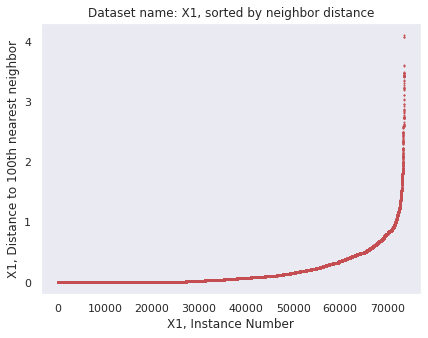

In [0]:
# lets first look at the connectivity of the graphs and distance to the nearest neighbors
from sklearn.neighbors import kneighbors_graph

#=======================================================
# CHANGE THESE VALUES TO ADJUST MINPTS FOR EACH DATASET
X1_N = 100
#=======================================================

# create connectivity graphs before calcualting the hierarchy
X1_knn_graph = kneighbors_graph(pca.values, X1_N, mode='distance') # calculate distance to four nearest neighbors


N1 = X1_knn_graph.shape[0]
X1_4nn_distances = np.zeros((N1,1))
for i in range(N1):
    X1_4nn_distances[i] = X1_knn_graph[i,:].max()

X1_4nn_distances = np.sort(X1_4nn_distances, axis=0)


plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range(N1), X1_4nn_distances, 'r.', markersize=2) #plot the data
plt.title('Dataset name: X1, sorted by neighbor distance')
plt.xlabel('X1, Instance Number')
plt.ylabel('X1, Distance to {0}th nearest neighbor'.format(X1_N))
plt.grid()

The plot above takes a look at the average distance between the nearest neighbor amonng our clusters. Looking at the plot, we can see the vast majority of our observations nearly right next to one another and almost overlapping. Only a few outliers are going to have a distance of 1 away from another observations. This is not far from expected as we discussed previously, where all the observations kind of seemed to be a giant blob. 


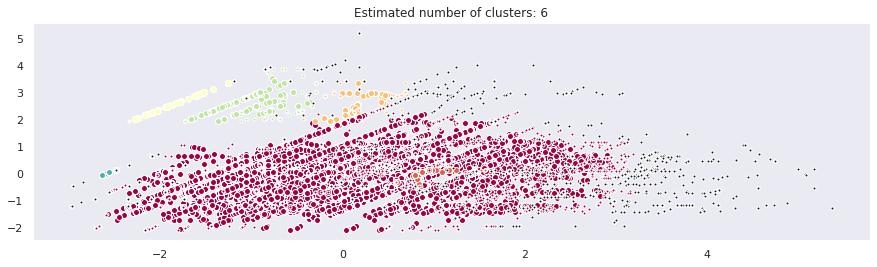

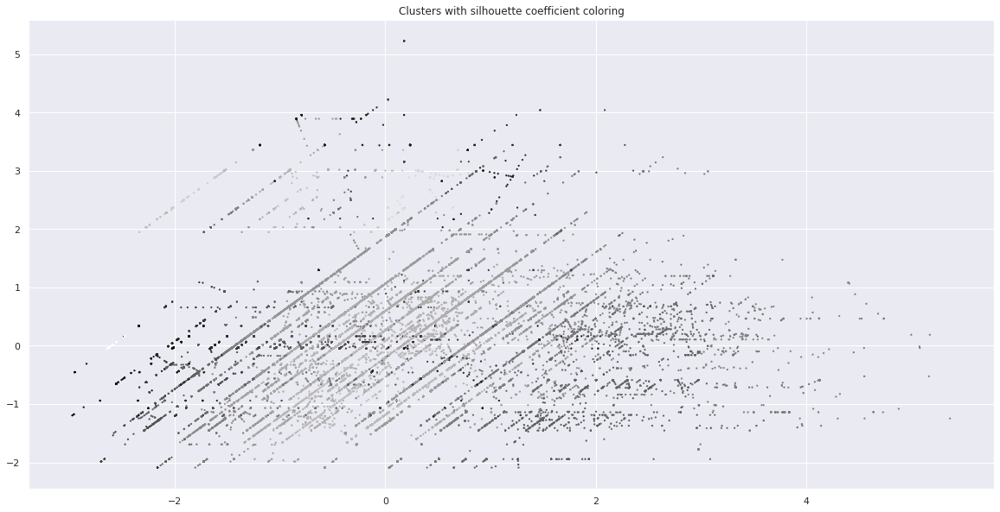

CPU times: user 1min 16s, sys: 5.99 s, total: 1min 22s
Wall time: 1min 7s


In [0]:
%%time 

from sklearn.cluster import DBSCAN

#=====================================
# ENTER YOUR CODE HERE TO CHANGE MINPTS AND EPS FOR EACH DATASET
X1_minpts = X1_N # from above
X1_eps = .8
#=====================================

db = DBSCAN(eps=X1_eps, min_samples=X1_minpts).fit(pca)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

# mark the samples that are considered "core"
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True

plt.figure(figsize=(15,4))
unique_labels = set(labels) # the unique labels
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = 'k'

        class_member_mask = (labels == k)

        xy = X1_train_res[class_member_mask & core_samples_mask]
        # plot the core points in this class
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='w', markersize=6)

        # plot the remaining points that are edge points
        xy = X1_train_res[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=col,
                 markeredgecolor='w', markersize=3)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.grid()
plt.show()

silhouette_per_sample = metrics.silhouette_samples(X1_train_res, labels)

plt.figure()
plt.scatter(X1_train_res[:, 0], X1_train_res[:, 1], c=silhouette_per_sample,
                cmap=plt.cm.gray, s=5, linewidths=0)
plt.title('Clusters with silhouette coefficient coloring')
plt.show()

Next we will take a look at DBScan clustering which, instead of a lot of clustering algorithms we will review in this lab, DB scan focuses on the density of the observations rather than the proximity. So it will focus the clusters on the changes in density which may account for the overlapping data we are seeing. 

Above, you can see the 2d plot of our dbscan on 6 clusters. Unfortunately, on our clustering, it focused the red cluster on the main blob of our PCA dataset.  

In [0]:
X1P = pcaydf['First Component']
Y1P = pcaydf['Second Component'] 
Z1P = pcaydf['Third Component']
L1P = labels

Text(0.5, 0.92, 'PCA Clustering with basic DBSCAN')

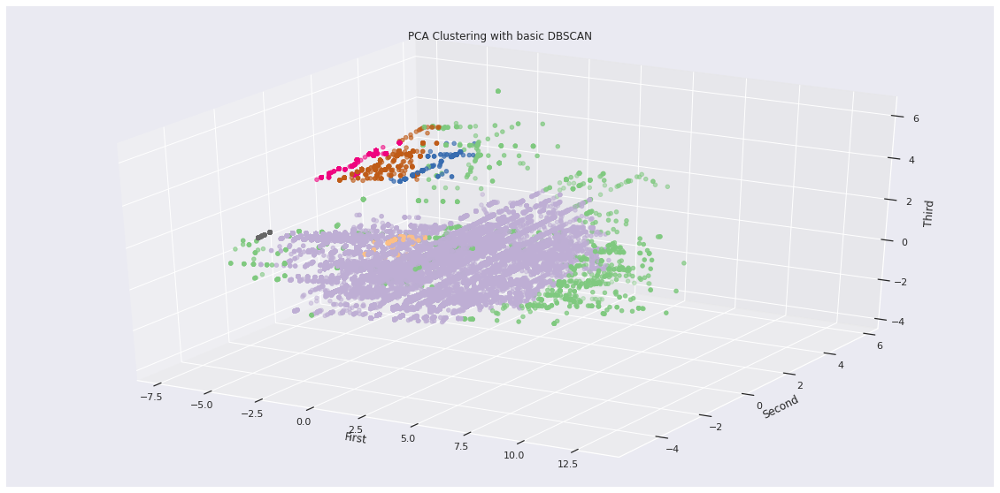

In [0]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('PCA Clustering with basic DBSCAN')

Our 3 dimensional plot on the PCA dataset tells a similar story as our 2 dimensional plot above. We can see that a large majority of our data falls within a single cluster (purple), which may be problematic considering we are working with balanced values for our liquor id. 

In [0]:
from sklearn.metrics import silhouette_score

# Get silhouette score
dbscansil = silhouette_score(pcaydf, L1P, random_state=123456789)
print("Average DBSCAN Silhouette Score:", dbscansil)

Average DBSCAN Silhouette Score: 0.1389857041450821


Additionally, we are seeing a silhouette score of 0.14 for our DBScan, which was lower than our Kmeans silhouette score of 0.18. Since we are going to be focusing on silhouette score to evaluate the value of our clusters, we will not use a DBscan moving forward with our classifier model. 

In [0]:
from sklearn import metrics

print('Estimated number of clusters: %d' % n_clusters_)
print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, labels))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, labels))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, labels))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, labels))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, labels, average_method='arithmetic'))
#print("Silhouette Coefficient: %0.3f"
     # % metrics.silhouette_score(y1_train_res, labels))

Estimated number of clusters: 6
Homogeneity: 0.015
Completeness: 0.089
V-measure: 0.026
Adjusted Rand Index: 0.001
Adjusted Mutual Information: 0.026


One of the major challenges with clusters is evaluating the performance of the clusters beyond a subjective eye level test. For our evaluation models, we will want to exploy a series of scores that we can calculate using the Y values we created using the SMOTE test as well as the labels we defined in the function above. These measures include Homogeneity, Completeness, V-Measure, Adjsuted Rand Index, and Adjusted Mutural Information.

Regarding the Homogeneity score, we can see that we are very close to Zero on the Homeogeneity score, which would suggest that our model is very far from being perfectly homogenous. Our score of 0.016, shows that we are seeing a variety of sizes in our clusters, even after we ran a SMOTE to balance the variables.

Regarding completeness, a cluster is considered to be complete if all the data points are memebers of a given class are elements of the same cluster. Our score of 0.094 sugests that we are not seeing a lot of alignment between clusters and join performance.

With the V-measure for evaluating clustering performance, we are using the homogeneity and completeness varaibles we calculated previously to give us a score that is independent of class labels, number of clusters and size of the data. In our case, we recieved a score of 0.028 which aligns with our completeness and homogeneity score that our cluster is not surfacing a missing variable.

The Rand Index is a measure of similarity between data clusterings, our score of 0.001, shows that we are very far from having similar data clusters.

Adjusted mutual information, is another measure to compare clusters by correcting the effect of the agreement of the clusters solely due to chance between clusterings. Our score of 0.028 suggests that there is very limited similarity between our clusters.

In [0]:
#pca=pd.DataFrame(projected)
pca.columns=['First Component','Second Component', 'Third Component']
#pcasubset=pca.sample(n=30000)

#### Clustering with LDA

Since the goal of the clusteirng for this lab is to help improve on classifications that were used in lab2(https://github.com/jjschueder/7331DataMiningNotebooks/blob/master/lab2/Lab2_Daniel_Jeff_Armando_Joe(Final2).ipynb)  we thought that dimensionltiy reduction using Linear discriminant analysis might be useful since a Y target is specified and the algorithm optimizes based on the target. Since cluserting is easiest to visualize in three dimenions or less and three dimensions explains 90 plus percent of variance 3  was chosen as the number of components. Additionally, against our initial RF run, our LDA performed better than our PCA. 

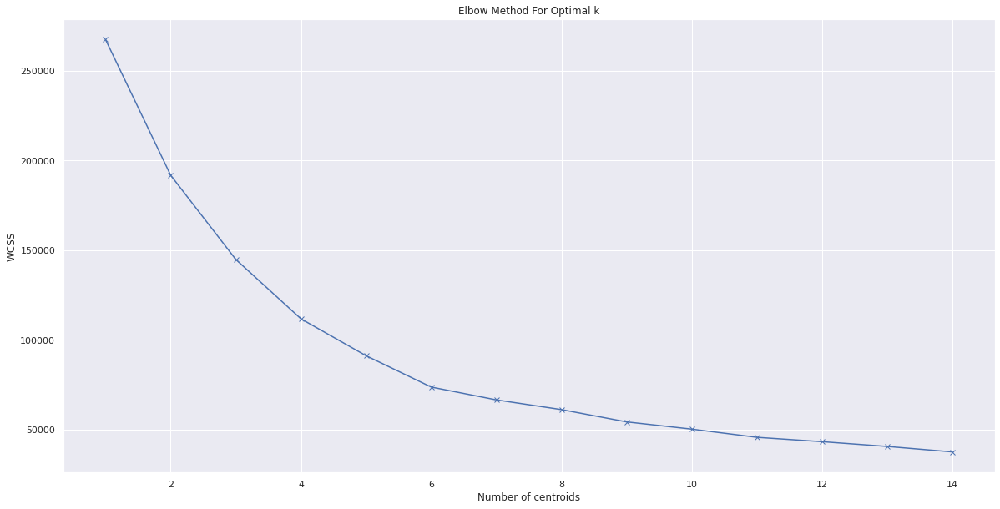

In [0]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
wcss2 = []
K2 = range(1,15)
for k in K2:
    km2 = KMeans(n_clusters=k)
    km2 = km2.fit(X_train_lda)
    wcss2.append(km2.inertia_)
plt.plot(K2, wcss2, 'bx-')
plt.xlabel('Number of centroids')
plt.ylabel('WCSS')
plt.title('Elbow Method For Optimal k')
plt.show()

Lookng at our elbow method on the LDA dataset and the kmeans clustering algorithm, we can see that we are seeing a bit of an elbow around the 6 and 7 point, which is reassuring considering we are goingn to be looking to strengthen our classifier against the 7 liquor types. So moving forward we will see how our clusters perform on 7 clusters to start with. 

We can later test our number of clusters to see if we can improve our silhouette score. However, for efficiency, we will need to come to our best cluster and our best tuning parameters for each. 

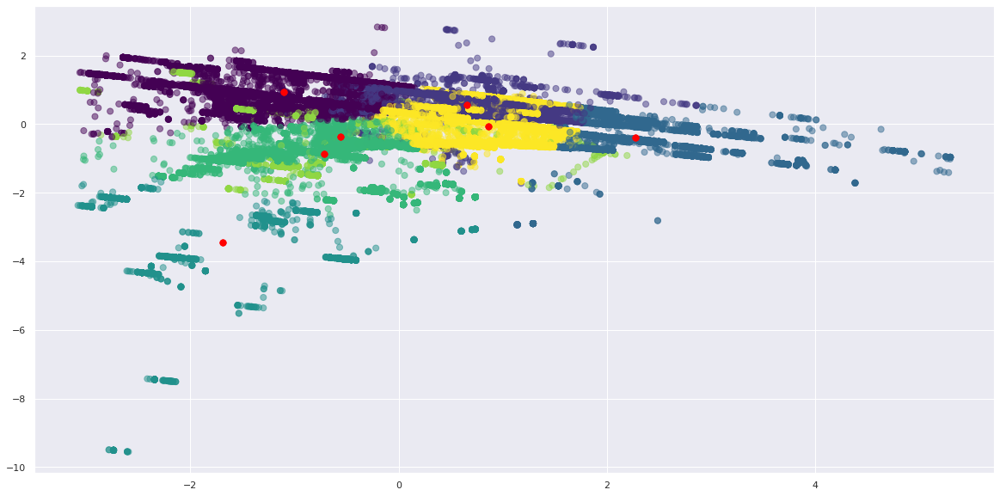

In [0]:
from sklearn.cluster import KMeans

#converting our projected array to pandas df

#build our algorithm with k=7, train it on pca and make predictions
#kmeanslda = KMeans(n_clusters=7, init='k-means++', random_state=1,n_init=5, tol=.0001).fit(X_train_ldadf)
#n_clusters=7, init='k-means++',random_state=1, n_init=5, tol=.0001
kmeanslda = KMeans(n_clusters=7, init='random', random_state=1, n_init=5, tol=.0001).fit(X_train_ldadf)
y_kmeanslda = kmeanslda.predict(X_train_ldadf)
newfeaturelda = kmeanslda.labels_
X1CVLDA = np.column_stack((X_train_ldadf,pd.get_dummies(newfeaturelda)))
#plotting the results 
plt.scatter(X_train_ldadf['First Component'], X_train_ldadf['Second Component'], c=y_kmeanslda, s=50, alpha=0.5,cmap='viridis')
centerslda = kmeanslda.cluster_centers_
plt.scatter(centerslda[:, 0], centerslda[:, 1], c='red', s=50)
plt.scatter(centerslda[:, 0], centerslda[:, 1], c='red', s=50)

As you can see above, our LDA plot has a bit of a different shapen than our PCA plot with most of the data at the top in a more elongated distribution. 

In [0]:
X1P = X_train_ldadf['First Component']
Y1P = X_train_ldadf['Second Component'] 
Z1P = X_train_ldadf['Third Component']
L1P = y_kmeanslda

Text(0.5, 0.92, 'LDA Clustering with basic Kmeans')

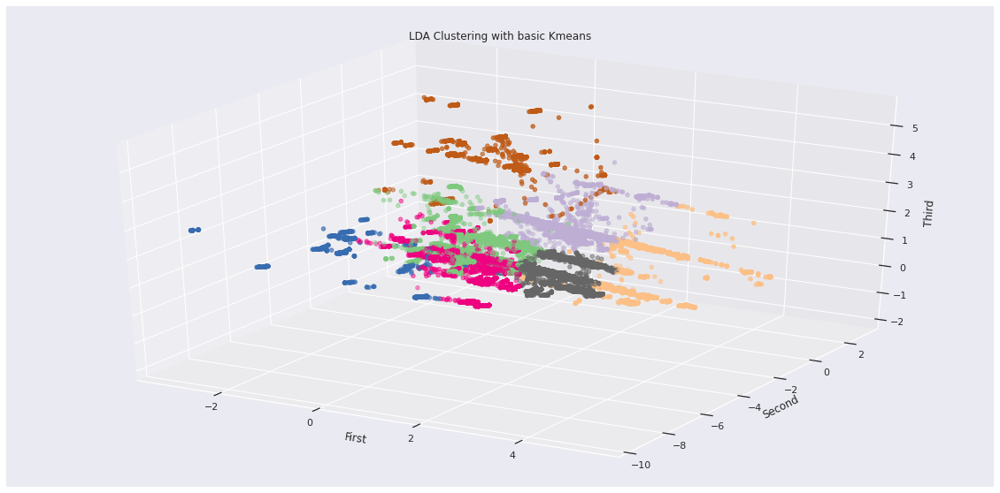

In [0]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('LDA Clustering with basic Kmeans')

Looking into the 3rd dimension, we can see that our LDA is a little more separated than our 2d plot above. Looking at our silhouette score for kmeans, we can see below that we have a very high score of 0.39 which is much stronger than our PCA dataset below. So we will be looking further into Kmeans to see if we can improve our score with kmeans. 

In [0]:
from sklearn.metrics import silhouette_score

# Get silhouette score
knnb_sil = silhouette_score(X_train_ldadf, L1P, random_state=1)
print("Average KNN Silhouette Score:", knnb_sil)

Average KNN Silhouette Score: 0.3875390099700049


Next, we are going to look into our Gaussian Mixture Modeling cluster algorithm (GMM) to see how it performs compared to Kmeans and DBscan. The reason we are going to look at GMM in comparision to Kmeans (particularly, because it's a distance based algorithm), is that GMM accounts for uncertainty that the Kmeans does not account for. 

First we will apply it to our LDA dataset and test it against 7 clusters. 


In [0]:
from sklearn.mixture import GaussianMixture as GMM
# Fit 7 clusters using 'spherical' covariance type
gmm_sphere = GMM(n_components=7,
          random_state=1,
          covariance_type='spherical'
          )
gmm_X_sphere = X_train_lda
gmm_sphere.fit(gmm_X_sphere)
gmm_clusters_sphere = gmm_sphere.predict(gmm_X_sphere)

In [0]:
X1P = X_train_ldadf['First Component']
Y1P = X_train_ldadf['Second Component'] 
Z1P = X_train_ldadf['Third Component']
L1P = gmm_clusters_sphere

Text(0.5, 0.92, 'LDA Clustering with basic GMM')

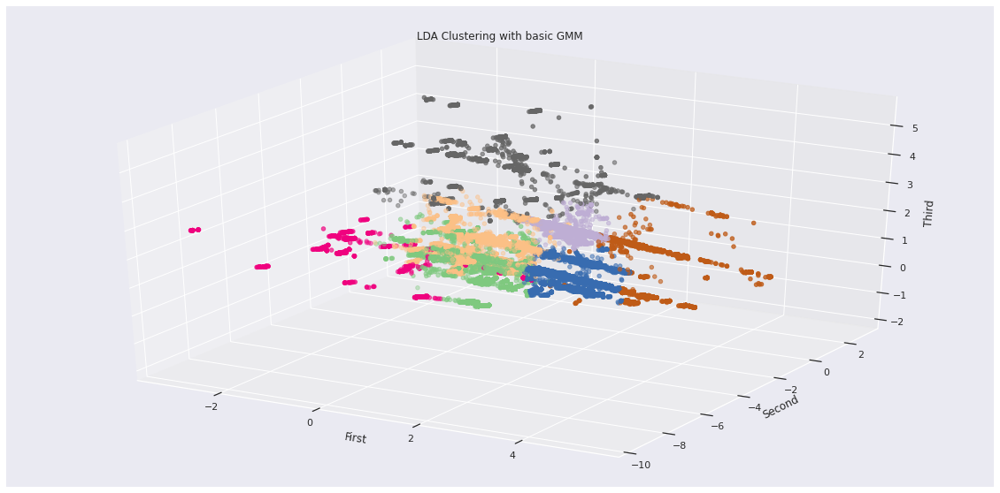

In [0]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('LDA Clustering with basic GMM')

Reviewing the Gaussian score, we can't see a ton of difference between the visual that came out of the Kmeans. ONe thing that also came out was the fact that the Gaussian mixture was very quick to run in comparision to the other models. 

In [0]:
from sklearn.metrics import silhouette_score

# Get silhouette score
gmmsimp_sil = silhouette_score(X_train_ldadf, L1P, random_state=1)
print("Average GMM Silhouette Score:", gmmsimp_sil)

Average GMM Silhouette Score: 0.3696252993999284


Looking at our silhouette score, we can see that we achieved a high score as well, and comparable to our Kmeans at 0.37. This is strong and something we may want to look into when we get into our advanced clustering. 

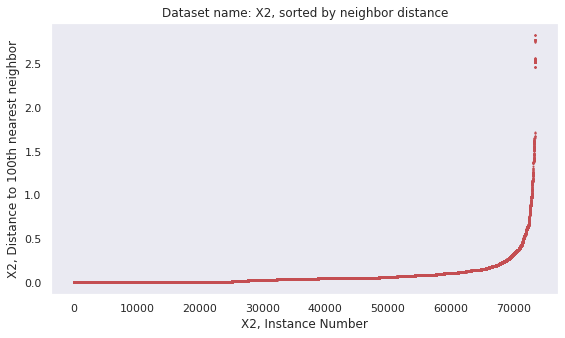

In [0]:
# lets first look at the connectivity of the graphs and distance to the nearest neighbors
from sklearn.neighbors import kneighbors_graph

#=======================================================
# CHANGE THESE VALUES TO ADJUST MINPTS FOR EACH DATASET
X2_N = 100
#=======================================================

# create connectivity graphs before calcualting the hierarchy
X2_knn_graph = kneighbors_graph(X_train_ldadf, X2_N, mode='distance') # calculate distance to four nearest neighbors


N2 = X2_knn_graph.shape[0]
X2_4nn_distances = np.zeros((N1,1))
for i in range(N2):
    X2_4nn_distances[i] = X2_knn_graph[i,:].max()

X2_4nn_distances = np.sort(X2_4nn_distances, axis=0)


plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.plot(range(N2), X2_4nn_distances, 'r.', markersize=2) #plot the data
plt.title('Dataset name: X2, sorted by neighbor distance')
plt.xlabel('X2, Instance Number')
plt.ylabel('X2, Distance to {0}th nearest neighbor'.format(X2_N))
plt.grid()

Looking at the distance between clusters, we are seeing similar news to our PCA and our Kmeans score with regards to the distance between points in each of our clusters. As we can see, most of oru points are very close to one another with just a few outliers further than 2.5 distance from the others. 

In [0]:
%%time 

from sklearn.cluster import DBSCAN

#=====================================
# ENTER YOUR CODE HERE TO CHANGE MINPTS AND EPS FOR EACH DATASET
X2_minpts = X2_N # from above
X2_eps = .8
#=====================================



db2 = DBSCAN(eps=X2_eps, min_samples=X2_minpts).fit(X_train_ldadf)
labels2 = db2.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels2)) - (1 if -1 in labels2 else 0)

# mark the samples that are considered "core"
core_samples_mask2 = np.zeros_like(db2.labels_, dtype=bool)
core_samples_mask2[db2.core_sample_indices_] = True

plt.figure(figsize=(15,4))
unique_labels2 = set(labels2) # the unique labels
colors2 = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels2)))


CPU times: user 11.5 s, sys: 3.08 s, total: 14.6 s
Wall time: 14.7 s


<Figure size 1080x288 with 0 Axes>

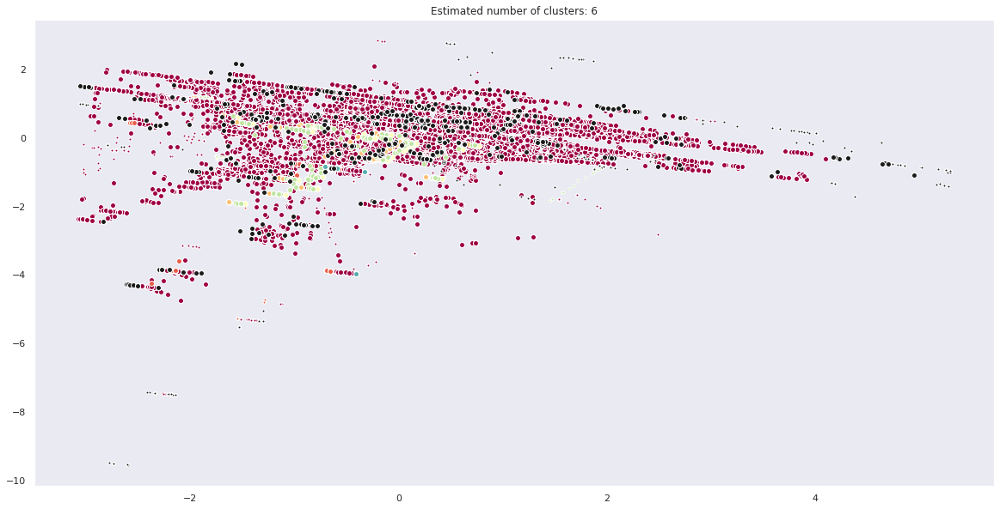

In [0]:
for k, col in zip(unique_labels2, colors2):
        if k == -1:
            # Black used for noise.
            col = 'k'

        class_member_mask2 = (labels == k)

        xy2 = X_train_ldadf[class_member_mask2 & core_samples_mask2]
#        print(xy2['First Component'], xy2['Second Component'])
        # plot the core points in this class
        plt.plot(xy2['First Component'], xy2['Second Component'], 'o', markerfacecolor=col,
                 markeredgecolor='w', markersize=6)

        # plot the remaining points that are edge points
        xy2 = X_train_ldadf[class_member_mask2 & ~core_samples_mask2]
        plt.plot(xy2['First Component'], xy2['Second Component'], 'o', markerfacecolor=col,
                 markeredgecolor='w', markersize=3)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.grid()
plt.show()

Next, we are going to run our DBScan against our LDA dataset, to which we tuned our eps and minpts so that we end up with as close to 7 clusters as possible (we ended up with 6), and like we saw previously, we can see that the red cluster is taking up a vast majority of our points with a smattering of red and black.

Looking at the 3d plot below, we cans see this case is still going with Purple taking up the majority of the observations. Even if we end up with a strong silhouette score, this could prove to be problematic because we know that our liquor id are balanced evenly, so an unbalanced cluster will likely not help to improve our classifier. 

In [0]:
X1P = X_train_ldadf['First Component']
Y1P = X_train_ldadf['Second Component'] 
Z1P = X_train_ldadf['Third Component']
L1P = labels2

Text(0.5, 0.92, 'LDA Clustering with basic DBSCAN')

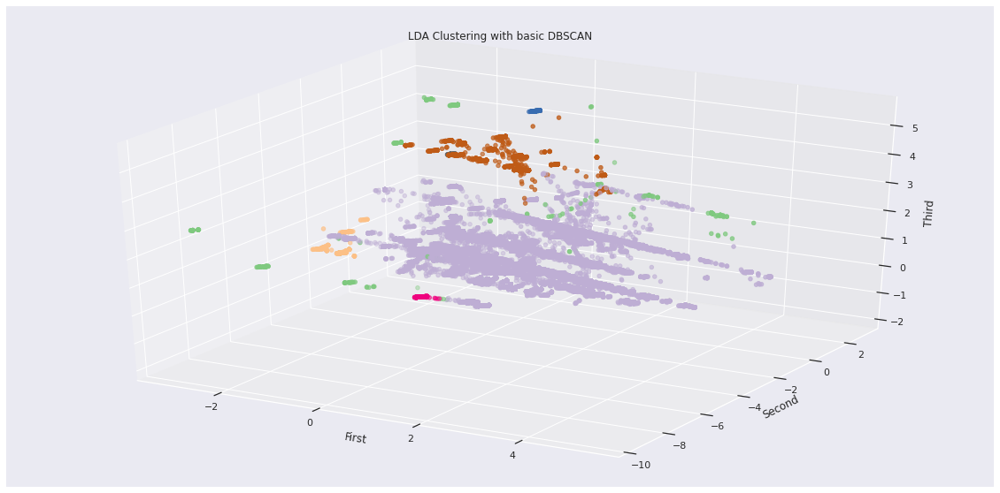

In [0]:
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
ax.scatter(X1P, Y1P, Z1P, c=L1P, cmap='Accent', linewidth=1)

ax.set_xlabel('First')
ax.set_ylabel('Second')
ax.set_zlabel('Third')
plt.title('LDA Clustering with basic DBSCAN')

In [0]:
from sklearn.metrics import silhouette_score

# Get silhouette score
dbscan_sil = silhouette_score(X_train_ldadf, labels2, random_state=1)
print("Average DB Scan Silhouette Score:", dbscan_sil)

Average DB Scan Silhouette Score: 0.37927858505071527


Here, we recieved an haverage silhouette score with our dbscan of 0.38 which was higher than our GM but lower than our Kmeans. 

As we discussed before, since our visual of our clusters emerging form Dbscan compared to GMM, we are going to move forward with GMM as the clusters are more evenly distributed in comparision. 

Additionally, we will be running our Kmeans cluster into our next step of advanced clustering since it gave us our highest silhouette score. 

### Advanced Clustering  
This section contains more complex clustering configurations with more dimension and paramater tuning to attempt to find clusters that may provide more meaning than the simple liquor classification. 

As discussed, we will be focusing on the GMM and the Kmeans because they had a more even distribution of observations per cluster across the 7 clusters we assigned. 

#### GMM Clustering

Visualizing the dataset, we want to see if there are some discrete clusters in the 3 dimensional space. To do this, we will run a Gaussian Mixture model clustering which would allow for normally distributed clusters of varying shapes and sizes. We will attempt to fit one to obtain clusters for the 7 liquor types, and set our cluster number to 7. 

In [0]:
from sklearn.mixture import GaussianMixture as GMM

# Fit 7 clusters
#  Set random state to '123456789' to make sure same result achieved each time
gmm = GMM(n_components=7,
          random_state=123456789
          )

X1DF = pd.DataFrame(X_train_ldadf)
#X1DF = pd.DataFrame(X_train_ldadf, columns =X2.columns)

gmm_X = X1DF
X1DF = X1DF.fillna(X1DF.mean())

#gmm_labels = gmm.fit_predict(gmm_X)
gmm_labels = gmm.fit(gmm_X)
gmm_labels
gmmfit = gmm.fit(gmm_X)
gmm_clusters = gmm.predict(gmm_X)

In [0]:
gmm_X

,First Component,Second Component,Third Component
0,1.852523,-0.325218,-0.568042
1,0.503710,-0.559245,-0.301683
2,-2.605320,-9.548445,3.060544
3,0.977749,-1.028097,-0.804148
4,0.352159,0.226342,-0.514595
...,...,...,...
73523,-0.480061,-3.946357,-0.458794
73524,0.413062,0.371832,-0.077879
73525,0.421622,-0.594939,-0.213865
73526,0.668930,0.721464,0.896868


This is a non-optimized GMM model we can use as a baseline cluster. From here, we will adjust the parameters in an attempt to optimize the fit of our clusters. One key parameter we will be looking to optimize for GMM is the covariance type which will control how the covariances are treated between clusters. By default, 'full' is used which allows each cluster it's own general covariance matrix. This is a strong baseline and can be helpful on it's own as a strong clustering method for our data. To this end, we will test 'tied', which each component shares the same covariance matrix but it is still defined as a general covariance matrix. The other alternatives are 'diagnosis' and spherical', but these constrain the covariance matrix that is possible and which we do not think would provide a good fit for our data. 

In [0]:
# Fit 7 clusters using 'tied' covariance type
gmm_tied = GMM(n_components=7,
          random_state=123456789,
          covariance_type='tied'
          )
gmm_X_tied = X1DF
gmm_tied.fit(gmm_X_tied)
gmm_clusters_tied = gmm_tied.predict(gmm_X_tied)

It seams that this covariance type may be beneficial to our clusters. If this is successful, we will also test out 'sphericity' and 'diagonal' to be sure that we are using the optimal method. 

In [0]:
# Fit 7 clusters using 'spherical' covariance type
gmm_sphere = GMM(n_components=7,
          random_state=123456789,
          covariance_type='spherical'
          )
gmm_X_sphere = X1DF
gmm_sphere.fit(gmm_X_sphere)
gmm_clusters_sphere = gmm_sphere.predict(gmm_X_sphere)

In [0]:
# Fit 7 clusters using 'diag' covariance type
gmm_diag = GMM(n_components=7,
          random_state=123456789,
          covariance_type='diag'
          )
gmm_X_diag = X1DF
gmm_diag.fit(gmm_X_diag)
gmm_clusters_diag = gmm_diag.predict(gmm_X_diag)

The spherical and diagonal covariance were too constraining to our clusters and both negatively impacted our silhouette score compared to the tied. With that said, we will move forward with the 'tied' covariance type (a shared general covariance matrix) as it is looking to be optimal to our sensor clusters. We will use this moving forward for our subsequent GMM clustering. 

We will also be looking at our init_params parameter. There could be some initial weights, averages and precisions that became apparent in our clustering that we can include in our GMM algorithm so it can correctly start clustering. This is performed by a single round of k-means clustering with a round specified in n_init. 

We will test these parameters 3 and 10 init to see if they increase our silhouette score. First, let's begin by testing random initiation rather than one based on k-means:

In [0]:
# Fit 7 clusters with random initiation
gmm_rand = GMM(n_components=7,
               random_state=123456789,
               covariance_type='tied',
               init_params='random'
               )
gmm_X_rand = X1DF
gmm_rand.fit(gmm_X_rand)
gmm_clusters_rand = gmm_rand.predict(gmm_X_rand)

One benefit of using random initiation is that the processing time decresed significantly, likely because the initial k-means requires substantial processing that can be circumvented by running a random init instead. This is intesting because it suggests the GMM algorithm itself is relatively quick, but the K-means can take a long time to compute. 

The last parameter of interest is in some ways the opposite of the previous test; we would now like to see if multiple initiation cycles with k-means will produce a better score than only one. The GMM function will pick the most beneficial initiation out of all the iterations the user specifies. For this, we will look at 3 iterations against our previous GMM of a single k-means iteration. 

In [0]:
# Fit 7 clusters with 3 k-means init
gmm_3init = GMM(n_components=7,
               random_state=123456789,
               covariance_type='tied',
               init_params='kmeans',
               n_init=3
          )
gmm_X_3init = X1DF
gmm_3init.fit(gmm_X_3init)
gmm_clusters_3init = gmm_3init.predict(gmm_X_3init)

The test took slightly longer than the previous clustering steps, as the GMM clusetering step took time to process the 3 k-means iterations. It also markedly improved our best score, so we will test the same model building step but this time with 10 iterations. 

In [0]:
# Fit 7 clusters with 3 k-means init
gmm_10init = GMM(n_components=7,
               random_state=123456789,
               covariance_type='tied',
               init_params='kmeans',
               n_init=10
          )
gmm_X_10init = X1DF
gmm_10init.fit(gmm_X_10init)
gmm_clusters_10init = gmm_10init.predict(gmm_X_10init)

With 10 k-means iterations, this model took some time to cluster, however, we did not increase our score over the 3 iterations at all. This means that the iteration that reuslted in the best initial k-means clustering over 10 iterations is also found within the first 3 iterations. In the following section, we will quantatatively analyze our clustering fits with the previously descibed parameter adjustments and conclude with what GMM model performed the best. 

In modeling and evaluation 2, we will look quantitatively at our clustering fits with the previously descibed parameter adjustments and conclude with what GMM custering model perfomed the best. 

Next we will look at the different parameters we are set to run on Kmeans. 

#### KMeans Clustering

Kmeans identifies clusters based on the number and the clusters required. The goal with Kmeans is the classify 'n' observations into 'k' cluster using centroids which are the calculated means by selected observations. We are using 78k with 7 clusters, whith each point being classified by it's closest Centroid. 

As per the test below, as with GMM previously, we will test a couple different parameter configurations to find the opitmal configurations and to see the comparison with each other and against the GMM clusters using the silhouette score from Modeling and Evaluation 2. 

K means in general is a useful way to execute the code, but has a lot of parameter options we can use to find the optimal. The parameters of interest can be found below: 

n_clusters: This will remain 7 as this corresponds to the number of liquor categories. We can further test the number of clusters once we get to a solid algorithm.

init:
k-means++: to increase efficiency, try to guess the centroids and work from there  
random: initially try to ramdomly place centroids, then start  

n_init: number of times the kmeans will be run against different centroid seeds then pick the best one. In this case will try 1 for efficiency and then 5 for better results (default is 10, but after testing did not pay to go more than five, also each itteration takes around 5-7 seconds, so 10 itterations could take 1 minute).  

tol: relative tolerance to declare convergence of a point within a cluster. This will be tested at

random_state = 1: This will remain the same to keep make the guessing of the clusters deterministic  

All others will remain as their default as they do not seem to have relevance with this dataset.

In [0]:
# Set up results matrix
df_kms_result = pd.DataFrame(
{'Configuration':['Config 1','Config 2','Config 3','Config 4','Config 5','Config 6'],
'SilhouetteScore':[None,None,None,None,None,None],
'RelativeTime':[None,None,None,None,None,None]})

##### Configuration 1: 'init' parameter set to k-means++

In [0]:
%%time
# config 1

from sklearn.cluster import KMeans
from sklearn.model_selection import StratifiedKFold, cross_val_score, ShuffleSplit

# Fit 7 clusters
kms = KMeans(n_clusters=7, init='k-means++',random_state=1, n_init=5, tol=.0001)
kms_X = X1DF
kmsfit = kms.fit(kms_X)
kms_clusters = kms.predict(kms_X)
kms_clusters

df_kms_result.loc[0, 'RelativeTime'] = 'Medium'

CPU times: user 750 ms, sys: 532 ms, total: 1.28 s
Wall time: 678 ms


Using what is generally the default parameter tuning, this looks like a strong base case with regards to the time it took to run. 

##### Configuration 2: 'init' parameter set to random

In [0]:
%%time
# config 2

from sklearn.cluster import KMeans

# Fit 7 clusters
kms2 = KMeans(n_clusters=7, init='random', random_state=1, n_init=5, tol=.0001)
kms_X = X1DF
kms2fit = kms2.fit(kms_X)
kms_clusters2 = kms2.predict(kms_X)
kms_clusters2
df_kms_result.loc[1, 'RelativeTime'] = 'Medium High'

CPU times: user 696 ms, sys: 83.5 ms, total: 780 ms
Wall time: 685 ms


Interestingly, we found that changing init from k-means++ does not significantly impact the time it took to run.

##### Configuration 3: 'n_init" parameter set to 1 with a tolerance set really low. 

In [0]:
%%time
# config 3

from sklearn.cluster import KMeans

# Fit 7 clusters
kms3 = KMeans(n_clusters=7, init='k-means++', random_state=1, n_init=1, tol=.0001)
kms_X = X1DF
kms3fit = kms3.fit(kms_X)
kms_clusters3 = kms3.predict(kms_X)
kms_clusters3
df_kms_result.loc[2, 'RelativeTime'] = 'Very Short'

CPU times: user 170 ms, sys: 108 ms, total: 278 ms
Wall time: 151 ms


Reducing the n_init decreases the processing time to almost instantaneous, and is the most significant factor in respect to time. For this senario, we went from over 1 second to roughly 1/4 of a second. 

##### Configuration 4: 'n_init" parameter set to 1 (with init = random as this turned out better)

In [0]:
%%time
# config 4

from sklearn.cluster import KMeans

# Fit 7 clusters
kms4 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.0001)
kms_X = X1DF
kms4fit = kms4.fit(kms_X)
kms_clusters4 = kms4.predict(kms_X)
kms_clusters4
df_kms_result.loc[3, 'RelativeTime'] = 'Short'

CPU times: user 179 ms, sys: 8.99 ms, total: 188 ms
Wall time: 181 ms


In [0]:
labels2df = pd.DataFrame(kms_clusters4, columns = ["Cluster_Label"])

In [0]:
knnmergedf = data_final.merge(labels2df, left_index=True, right_index=True)

In [0]:
from google.colab import drive
drive.mount('/content/drive/')
knnmergedf.to_csv("/content/drive/My Drive/Colab Notebooks/knnmergedf.csv")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


Setting to random from k-means++ again had the expected result of slightly increasing completion time, in this case going from 284 ms to 343 ms. 

##### Configuration 5: tol as a default higher than default 

In [0]:
%%time
# config 5

from sklearn.cluster import KMeans

# Fit 7 clusters
kms5 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.1)
kms_X = X1DF
kms5fit = kms5.fit(kms_X)
kms_clusters5 = kms5.predict(kms_X)
kms_clusters5
df_kms_result.loc[4, 'RelativeTime'] = 'Very Short'

CPU times: user 113 ms, sys: 74.9 ms, total: 188 ms
Wall time: 105 ms


Reducing the tolerance seems to decrease the time needed to run. 



##### Configuration 6: tol as default lower than default

In [0]:
%%time
# config 6

from sklearn.cluster import KMeans

# Fit 7 clusters
kms6 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.0000001)
kms_X = X1DF
kms6fit = kms6.fit(kms_X)
kms_clusters6 = kms6.predict(kms_X)
kms_clusters6
df_kms_result.loc[5, 'RelativeTime'] = 'Medium Low'

CPU times: user 260 ms, sys: 80.8 ms, total: 340 ms
Wall time: 255 ms


From the previous parameterization, we can see that loweing the tolerance, increases the time complexity. 

## Modeling and Evaluation 2 (10 points)

Evaluate and Compare (10 Points)
• Eval: Use internal and/or external validation measures to describe and compare the
clusterings and the clusters— how did you determine a suitable number of clusters for each
method? 


We are now going to work on quantifying our clustering  so that it can be compared to other potential clustering methods. While the dataset includes labels for each liquor type (which we used as 1 - 7 denoting Whiskey, Gin, Rum, ect.), the labeling is strictly nominal and not ordinal despite what the numbers may indicate. Originally, we had 10 different clusters which included Brandy and Schnapps, however since they represented such a small portion of the total dataset, so we dropped those for ease of analysis and to reduce the total size of our SMOTE. However, following the SMOTE, we ended up having balanced distributions of our liquor types. 

That said, this will be a good set up for our clustering analysis. For this example, we will rely on the silhouette metic, which is a measure of the closeness of a point to the average a the center of it's clustercombined with the smallest distance between the same point and the next closest cluster. This will be useful to allow us to quanitfy how useful our clustering. The optimal at 1.0, so higher values are desired. Among our 70,000 records, which is a subset of 17 million records from 2012 to 2019,  we will use an average of the silhouetts score for each of the points. 

Additionally, we will also be using metrics such as Homogeneity, Completeness, V-Measure, Adjsuted Rand Index, and Adjusted Mutural Information to help bolster our recommended cluster. They key score we will look at will still be silhouette, however, an overview of the supporting metrics can be found below: 

* Homogeneity Score - Measure of homogeneity within a cluster, which since we have equal numbers of observations for each liquor type, we would assume the clusters would be best served as the same size. 

* Completeness - A cluster is considered to be complete if all of the data points are members of a given class are the same cluster (in our case we will use liquor type), which will use as a pressure test to see if our clusters are building around the liquor types. 

* V-measure - uses homogeneity and completeness variables we calculated previously to give us a score that is independant of class labels. 

* Rand Index - Measures the similarity of data clusterings. 

* Adjusted Mututal Information - compares clusters by correcting the effect of the agreement of the clusters solely due to the chance between clusterings.

Note with these metrics is that they are not available with GMM, so we can only discuss with the Kmeans metric. With that said, each of these metrics are very directly correlated with silhouette score, so they shouldn't need to overshadow our silhouette score. 



#### GMM Clustering

Now that we set up our clusters, lets calculate our silhouette score which will allow us to compare the efficacy of GMM to other clustering methods as well as fine-tune the parameters of each cluster model. 

In [0]:
from sklearn.metrics import silhouette_score

# Get silhouette score
gmm_sil = silhouette_score(gmm_X, gmm_clusters, random_state=123456789)
print("Average GMM Silhouette Score:", gmm_sil)

Average GMM Silhouette Score: 0.14110053115130422


As we discussed in Modeling and Evaluation 1, we noticed a drastic increase from 0.14 to 0.36 switching from full to tied covariance. Doing this changes our model from using general covariance matrices for each clusters (full) to using a single general covaraiance for the entire clustering. We will also be testing our sperical and diagonal clustering types which contains the shared covariance matrix to the aforementioned type of matrix. The diagonal and spherical cluster proved to be the best clustering performer with a silhouette of over 0.29, due to it constraining the shared covariance matrix to the aforementioned type of matrix. 

The ranking of the covariance types in terms of silhouette score was as follows:

Spherical Cluster > Diagonal Cluster > Tied Covariance = 3 Iteration Initialization > 10 item initialization > Random > Initial, We will use Spherical Clustering Moving forward. 

The stronger silhouette score with the tied covariance makes sense from modeling and evaluation 1 because we saw with our GMM mixture model that our LDA performed the best with the shapes being consistent for each cluster. Since full covariance does not enforce a united shape, we saw a lower silhouette score that did not line up with our previous plots. 

In [0]:
# Get silhouette score
gmm_sil_tied = silhouette_score(gmm_X_tied, gmm_clusters_tied, random_state=123456789)
print("Average GMM (tied) Silhouette Score:", gmm_sil_tied)

Average GMM (tied) Silhouette Score: 0.35547762752599554


In [0]:
# Get silhouette score
gmm_sil_sphere = silhouette_score(gmm_X_sphere, gmm_clusters_sphere, random_state=123456789)
print("Average GMM (spherical) Silhouette Score:", gmm_sil_sphere)

Average GMM (spherical) Silhouette Score: 0.31720300896556086


In [0]:
# Get silhouette score
gmm_sil_diag = silhouette_score(gmm_X_diag, gmm_clusters_diag, random_state=123456789)
print("Average GMM (diagonal) Silhouette Score:", gmm_sil_diag)

Average GMM (diagonal) Silhouette Score: 0.2931897281289749


As discussed previously, next we are testing the random instantiation of our initial clusters as opposed to k-means initialization. These all ran relatively quickly on the 70k observations we used. However, we achieved some relatively low silhouette scores, producing values that are very close to zero at 0.12 for Random initialization. 

In [0]:
# Get silhouette score
gmm_sil_rand = silhouette_score(gmm_X_rand, gmm_clusters_rand, random_state=123456789)
print("Average GMM (tied, random initialization) Silhouette Score:", gmm_sil_rand)

Average GMM (tied, random initialization) Silhouette Score: 0.12497253790056842


Next, we want to test to see if we can improve our clustering fit by performing more iterations of GMM during initilization. We are going to test both 3 iterations and 10 iterations to see if we can further improve our clustering. 

In [0]:
# Get silhouette score
gmm_sil_3init = silhouette_score(gmm_X_3init, gmm_clusters_3init, random_state=123456789)
print("Average GMM (3 k-means iterations) Silhouette Score:", gmm_sil_3init)

Average GMM (3 k-means iterations) Silhouette Score: 0.3996143258371316


In [0]:
# Get silhouette score
gmm_sil_10init = silhouette_score(gmm_X_10init, gmm_clusters_10init, random_state=123456789)
print("Average GMM (10 k-means iterations) Silhouette Score:", gmm_sil_10init)

Average GMM (10 k-means iterations) Silhouette Score: 0.3932518321851971


Incorporating the 3 and 10 iteration clustering, we were able to sigificantly improve our performance using spherical and diagonal clustering. So moving forward, we will move forward with our 3 iterations kmeans as our optimal model. 

In [0]:
gmm_sils = (gmm_sil, gmm_sil_tied, gmm_sil_sphere, gmm_sil_diag, gmm_sil_rand, gmm_sil_3init, gmm_sil_10init)
names = ('Initial',
         'Tied Covariance',
         'Spherical Covariance',
         'Diagonal Covariance',
         'Random Initialization',
         '3 Iteration Initialization (Final)',
         '10 Iteration Initialization'
        )
gmm_sil_dict = {names[i]: gmm_sils[i] for i in range(len(gmm_sils))}
gmm_sil_table = pd.DataFrame.from_dict(gmm_sil_dict, orient='index', columns=['Slihouette Score'])

gmm_sil_table

,Slihouette Score
Initial,0.141101
Tied Covariance,0.355478
Spherical Covariance,0.317203
Diagonal Covariance,0.293190
Random Initialization,0.124973
3 Iteration Initialization (Final),0.399614
10 Iteration Initialization,0.393252


Based on the previous tests, our GMM clustering will have the following parameters. 

Tied Covariance type
Kmeans Intialization
3 initialization iterations

Now that we have tested different tuning combinations of n_init, iterations, and covariance type, let's look a little further at the cluster number we are using in our tuning parameters. We started with 7 since we have 7 liquor types we are trying to classify, however since we are relatively low in our silhouette score, we might be seeing a case where our clusters are not based on our liquor type (which would be the ideal scenario for classification). To do this, we will be testing the silhouette score performance on two to 19 different clusters.

In [0]:
gmm_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

i_index = []
i_index = 0

n_clusters =  2
silhouette =  0.48488443826821503
n_clusters = 2


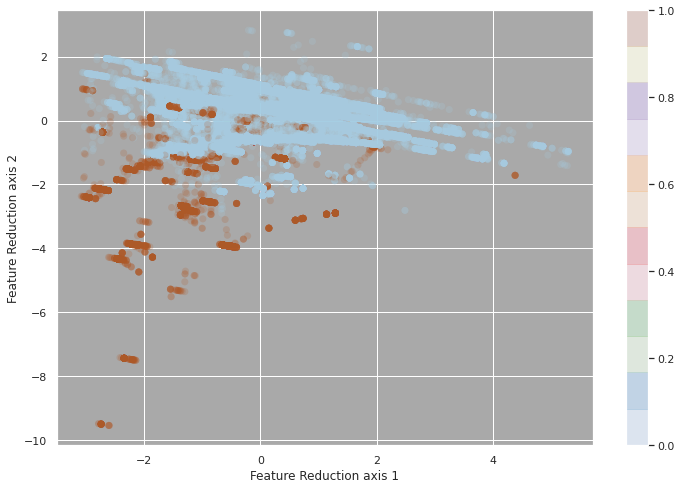

n_clusters =  3
silhouette =  0.34543417702885637
n_clusters = 3


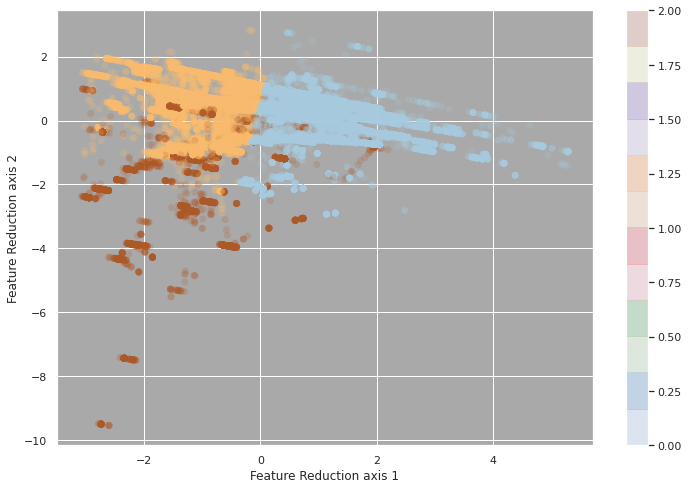

n_clusters =  4
silhouette =  0.3649032671532971
n_clusters = 4


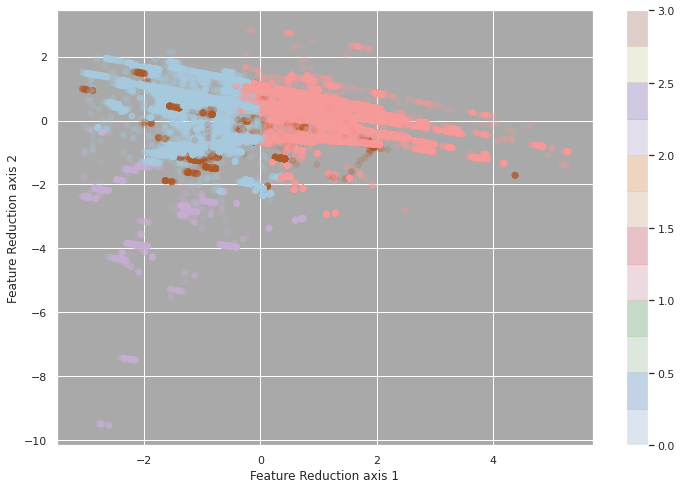

n_clusters =  5
silhouette =  0.3414968267838482
n_clusters = 5


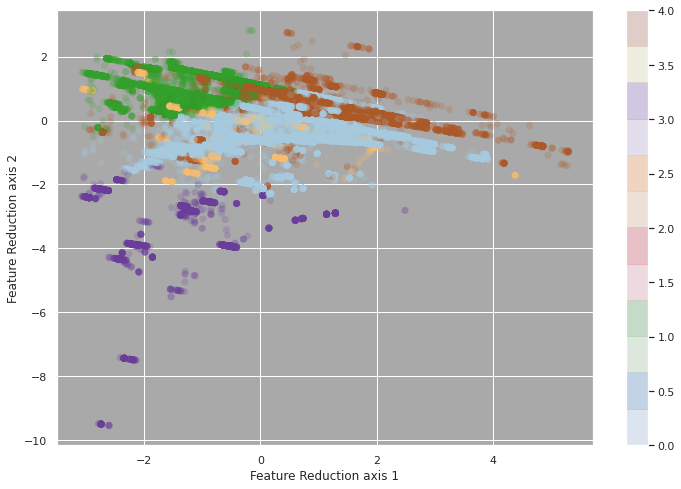

n_clusters =  6
silhouette =  0.4042504212431512
n_clusters = 6


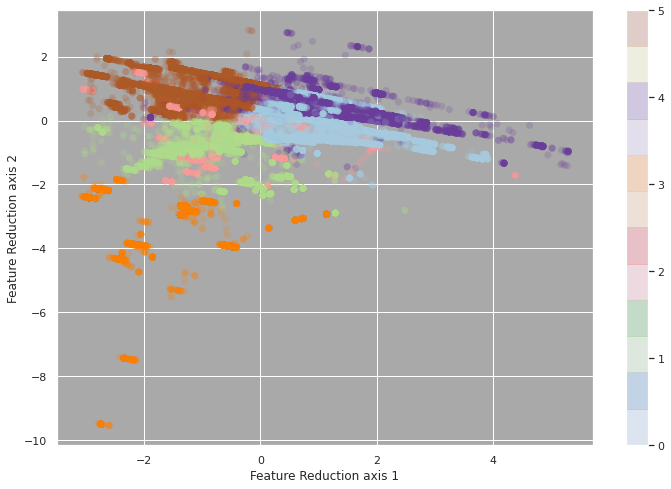

n_clusters =  7
silhouette =  0.3996143257823825
n_clusters = 7


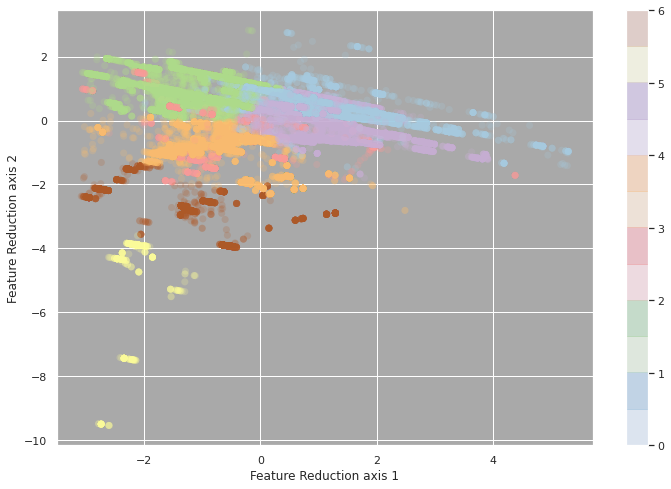

n_clusters =  8
silhouette =  0.39144816879112737
n_clusters = 8


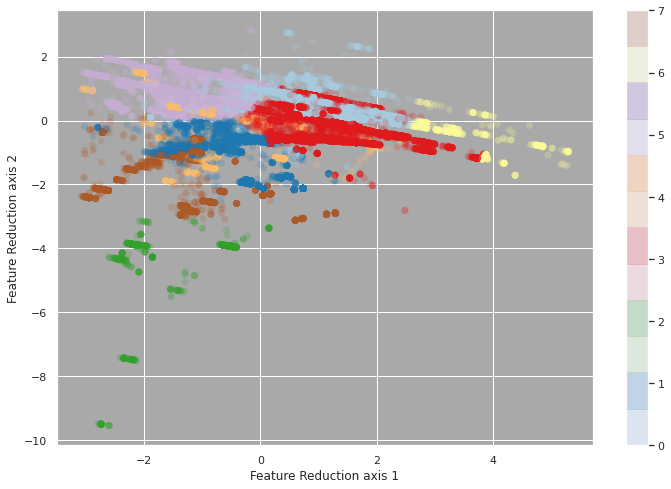

n_clusters =  9
silhouette =  0.35842693984511337
n_clusters = 9


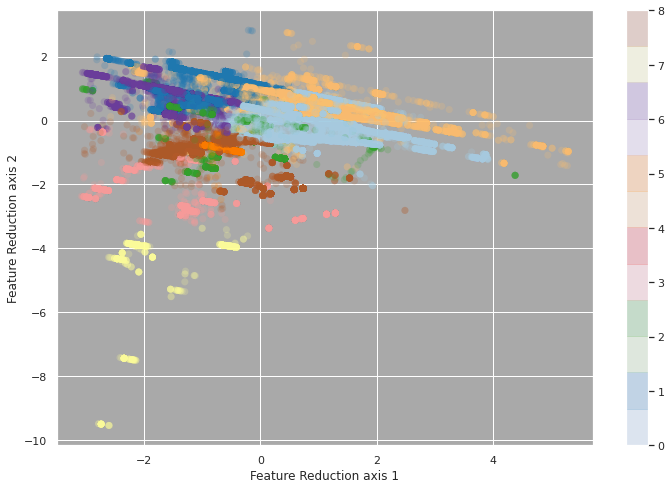

n_clusters =  10
silhouette =  0.3594029454122563
n_clusters = 10


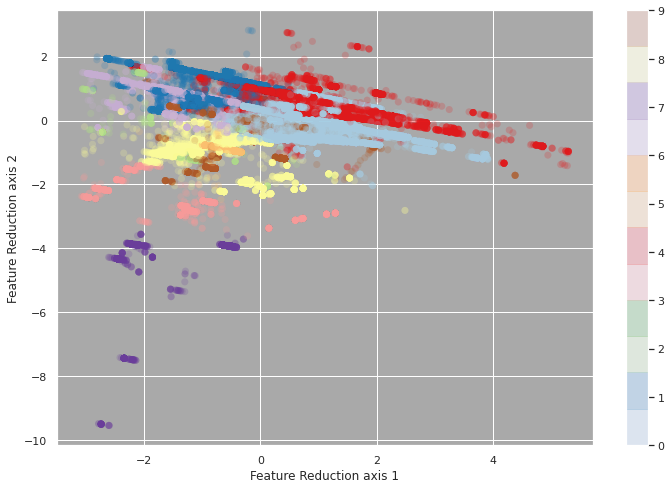

n_clusters =  11
silhouette =  0.35640799417153823
n_clusters = 11


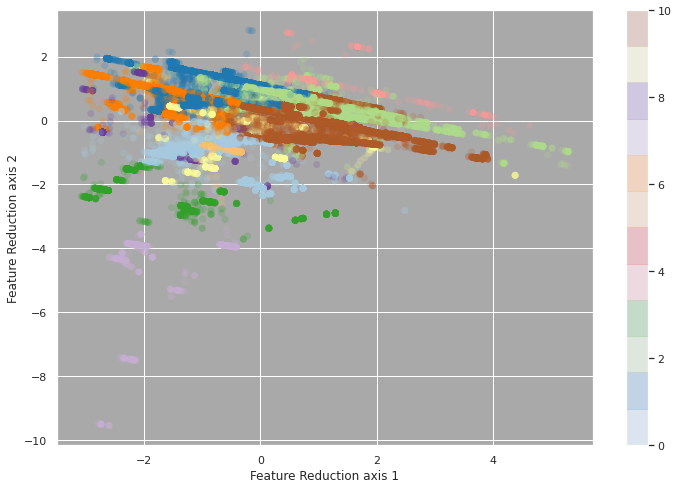

n_clusters =  12
silhouette =  0.36149867758134513
n_clusters = 12


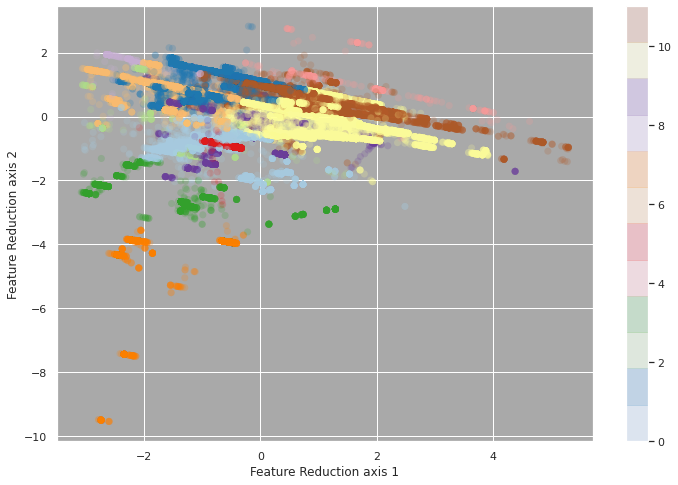

n_clusters =  13
silhouette =  0.3382372145334219
n_clusters = 13


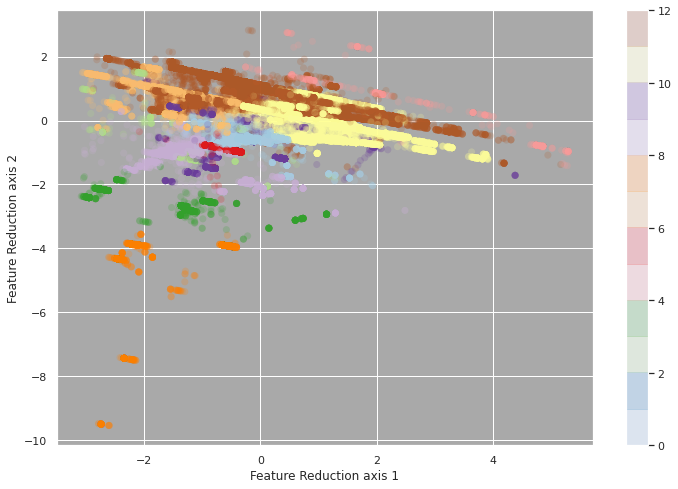

n_clusters =  14
silhouette =  0.2638178138326039
n_clusters = 14


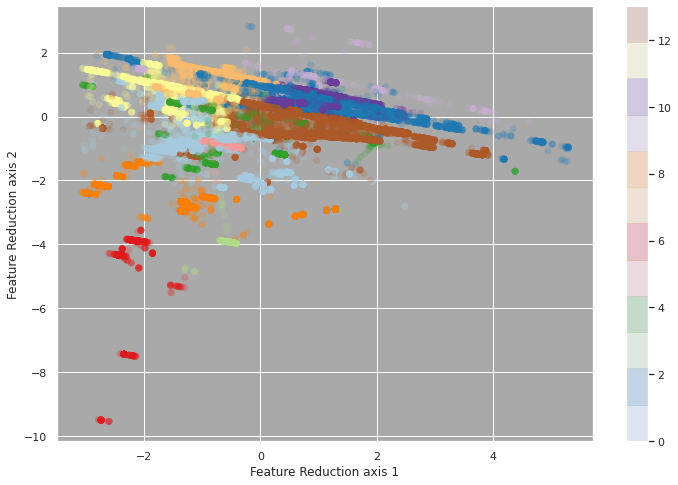

n_clusters =  15
silhouette =  0.26361229426880234
n_clusters = 15


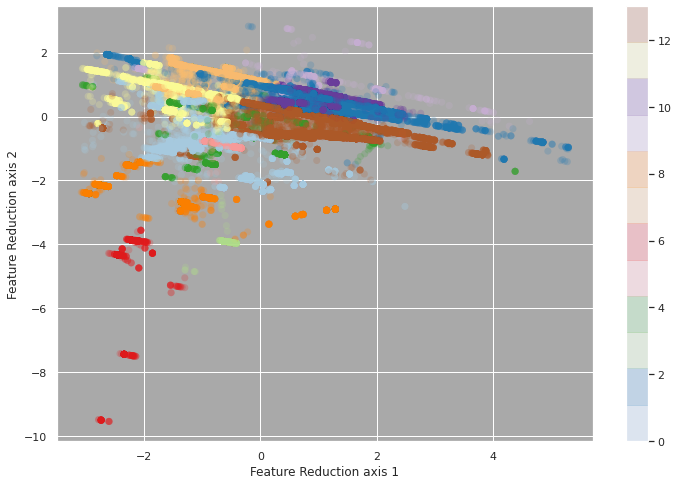

n_clusters =  16
silhouette =  0.23991599661339533
n_clusters = 16


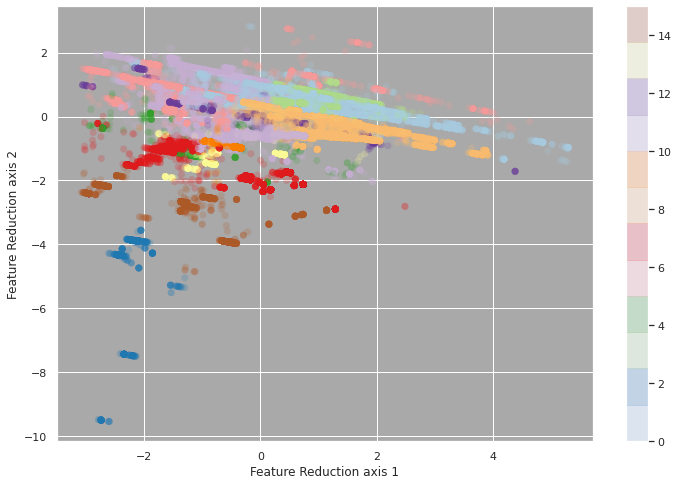

n_clusters =  17
silhouette =  0.25787741338533465
n_clusters = 17


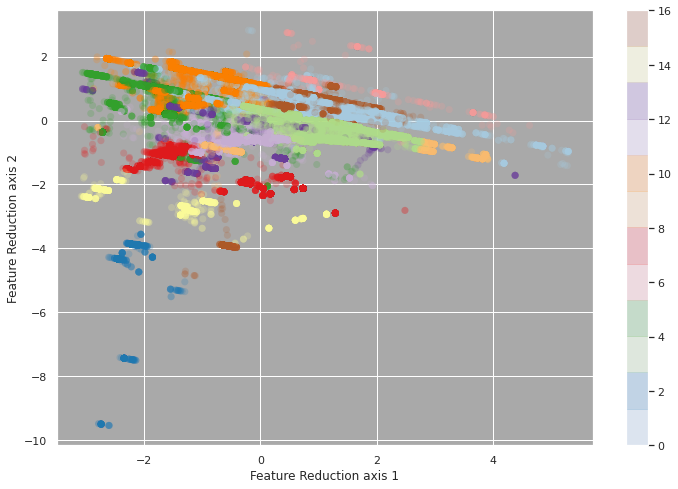

n_clusters =  18
silhouette =  0.34040387873917266
n_clusters = 18


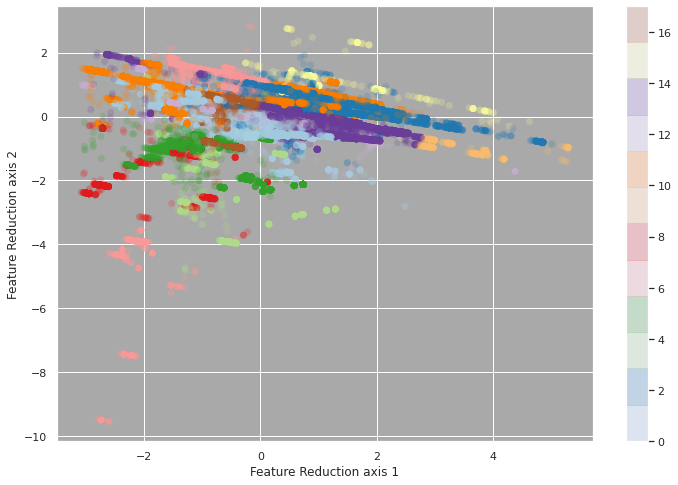

n_clusters =  19
silhouette =  0.28653633530077416
n_clusters = 19


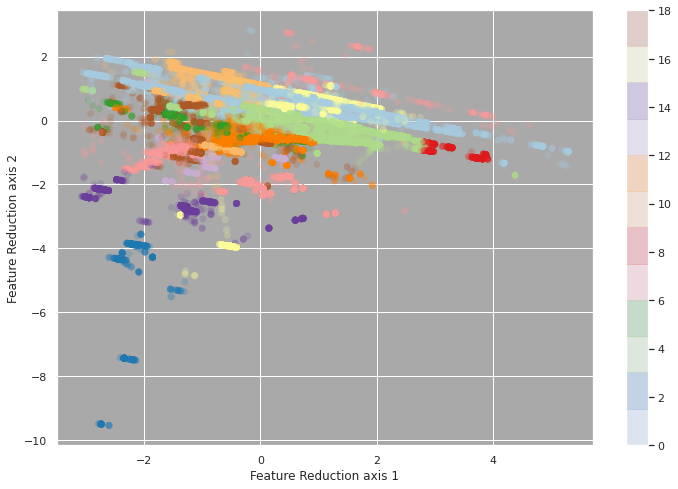

In [0]:
import time

for n_clstr in range(2, 20):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    gmm_best = GMM(n_components=n_clstr,
               random_state=123456789,
               covariance_type='tied',
               init_params='kmeans',
               n_init=3)
    gmmbest_labels = gmm_best.fit_predict(gmm_X) 
    gmmbest_labels
    gmmbest_silhouette = metrics.silhouette_score(gmm_X,
                                                 gmmbest_labels,
                                                 metric = 'euclidean')
    print ("silhouette = ", gmmbest_silhouette)
    
    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    exe_time = '{0:.4f}'.format(toc-tic)


    raw_data0 = {
    'model_name' : 'knn - features',
    'n_clusters' : n_clstr,
    'inertia': 0,
    'silhouette': gmmbest_silhouette, 
    'process_time' : exe_time
    }

    df_tbl0 = pd.DataFrame(raw_data0,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    gmm_tbl = gmm_tbl.append(df_tbl0, ignore_index=True)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    gmm_X_values = gmm_X.values;
    _ = plt.scatter(gmm_X_values[:, 0], gmm_X_values[:, 1],
                c = gmmbest_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.colorbar();
    
    _ = plt.xlabel('Feature Reduction axis 1')
    _ = plt.ylabel('Feature Reduction axis 2')
    title = print('n_clusters =', n_clstr);
    _ = plt.title(title)
    _ = plt.grid(True);

    _ = plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

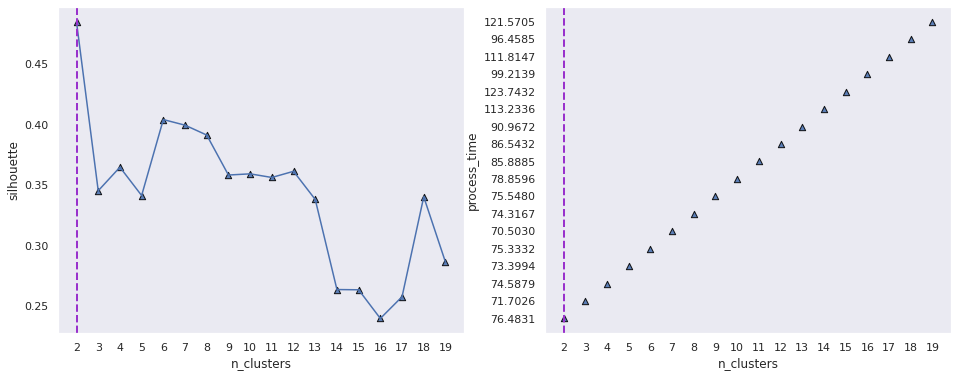

In [0]:
import math

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ...  use max silhouette score to mark optimal number of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

n_optimal_clusters = gmm_tbl['silhouette'].argmax() + gmm_tbl['n_clusters'].min()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(121);
plt.scatter(gmm_tbl['n_clusters'],
            gmm_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(gmm_tbl['n_clusters'],
         gmm_tbl['silhouette'])

# ... vertical line at max silhouette value

plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
xint = range(min(gmm_tbl['n_clusters']), math.ceil(max(gmm_tbl['n_clusters']))+1)
plt.xticks(xint)

plt.grid();

# ... process time

plt.subplot(122);
plt.scatter(gmm_tbl['n_clusters'],
            gmm_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

# ... vertical line at max silhouette value

plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('process_time');
xint = range(min(gmm_tbl['n_clusters']), math.ceil(max(gmm_tbl['n_clusters']))+1)
plt.xticks(xint)

plt.grid();

plt.savefig("cluster_spctrl_number_of_clusters_eval.png")

plt.show();


In [0]:
gmm_X_final = gmm_X_sphere.copy()
gmm_clusters_final = gmm_clusters_sphere
gmm_sil_final = gmm_sil_sphere

After running our test on the different clusters, we can see that 2 clusters is giving us the highest silhouette score for our spherical GMM model, exceeding a silhouette score exceeding 0.45. Moving forward, we will be using 2 as our ideal number of clusters in our model.

This is strange compared to what we saw discussed previously. As we hypothesized in model and evaluation 1, we figured that 7 clusters would be the optimal. So while 7 showed to be strong nearing 0.40, we are seeing a score north of 0.45. 


### KMeans Clustering

#### Configuration 1: 'init' parameter set to k-means++

In [0]:
# config 1
from sklearn.metrics import silhouette_score
from time import time
import numpy as np
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale

from sklearn.metrics.cluster import homogeneity_score


# Get silhouette score
kms_sil = silhouette_score(kms_X, kms_clusters, random_state=1)
print("Average K-means Silhouette Score:", kms_sil)
df_kms_result.loc[0, 'SilhouetteScore'] = kms_sil



print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kmsfit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kmsfit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kmsfit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kmsfit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kmsfit.labels_, average_method='arithmetic'))



Average K-means Silhouette Score: 0.38875633277841704
Homogeneity: 0.160
Completeness: 0.183
V-measure: 0.171
Adjusted Rand Index: 0.099
Adjusted Mutual Information: 0.171


Using a default configuration, the new Kmeans clustering methodology was able to improve upon all of our previous scores within the Liquor Category dataset and the GMM model.Here, we nearly reached our 3init performance at 0.39, which we will look to improve upon below. 


Regarding the Homogeneity score, we can see that we are very close to Zero on the Homeogeneity score, which would suggest that our model is very far from being perfectly homogenous. Our score of 0.160, shows that we are seeing a variety of sizes in our clusters, even after we ran a SMOTE to balance the variables.

Regarding completeness, a cluster is considered to be complete if all the data points are memebers of a given class are elements of the same cluster. Our score of 0.183 sugests that we are not seeing a lot of alignment between clusters and join performance.

With the V-measure for evaluating clustering performance, we are using the homogeneity and completeness varaibles we calculated previously to give us a score that is independent of class labels, number of clusters and size of the data. In our case, we recieved a score of 0.171 which aligns with our completeness and homogeneity score that our cluster is not surfacing a missing variable.

The Rand Index is a measure of similarity between data clusterings, our score of 0.099, shows that we are very far from having similar data clusters.

Adjusted mutual information, is another measure to compare clusters by correcting the effect of the agreement of the clusters solely due to chance between clusterings. Our score of 0.171 suggests that there is very limited similarity between our clusters.

This will act as the baseline to our future configurations to improve upon. 

#### Configuration 2: 'init' parameter set to random (and coincidentally n_init set to 5 to compare with the next configuration)

In [0]:
# config 2
from sklearn.metrics import silhouette_score

# Get silhouette score
kms2_sil = silhouette_score(kms_X, kms_clusters2, random_state=1)
print("Average K-means Silhouette Score:", kms2_sil)
df_kms_result.loc[1, 'SilhouetteScore'] = kms2_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms2fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms2fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms2fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms2fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms2fit.labels_, average_method='arithmetic'))



Average K-means Silhouette Score: 0.38753900998806196
Homogeneity: 0.162
Completeness: 0.184
V-measure: 0.172
Adjusted Rand Index: 0.100
Adjusted Mutual Information: 0.172


Just by changing to random, the silhouette score was nearly the same as our previous model, as well as improved on Homogeneity, Completeness, V-Measure, Adjusted Rand Index, and Adjusted Mutual Information on the default set up. While we garnered the same performance, the time it took to run this model was longer than the baseline model, which was almost instantaneous, which can be costly if we want to extend this model to support the 17 million line dataset for Iowa liquors. 

#### Configuration 3: 'n_init' parameter set to 1 (with init = k-means++)

In [0]:
# config 3
from sklearn.metrics import silhouette_score

# Get silhouette score
kms3_sil = silhouette_score(kms_X, kms_clusters3, random_state=1)
print("Average K-means Silhouette Score:", kms3_sil)
df_kms_result.loc[2, 'SilhouetteScore'] = kms3_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms3fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms3fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms3fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms3fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms3fit.labels_, average_method='arithmetic'))



Average K-means Silhouette Score: 0.37288829943372054
Homogeneity: 0.145
Completeness: 0.172
V-measure: 0.158
Adjusted Rand Index: 0.100
Adjusted Mutual Information: 0.157


In our dataset, reducing the iterations also reduces our silhouette score, homogeneity, completeness, v-measure, adjusted rand index and adjusted mutual information. That said, the time it took to run this model was much shorter than configuration two. 

So as we look at the other confugurations, we may want to make the decision on whether we should sacrifice our performance for speed. 

#### Configuration 4: 'n_init' parameter set to 1 (with init = random as this turned out better)

In [0]:
# config 4
from sklearn.metrics import silhouette_score

# Get silhouette score
kms4_sil = silhouette_score(kms_X, kms_clusters4, random_state=1)
print("Average K-means Silhouette Score:", kms4_sil)
df_kms_result.loc[3, 'SilhouetteScore'] = kms4_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms4fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms4fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms4fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms4fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms4fit.labels_, average_method='arithmetic'))



Average K-means Silhouette Score: 0.40120160482410183
Homogeneity: 0.152
Completeness: 0.177
V-measure: 0.164
Adjusted Rand Index: 0.090
Adjusted Mutual Information: 0.164


Reducing the n_init in the case where init = random did improve the score at the help of improvind the time up to a silhouette score of 0.40. In fact, each of our 6 measures increased very slightly, possibly not enough to be considered statistically significant. 

#### Configuration 5: tol as default higher than default (using best so far 'n_init' parameter set to 1 & init = random as this turned out better)

In [0]:
# config 5
from sklearn.metrics import silhouette_score

# Get silhouette score
kms5_sil = silhouette_score(kms_X, kms_clusters5, random_state=1)
print("Average K-means Silhouette Score:", kms5_sil)
df_kms_result.loc[4, 'SilhouetteScore'] = kms5_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms5fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms5fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms5fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms5fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms5fit.labels_, average_method='arithmetic'))



Average K-means Silhouette Score: 0.2794025141439556
Homogeneity: 0.141
Completeness: 0.156
V-measure: 0.149
Adjusted Rand Index: 0.085
Adjusted Mutual Information: 0.148


Reducing the tolerance here also reduces the score, and is lower than configuration 4 on each of our 6 measures. 

#### Configuration 6: tol as default lower than default (using best so far 'n_init' parameter set to 1 & init = random as this turned out better)


In [0]:
# config 6
from sklearn.metrics import silhouette_score

# Get silhouette score
kms6_sil = silhouette_score(kms_X, kms_clusters6, random_state=1)
print("Average K-means Silhouette Score:", kms6_sil)
df_kms_result.loc[5, 'SilhouetteScore'] = kms6_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms6fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms6fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms6fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms6fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms6fit.labels_, average_method='arithmetic'))



Average K-means Silhouette Score: 0.40122037342915595
Homogeneity: 0.152
Completeness: 0.177
V-measure: 0.164
Adjusted Rand Index: 0.090
Adjusted Mutual Information: 0.164


Here, the increasing tolerances significantly improved the score as opposed to reducing the tolerance which we did in config 5. It actually gave us the same score as configuration 4.

In [0]:
df_kms_result

,Configuration,SilhouetteScore,RelativeTime
0,Config 1,0.388756,Medium
1,Config 2,0.387539,Medium High
2,Config 3,0.372888,Very Short
3,Config 4,0.401202,Short
4,Config 5,0.279403,Very Short
5,Config 6,0.40122,Medium Low


As per our results, config 4 was among the most accurate of the scores we found as far as silhouette, while also being short in relative time to run. We are going to choose this over Config 6, which had the same silhouette score (slightly higher) but took   longer to run. With regards to our remaining 5 measures, we saw that each of them were positively correlated to silhouette score. So while they provide some further insight into the cluster type (and likely will justify looking at the different cluster numbers), they will not provide an additional factor to our silhouette score in selecting a model to move foreward with.  

Overall, compared to the baseline algorithms we tested in modeling and evaluation 1, it's great to see that tuning our parameters can improve our score of 0.37.

So we can see if the number of clusters can affect the silhouette score, let's test how the score might change based on the number of clusters we set within our model. 

In [0]:
%%time
# config 4

from sklearn.cluster import KMeans

# Fit 7 clusters
kms4 = KMeans(n_clusters=7, init='random', random_state=1, n_init=1, tol=.0001)
kms_X = X1DF
kms4fit = kms4.fit(kms_X)
kms_clusters4 = kms4.predict(kms_X)
kms_clusters4
df_kms_result.loc[3, 'RelativeTime'] = 'Short'

CPU times: user 200 ms, sys: 15.9 ms, total: 216 ms
Wall time: 206 ms


For reference, here was our best kmeans model (config 4) which includes the following params:

Init = random
n_init = 1 
tol = 0.0001

To test our number of clusters, we are going to run a loop function which calculates the new silhouette score for each number of cluster from 2 - 19 on our best performing GMM and Kmeans model. We will then plot the visual so you can see how each cluster looks. 

In [0]:
knn_tbl = pd.DataFrame(columns = [
    'model_name',
    'n_clusters',
    'inertia',
    'silhouette',
    'process_time'])

In [0]:
kms4fit

KMeans(algorithm='auto', copy_x=True, init='random', max_iter=300, n_clusters=7,
       n_init=1, n_jobs=None, precompute_distances='auto', random_state=1,
       tol=0.0001, verbose=0)

n_clusters =  2
silhouette =  0.3140951495958528
n_clusters = 2


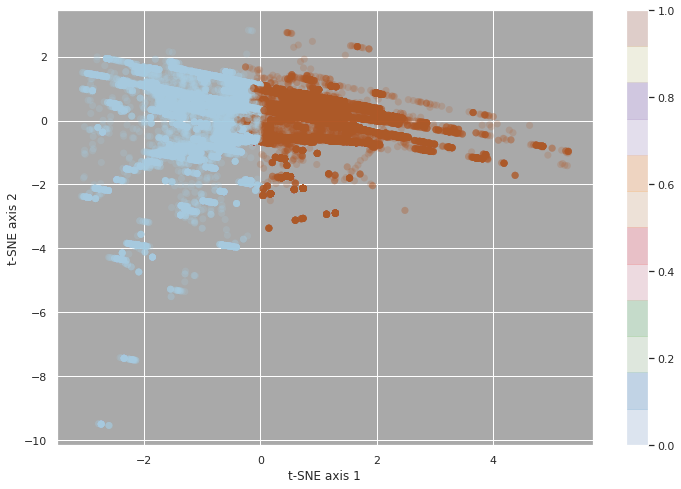

n_clusters =  3
silhouette =  0.3298117375907085
n_clusters = 3


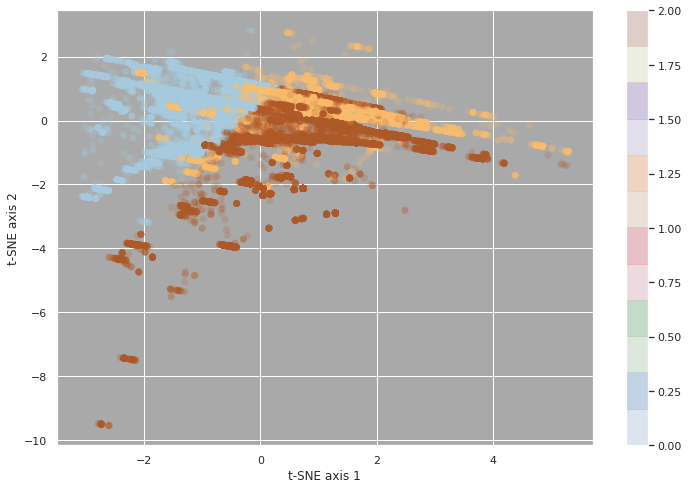

n_clusters =  4
silhouette =  0.3802182986736711
n_clusters = 4


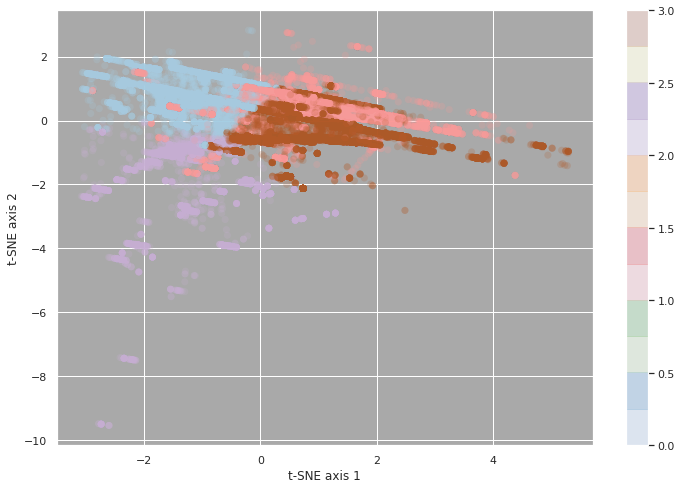

n_clusters =  5
silhouette =  0.3714421600958481
n_clusters = 5


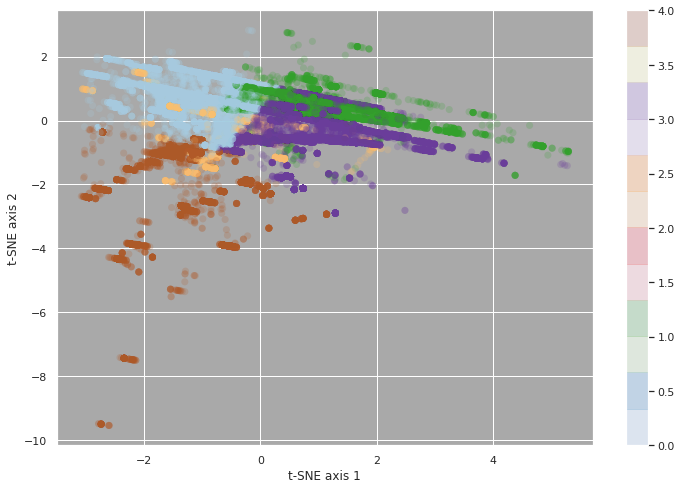

n_clusters =  6
silhouette =  0.38618457967297626
n_clusters = 6


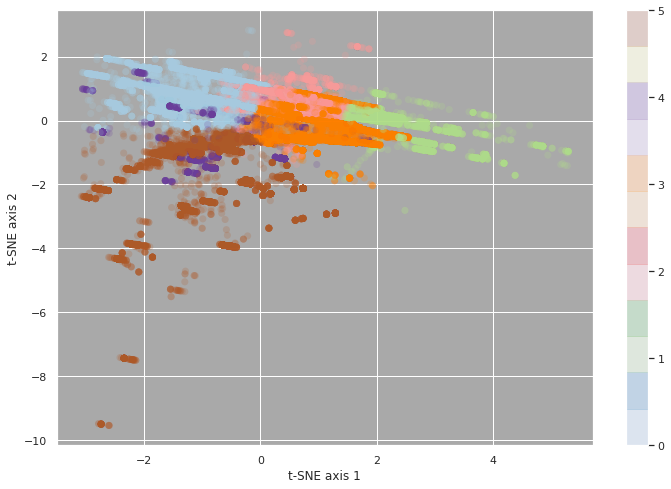

n_clusters =  7
silhouette =  0.40120160482410183
n_clusters = 7


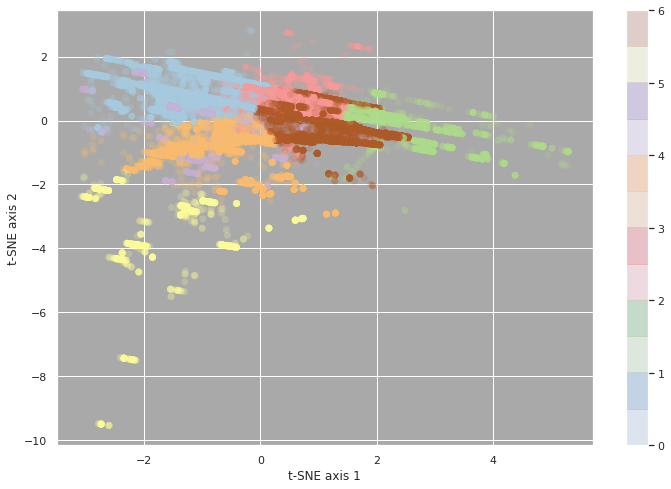

n_clusters =  8
silhouette =  0.34626245945723233
n_clusters = 8


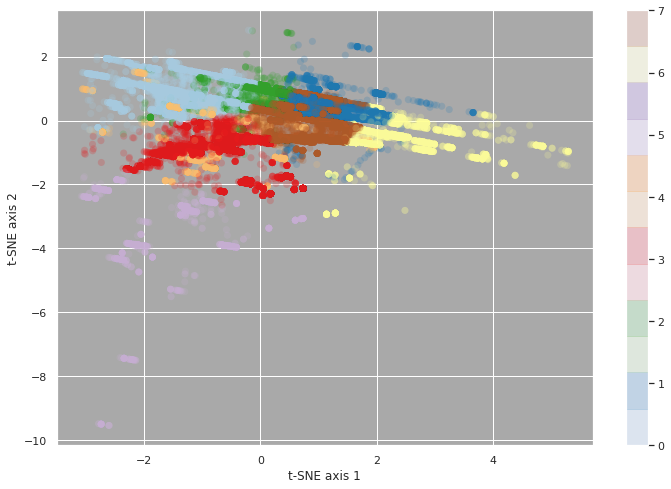

n_clusters =  9
silhouette =  0.3336081486867021
n_clusters = 9


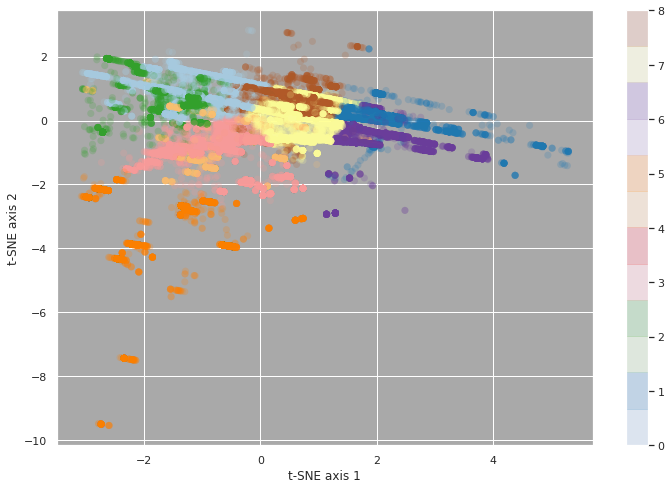

n_clusters =  10
silhouette =  0.3476975682193931
n_clusters = 10


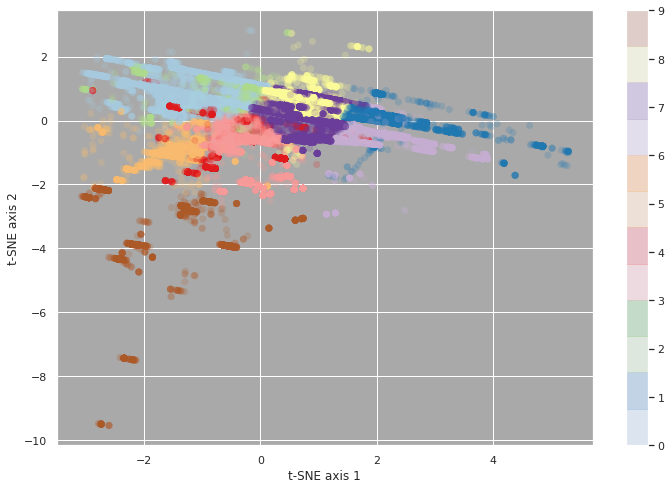

n_clusters =  11
silhouette =  0.36111617530467216
n_clusters = 11


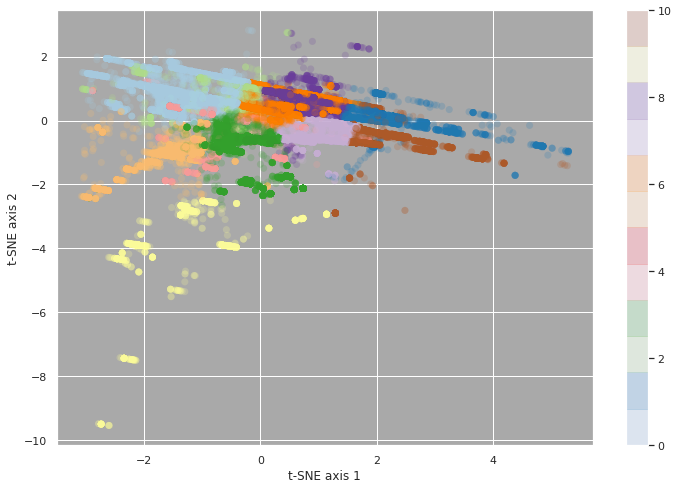

n_clusters =  12
silhouette =  0.3573492798821733
n_clusters = 12


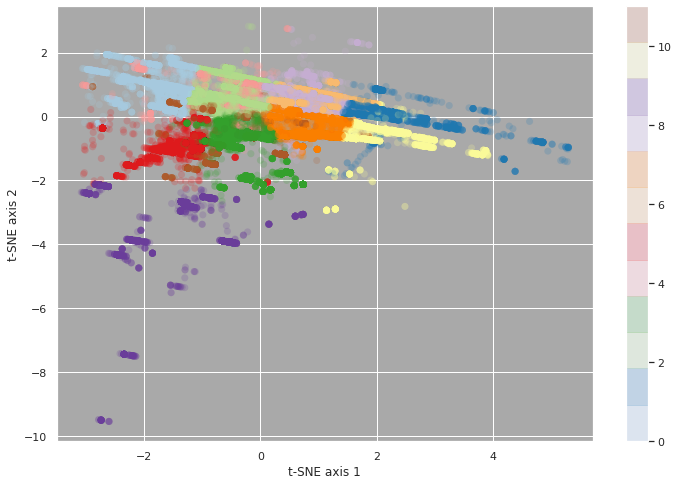

n_clusters =  13
silhouette =  0.3687056392051774
n_clusters = 13


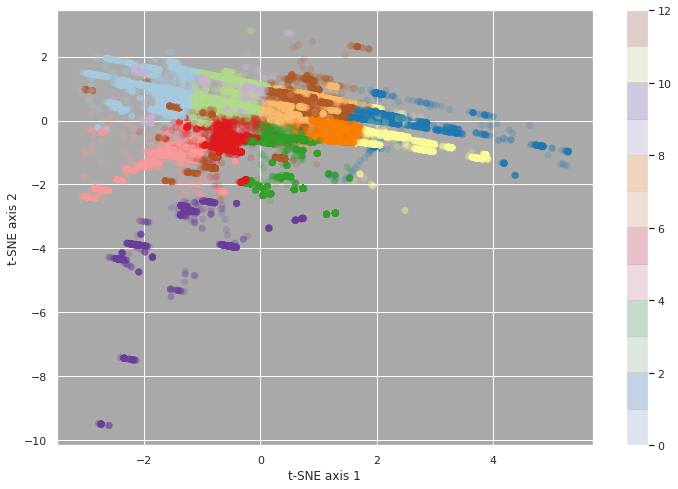

n_clusters =  14
silhouette =  0.3665189772742222
n_clusters = 14


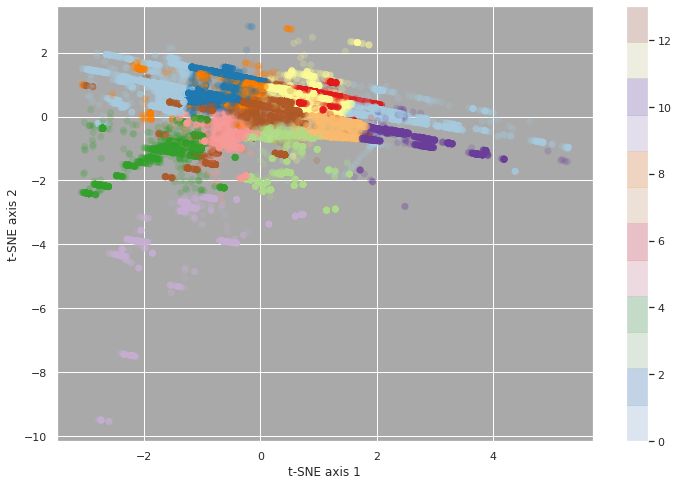

n_clusters =  15
silhouette =  0.34684663337820326
n_clusters = 15


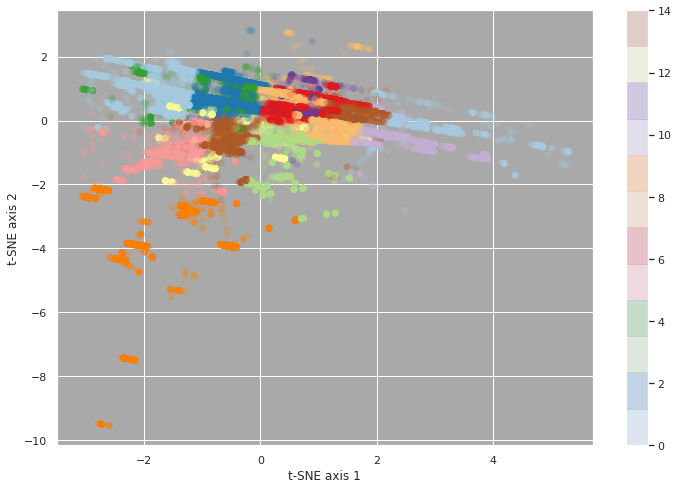

n_clusters =  16
silhouette =  0.34036839214909004
n_clusters = 16


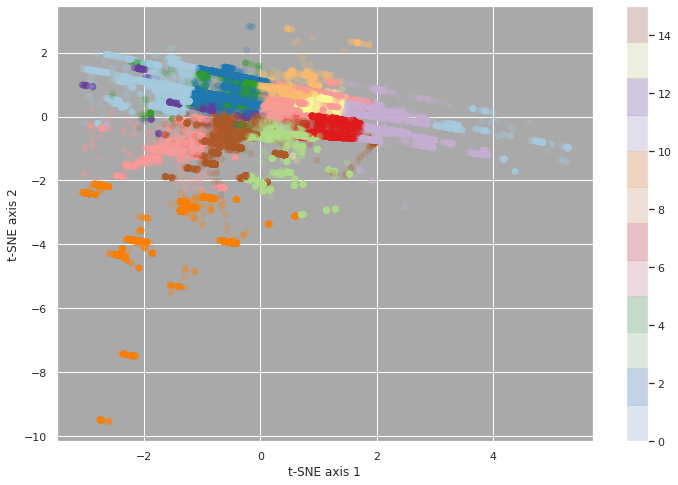

n_clusters =  17
silhouette =  0.342633662326466
n_clusters = 17


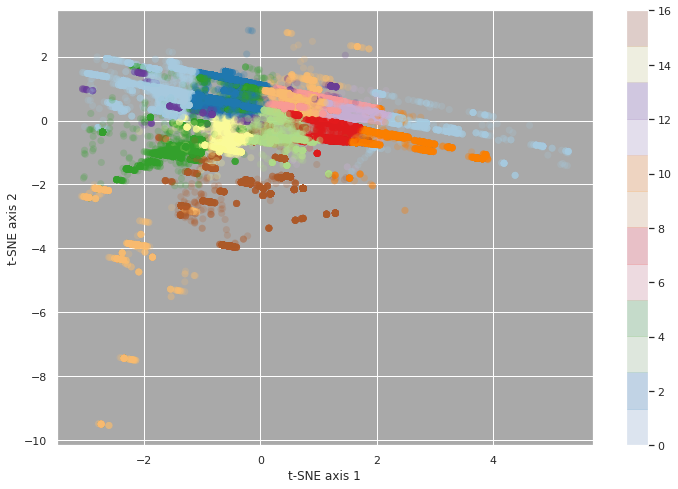

n_clusters =  18
silhouette =  0.3358242790981106
n_clusters = 18


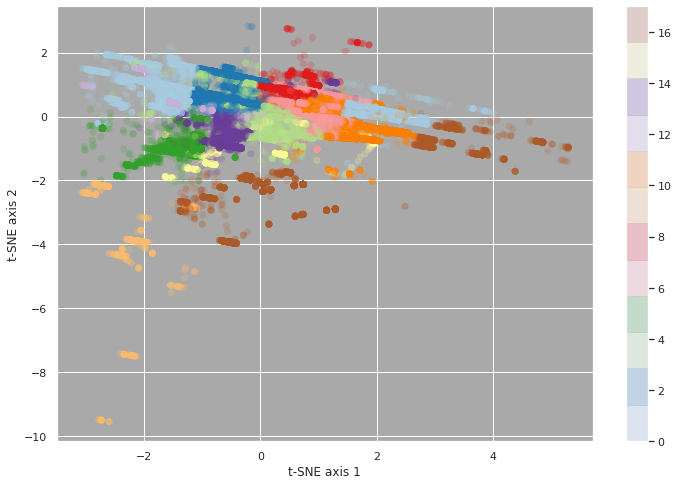

n_clusters =  19
silhouette =  0.35196042491365737
n_clusters = 19


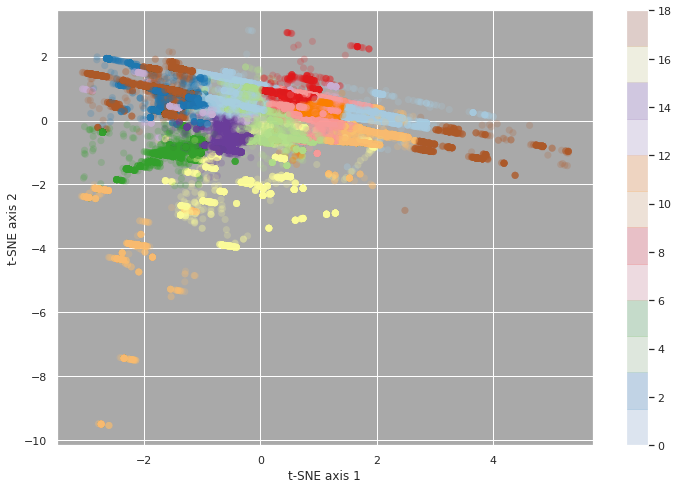

In [0]:
import time

for n_clstr in range(2, 20):   

    tic = time.clock()
    
    print ("n_clusters = ", n_clstr)

    kms_best = KMeans(n_clusters=n_clstr, init='random', random_state=1, n_init=1, tol=.0001)
    kmsbest_labels = kms_best.fit_predict(kms_X) 
    kmsbest_labels
    kmsbest_silhouette = metrics.silhouette_score(kms_X,
                                                 kmsbest_labels,
                                                 metric = 'euclidean')
    print ("silhouette = ", kmsbest_silhouette)
    
    toc =  time.clock()
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - save statistics for model comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    exe_time = '{0:.4f}'.format(toc-tic)


    raw_data = {
    'model_name' : 'knn - features',
    'n_clusters' : n_clstr,
    'inertia': 0,
    'silhouette': kmsbest_silhouette, 
    'process_time' : exe_time
    }

    df_tbl = pd.DataFrame(raw_data,
    columns = ['model_name', 'n_clusters', 'inertia', 'silhouette', 'process_time'],
    index = [i_index + 1])

    knn_tbl = knn_tbl.append(df_tbl, ignore_index=True)

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - make some plots of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
    
    _ = plt.figure(figsize=(12, 8));
    _ = plt.subplot(111, facecolor = 'darkgrey');
    
    kms_X_values = kms_X.values;
    _ = plt.scatter(kms_X_values[:, 0], kms_X_values[:, 1],
                c = kmsbest_labels,
                cmap = plt.cm.Paired,
                s = 50,
                linewidths = 0,
                alpha = 0.20);
    _ = plt.colorbar();
    
    _ = plt.xlabel('t-SNE axis 1')
    _ = plt.ylabel('t-SNE axis 2')
    title = print('n_clusters =', n_clstr);
    _ = plt.title(title)
    _ = plt.grid(True);

    _ = plt.show();
    
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - 
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

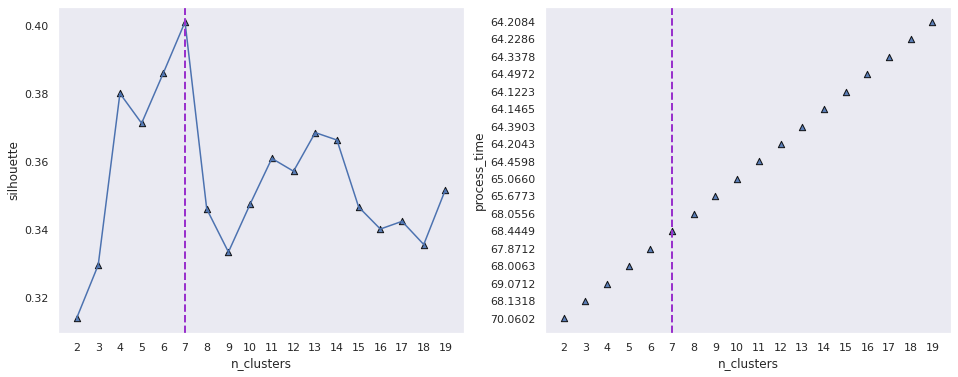

In [0]:
import math

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ...  use max silhouette score to mark optimal number of clusters
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

n_optimal_clusters = knn_tbl['silhouette'].argmax() + knn_tbl['n_clusters'].min()

# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
# ... - plot metrics across models for comparison
# ... -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-

plt.figure(figsize=(16, 6));

# ... silhouette values

plt.subplot(121);
plt.scatter(knn_tbl['n_clusters'],
            knn_tbl['silhouette'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

plt.plot(knn_tbl['n_clusters'],
         knn_tbl['silhouette'])

# ... vertical line at max silhouette value

plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('silhouette');
xint = range(min(knn_tbl['n_clusters']), math.ceil(max(knn_tbl['n_clusters']))+1)
plt.xticks(xint)

plt.grid();

# ... process time

plt.subplot(122);
plt.scatter(knn_tbl['n_clusters'],
            knn_tbl['process_time'],
            s = 40,
            linewidths = 1.0,
            marker = '^',
            edgecolors = 'black',
            alpha = 0.90);

# ... vertical line at max silhouette value

plt.axvline(x = n_optimal_clusters, linewidth = 2, linestyle = 'dashed', color = 'darkorchid')

plt.xlabel('n_clusters'), plt.ylabel('process_time');
xint = range(min(knn_tbl['n_clusters']), math.ceil(max(knn_tbl['n_clusters']))+1)
plt.xticks(xint)

plt.grid();

plt.savefig("cluster_spctrl_number_of_clusters_eval.png")

plt.show();


After playing with the number of clusters, we can achieve the highest silhouette score among our KMean configuration 4 we find that the optimal number of clusters is 7 per the line graph above. From a timing standpoint, we can see that we are seeing uniformity with the increase of time as it relates to the  number of clusters. This optimal number of clusters aligns with our earlier hypothesis in modeling and evalu 1 that we will get similar clustering to the liquor id (which was 7)


## Modeling and Evaluation 3 (10 points)

Visualize Results
• Visualize: Use tables/visualization to discuss the found results. Explain each visualization in
detail.  

Shown below are two visuals of the kmeans and GMM clusters that we ran on our liquor store dataset. This was done to help to illustrate the clusters visually, and in 3 dimensional space. Between Kmeans and GMM, we can see that the distributions are a little different despite the relatively similar silhouette scores, however, there are patterns that can be derived from each. For example, our clustering does seem to split the streak that we see with our observations in the LDA.

At a high feature space in the first feature, and a low feature space on the second feature. Additionally, we can also see that there is one large cluster cloud for all the features, which is expected considering we are transforming all of our data from our initial data cleaning step, so that reduces the affect of outliers which would have thrown off our clustering and modeling we did in lab 2 and 1. 

In [0]:
#pip install plotly
#pip install chart_studio
#pip install plotly --upgrade

#### K-means Silhouette Plot

Before we run the full kmeans silhouette plot, let's reassign our original kmeans configuration 4 so that it has 7 clusters.


cat_vars=['counter', 'liquor_category', 'store_parent',
 'month', 'year', 'monthyear', 'liquor_category_AMARETTO', 'liquor_category_BRANDY', 'liquor_category_GIN', 
 'liquor_category_LIQUEUR', 'liquor_category_Other', 'liquor_category_RUM', 'liquor_category_SCHNAPPS', 
 'liquor_category_TEQUILA', 'liquor_category_VODKA', 'month_Apr', 'month_Aug', 'month_Dec', 'month_Feb',
 'month_Jan', 'month_Jul', 'month_Jun', 'month_Mar', 'month_May', 'month_Nov', 'month_Oct', 'month_Sep', 
 'store_parent_CVS', 'store_parent_Caseys', 'store_parent_Hy-Vee', 'store_parent_Kum&Go', 
 'store_parent_Other', 'store_parent_QuikTrip', 'store_parent_SamsClub', 'store_parent_SmokingJoes', 
 'store_parent_Target', 'store_parent_Wal-Mart', 'store_parent_Walgreens']
data_vars=data.columns.values.tolist()
to_keep=[i for i in data_vars if i not in cat_vars]

For n_clusters = 7 The average silhouette_score is : 0.40120160482410183


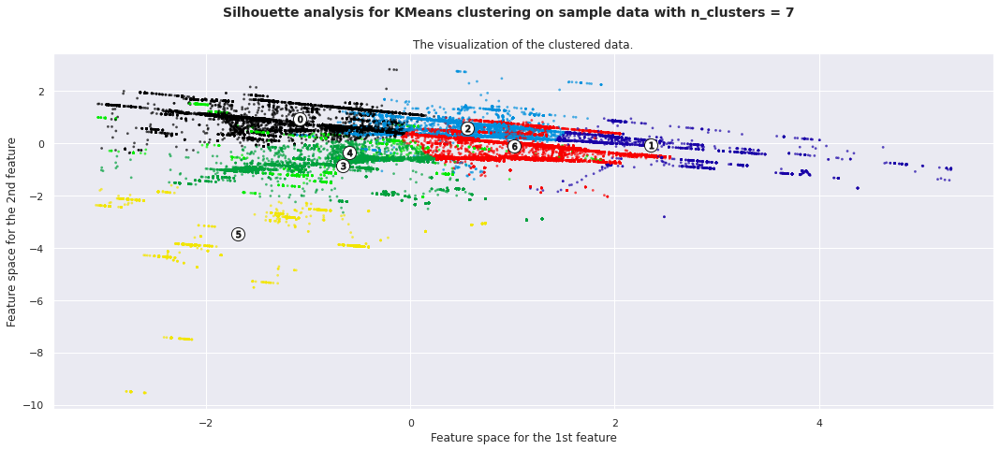

In [0]:
from __future__ import print_function

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

dfb = data_final.copy()
df3s = data_final[['id_label']]

X = kms_X.values[:,]
y = df3s[['id_label']]
clusterer = kms4
random_state=123456789
silhouette_avg = kms4_sil

range_n_clusters = [7]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax2) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    #ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    # ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a rsample_size=50andom generator
    # seed of 10 for reproducibility.
    clusterer = clusterer #KMeans(n_clusters=11, init='k-means++',random_state=1)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_avg
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)
    
    #ax1.set_title("The silhouette plot for the various clusters.")
    #ax1.set_xlabel("The silhouette coefficient values")
    #ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    #ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    #ax1.set_yticks([])  # Clear the yaxis labels / ticks
    #ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

We used our best performing Kmeans cluster which was the configuration 4 set up for Kmeans, which had an n_init set to random with a tolerance set to 0.0001. This gave us a silhouette score of 0.401 and is plotted above. 

The plot includes numbers for each of the 7 clusters we set in our model. We appear to get the streak broken into 4 main clusters with a few additional clusters located on the outside. Considering our silhouette score, we may be able to dive deeper into these clusters if we look into this data on a 3 dimensional scale. 

#### GMM Silhouette Plot

Like we did with the Kmeans, we will also reassign our GMM cluster so that it runs at 2 clusters. And then we will plot it on a two dimensional plane.

In [0]:
# Fit 2 clusters with 3 k-means init
gmm_3init = GMM(n_components=2,
               random_state=123456789,
               covariance_type='tied',
               init_params='kmeans',
               n_init=3
          )
gmm_X_3init = X1DF
gmm_3init.fit(gmm_X_3init)
gmm_clusters_3init = gmm_3init.predict(gmm_X_3init)
gmm_sil_3init = silhouette_score(gmm_X_3init, gmm_clusters_3init, random_state=123456789)



cat_vars=['counter', 'liquor_category', 'store_parent',
 'month', 'year', 'monthyear', 'liquor_category_AMARETTO', 'liquor_category_BRANDY', 'liquor_category_GIN', 
 'liquor_category_LIQUEUR', 'liquor_category_Other', 'liquor_category_RUM', 'liquor_category_SCHNAPPS', 
 'liquor_category_TEQUILA', 'liquor_category_VODKA', 'month_Apr', 'month_Aug', 'month_Dec', 'month_Feb',
 'month_Jan', 'month_Jul', 'month_Jun', 'month_Mar', 'month_May', 'month_Nov', 'month_Oct', 'month_Sep', 
 'store_parent_CVS', 'store_parent_Caseys', 'store_parent_Hy-Vee', 'store_parent_Kum&Go', 
 'store_parent_Other', 'store_parent_QuikTrip', 'store_parent_SamsClub', 'store_parent_SmokingJoes', 
 'store_parent_Target', 'store_parent_Wal-Mart', 'store_parent_Walgreens']
data_vars=data.columns.values.tolist()
to_keep=[i for i in data_vars if i not in cat_vars]

For n_clusters = 2 The average silhouette_score is : 0.48488443827214384


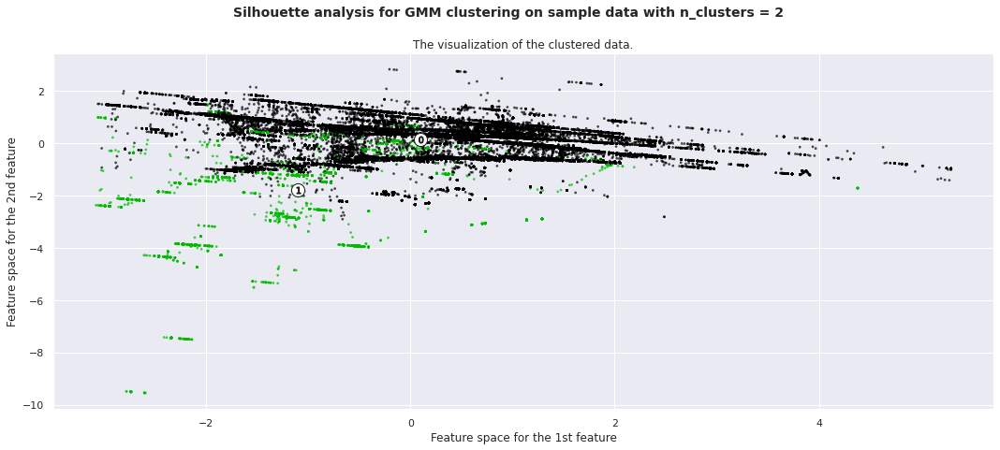

In [0]:
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

print(__doc__)

df2b = data_final.copy()
df3s = df2b[['id_label']]
 
X = gmm_X_3init.values[:,]
y = df3s[['id_label']]
clusterer = gmm_3init
random_state=123456789
silhouette_avg = gmm_sil_3init

range_n_clusters = [2]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax2) = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    #ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    #ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a rsample_size=50andom generator
    # seed of 10 for reproducibility.
    clusterer = clusterer #gmm(n_clusters=11, init='k-means++',random_state=1)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = gmm_sil_3init #silhouette_score(X, cluster_labels, sample_size=sample_size, random_state=random_state)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    #ax1.set_title("The silhouette plot for the various clusters.")
    #ax1.set_xlabel("The silhouette coefficient values")
    #ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    #ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    #ax1.set_yticks([])  # Clear the yaxis labels / ticks
    #ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.means_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for GMM clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

This plot is a visual of the GMM clustering using the spherical clustering configuration that drove the highest silhouette score. 

The clustering divide takes place roughly between 0 and negative 1 in the feature space for the first eature. That said, since we have 2 clusters, we may not see a lot of additional data looking in 3 dimensions.

#### GMM Clustering

First, we will plot our GMM produced clusters using, the original fit to establish a baseline of what unoptimized GMM clustering looks like for our data in 3-dimensions.

In [0]:
gmm_X_3init

,First Component,Second Component,Third Component
0,1.852523,-0.325218,-0.568042
1,0.503710,-0.559245,-0.301683
2,-2.605320,-9.548445,3.060544
3,0.977749,-1.028097,-0.804148
4,0.352159,0.226342,-0.514595
...,...,...,...
73523,-0.480061,-3.946357,-0.458794
73524,0.413062,0.371832,-0.077879
73525,0.421622,-0.594939,-0.213865
73526,0.668930,0.721464,0.896868


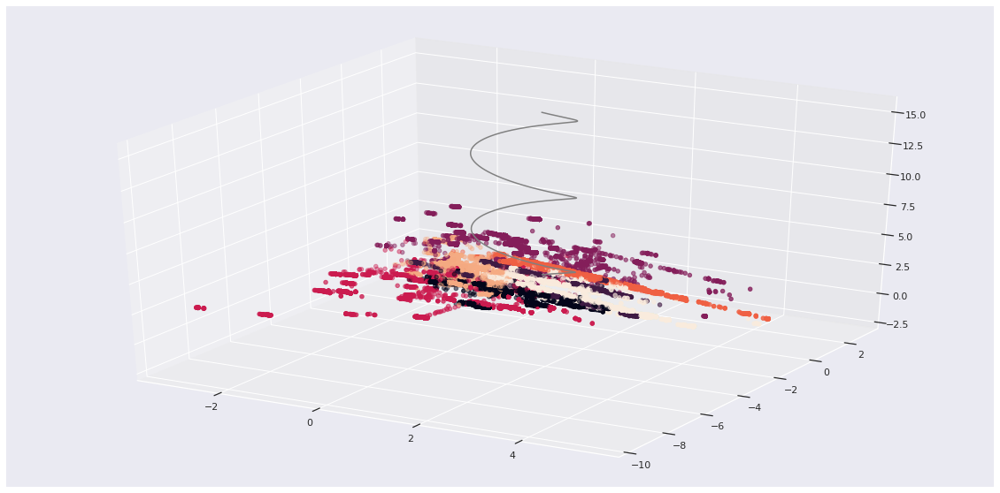

In [0]:
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
ax = plt.axes(projection='3d')
X = gmm_X.values[:,]

# Data for a three-dimensional line
zline = np.linspace(0, 15, 1000)
xline = np.sin(zline)
yline = np.cos(zline)
ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = X[:, 0].astype(float)
xdata = X[:, 1].astype(float)
ydata = X[:, 2].astype(float)
_ = ax.scatter3D(X[:, 0], X[:, 1], X[:, 2], c=gmm_clusters)

Above, you can see the plot of the basic GMM clusters above in a 3 dimensional plot using all 70k points in our data set. Within this 3d plotting, we we set the axises to match those which showed to be the top feature correlations in lab 2 after running our winning model. 

https://github.com/jjschueder/7331DataMiningNotebooks/blob/master/lab2/Lab2_Daniel_Jeff_Armando_Joe(Final2).ipynb

Since we know that there are 7 different liquor types, we can see that our ideal cluster of 2 is not going to be based on the liquor type. From the visuals above in our 2d and 3d space, we can see there being some interesting clustering patterns emerging that we can potentially use. 

Another finding is the distribution of the clusters from our GMM configuration. Here we are seeing that there are different clusters of different sizes, even despite the fact that we have balanced data from our SMOTE procedure. 

Next, let's loook at the clustering that went through our dataset via the GMM approach. 

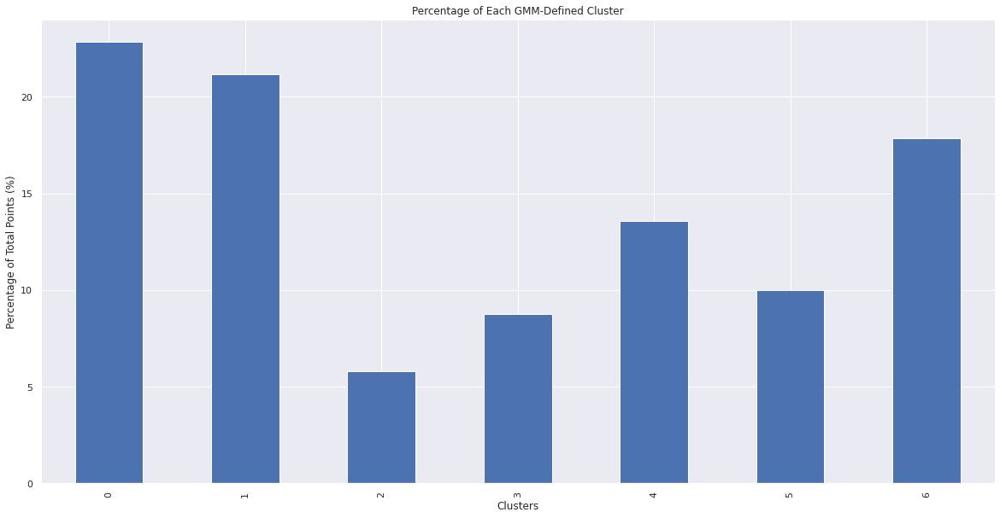

In [0]:
# Create a new dataframe with the clusters defined as a new variable
df_gmm = gmm_X_3init.copy()
df_gmm['Clusters'] = gmm_clusters

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts = df_gmm.groupby('Clusters').count()['First Component'] / len(gmm_X_3init) * 100

# Plot the distribution
ax = cluster_pcts.plot(kind='bar', title="Percentage of Each GMM-Defined Cluster")
_ = ax.set_ylabel("Percentage of Total Points (%)")

Creating a plot that shows the percentage of each GMM defined cluster using our default optimization, we can see that clusters 1, 2 and 6 are taking up the majority of the percentage of observations from our study. 

This makes logical sense since the tranformations created a normal distribution of our data on a plotting plane using transformations of each feature. So a basic clustering algorithm will tend to over group observations into a single (in this case three) cluster. Since we saw previously that our observations weighed heavily towards whiskey and vodka at almost every price point and volume, which we can hypothetize is the reason for the unbalanced clusters. 

Next, we will plot our clusters from the final, optimized GMM clustering that we chose based on the silhouette scores. 

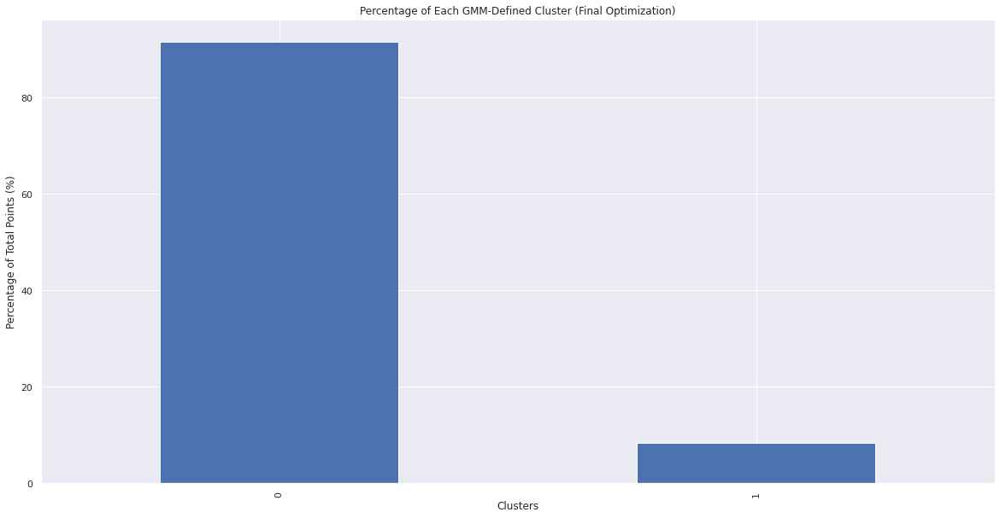

In [0]:
# Create a new dataframe with the clusters defined as a new variable
df_gmm_final = gmm_X.copy()
df_gmm_final['Clusters'] = gmm_clusters_3init

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts_final = df_gmm_final.groupby('Clusters').count()['First Component'] / len(gmm_X_final) * 100

# Plot the distribution
ax = cluster_pcts_final.plot(kind='bar', title="Percentage of Each GMM-Defined Cluster (Final Optimization)")
_ = ax.set_ylabel("Percentage of Total Points (%)")

After running our more nuanced GMM configuration that had a higher slihouette score and our optimal cluster number of 2, we can see a very unbalanced distrubtion among our two clusters. This is not idea, as the optimized clustering did not do it's job to smoothen out our distribution to bemore in line with the balanced nature of our dataset we used to make the clusters. 

Even though this is a bit counter to our transformations we ran previously, the silhouette score was much higher on this optimized version than the score we started with on our default configuration. However, with just 2 clusters, most of the observations are going to gravitate to a single cluster. 

Looking at our default and optimized clusters, we can see that there is a lot of imbalance between the clusters available and the number of observations assigned to each. Since we have equal representation across our data, this is not condusive of an ideal clustering fit. 

Next we will update our Kmeans cluster to the optimal parameters and see how they perform.

#### KMeans Clustering

First, we will plot out our K-means produced clusters using our default clustering fit (config 1), to set a baseline visual in a 3 dimensional plane which we can compare agianst. 

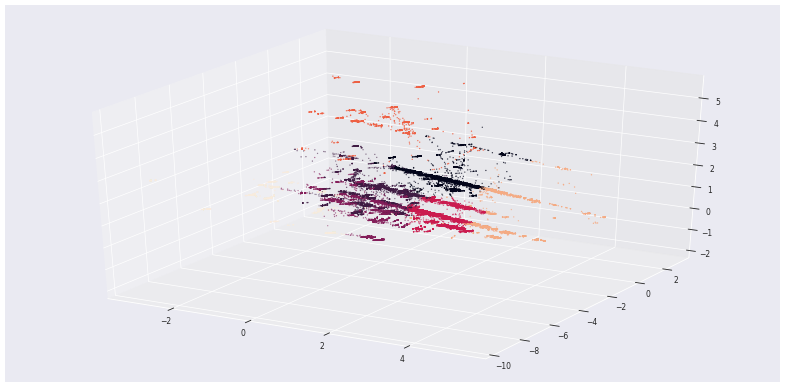

In [0]:
# Config 1
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
X = kms_X.values[:,]
fig = plt.figure(dpi=50)
ax = plt.axes(projection='3d')

# Data for three-dimensional scattered points
zdata = X[:, 0].astype(float)
xdata = X[:, 1].astype(float)
ydata = X[:, 2].astype(float)
_ = ax.scatter3D(X[:, 0], X[:, 1], X[:, 2], c=kms_clusters, s=1)


Then against our best KMeans configuration

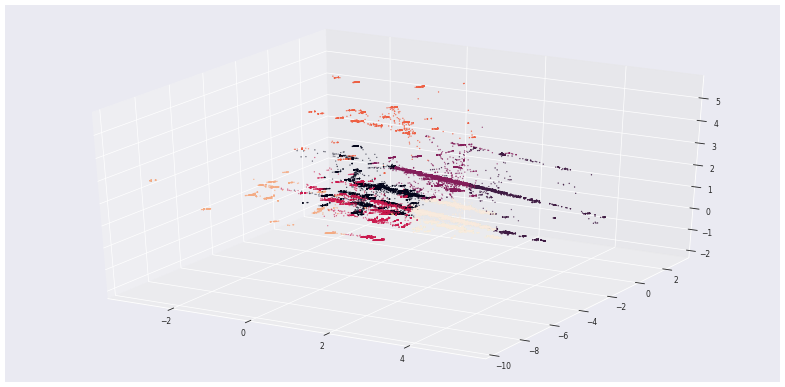

In [0]:
# Config 4
from mpl_toolkits import mplot3d
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,10)
X = kms_X.values[:,]
fig = plt.figure(dpi=50)
ax = plt.axes(projection='3d')

# Data for three-dimensional scattered points
zdata = X[:, 0].astype(float)
xdata = X[:, 1].astype(float)
ydata = X[:, 2].astype(float)
_ = ax.scatter3D(X[:, 0], X[:, 1], X[:, 2], c=kms_clusters4, s=1)

As per points distribution betweeen different configurations. 

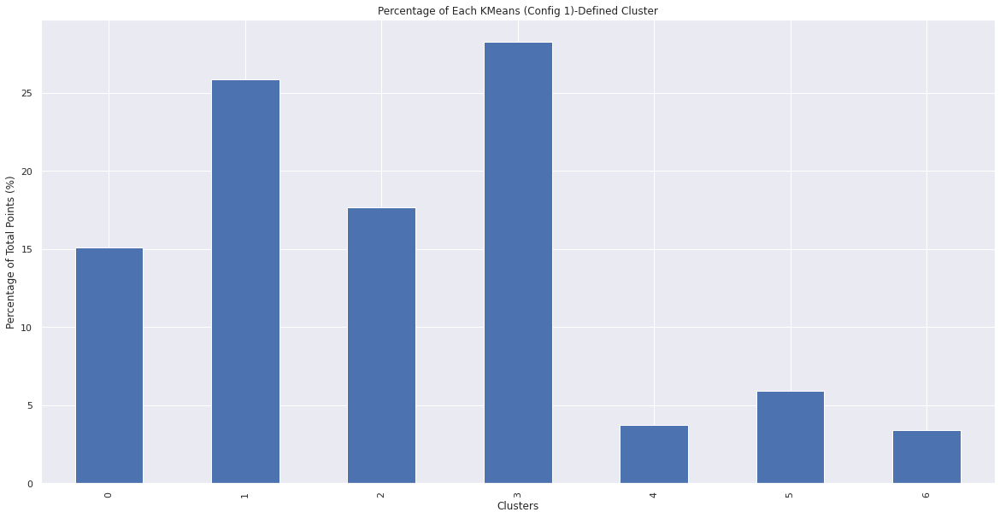

In [0]:
#Config 1
# Create a new dataframe with the clusters defined as a new variable
df_kms = kms_X.copy()
df_kms['Clusters'] = kms_clusters

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts = df_kms.groupby('Clusters').count()['First Component'] / len(kms_X) * 100

# Plot the distribution
ax = cluster_pcts.plot(kind='bar', title="Percentage of Each KMeans (Config 1)-Defined Cluster")
_ = ax.set_ylabel("Percentage of Total Points (%)")

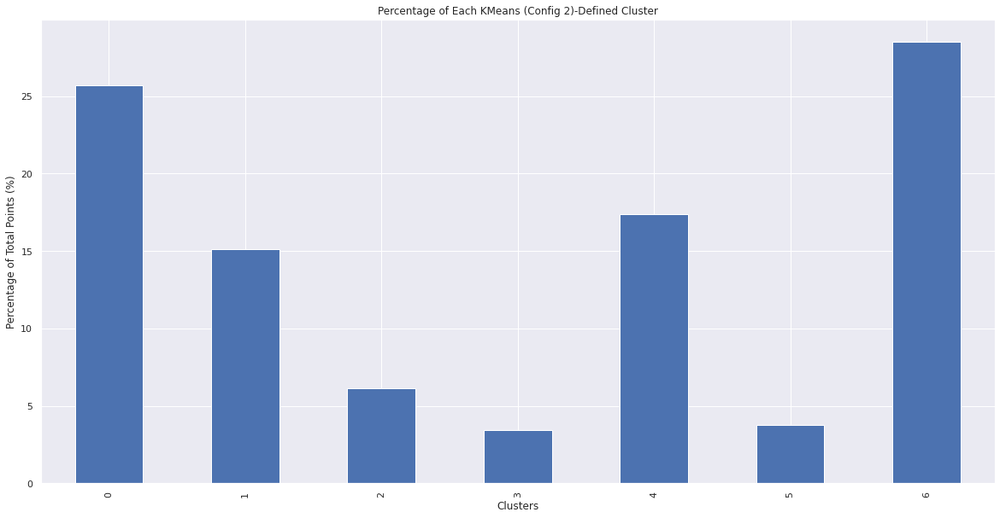

In [0]:
#Config 2
# Create a new dataframe with the clusters defined as a new variable
df_kms = kms_X.copy()
df_kms['Clusters'] = kms_clusters2

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts = df_kms.groupby('Clusters').count()['First Component'] / len(kms_X) * 100

# Plot the distribution
ax = cluster_pcts.plot(kind='bar', title="Percentage of Each KMeans (Config 2)-Defined Cluster")
_ = ax.set_ylabel("Percentage of Total Points (%)")

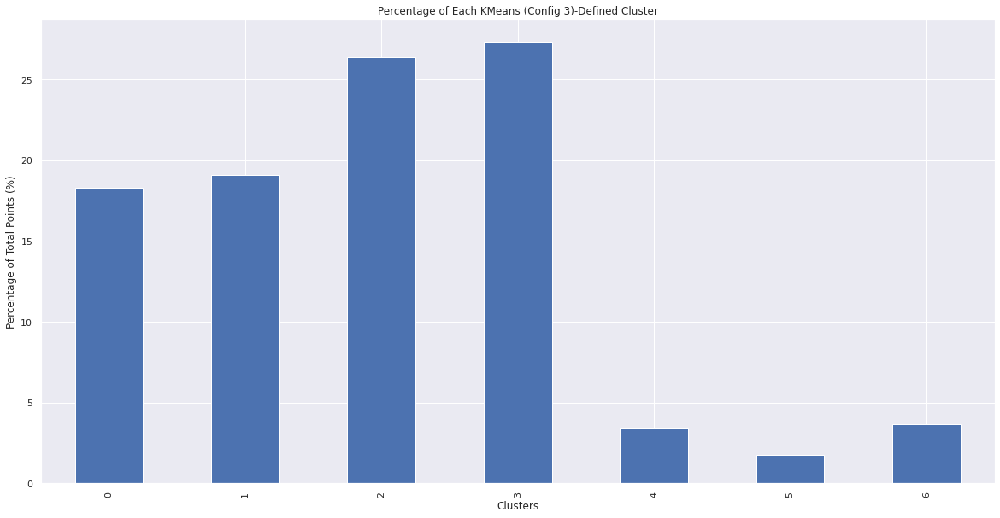

In [0]:
#Config 3
# Create a new dataframe with the clusters defined as a new variable
df_kms = kms_X.copy()
df_kms['Clusters'] = kms_clusters3

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts = df_kms.groupby('Clusters').count()['First Component'] / len(kms_X) * 100

# Plot the distribution
ax = cluster_pcts.plot(kind='bar', title="Percentage of Each KMeans (Config 3)-Defined Cluster")
_ = ax.set_ylabel("Percentage of Total Points (%)")

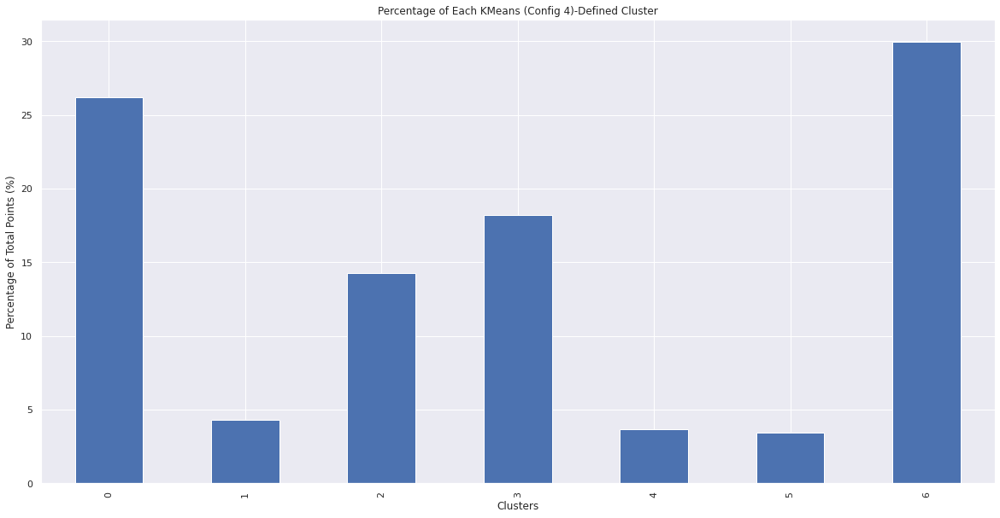

In [0]:

#Config 4
# Create a new dataframe with the clusters defined as a new variable
df_kms = kms_X.copy()
df_kms['Clusters'] = kms_clusters4

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts = df_kms.groupby('Clusters').count()['First Component'] / len(kms_X) * 100

# Plot the distribution
ax = cluster_pcts.plot(kind='bar', title="Percentage of Each KMeans (Config 4)-Defined Cluster")
_ = ax.set_ylabel("Percentage of Total Points (%)")

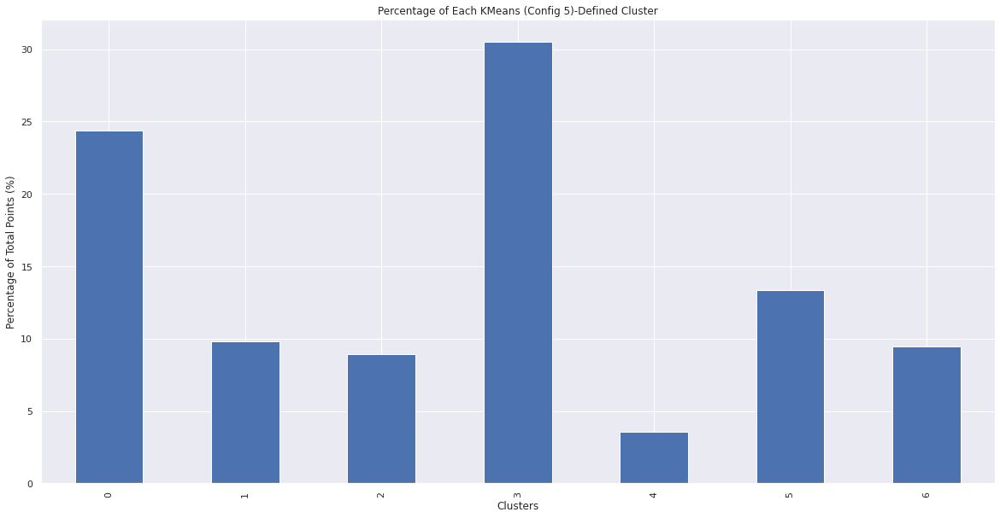

In [0]:
#Config 5
# Create a new dataframe with the clusters defined as a new variable
df_kms = kms_X.copy()
df_kms['Clusters'] = kms_clusters5

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts = df_kms.groupby('Clusters').count()['First Component'] / len(kms_X) * 100

# Plot the distribution
ax = cluster_pcts.plot(kind='bar', title="Percentage of Each KMeans (Config 5)-Defined Cluster")
_ = ax.set_ylabel("Percentage of Total Points (%)")

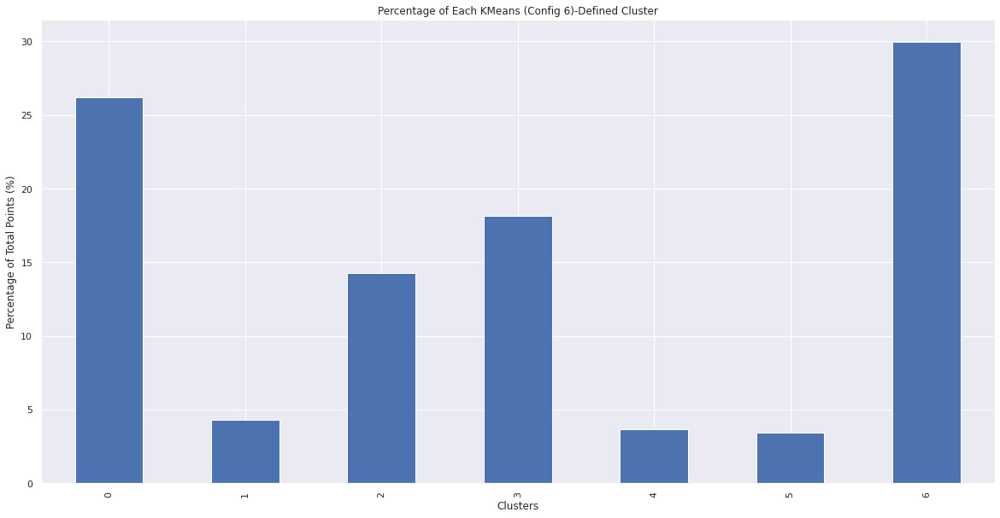

In [0]:
#Config 6
# Create a new dataframe with the clusters defined as a new variable
df_kms = kms_X.copy()
df_kms['Clusters'] = kms_clusters6

# Count the number of instances in each cluster and convert to a percentage of the total
cluster_pcts = df_kms.groupby('Clusters').count()['First Component'] / len(kms_X) * 100

# Plot the distribution
ax = cluster_pcts.plot(kind='bar', title="Percentage of Each KMeans (Config 6)-Defined Cluster")
_ = ax.set_ylabel("Percentage of Total Points (%)")

The defaults for configuration 1 was relatively smooth for clusters 1 through 4, however clusters 5 through 7 were both very close to zero. Configuration 2 was not much better as the configurations for 4 and 6 were both nearly zero. However for the other configurations, we started to see a bit of smoothness.  Configuration 4 and 6 look relatively similar with more of a smoooth transition between clusters that have a high percentage of users to a lower percentage. However, configuration 6 shows the least disparity between the lowest score and the highest score, which aligns with the makeup of our liquor type. 

Configuration 6, which was the one we selected to move forward with using the scores we received for silhouette, completeness, etc. Here, the eye test shows that we have a bit of fluctuation between the total points assinged to each cluster with the lowest clusters hovering at about 10%. With those two discrepanices, there is a bit of uniformity between each cluster, more so than the others and the best GMM cluster. 

## Modeling and Evaluation 4 (20 points)

Summarize the Ramifications
• Summarize: Describe your results. What findings are the most interesting and why

* Doing PCA/LDA feature reduction prevents us from highlighting the specific features that the data is clustered around
* Interesting that we went in thinking there would be the 7 clusters, but the k-means w/ the highest silhouette score shows 13 clusters.
* Silhouette score used as best measure comparison between models

* Table showing:

Cluster Algorithm | wall time | # of clusters | tolerance | sil score | avg accuracy

* k-means
* GMM
* dbscan 


Note - leave out of table, but put into exceptional work spectral, agglomerative, turi graph lab

Visualize: Use tables/visualization to discuss the found results. Explain each visualization in
detail.      

#### Baseline Random Forest Classification

The Random Forest Classifcation shown here was the best classifier found in a prior analysis. (https://github.com/jjschueder/7331DataMiningNotebooks/blob/master/lab2/Lab2_Daniel_Jeff_Armando_Joe(Final2).ipynb). This analysis is placed here to use as a comparision to the basic clusters found with the LDA data. It will be used to cross validate to see if clustering is providing information that resembles the liquor categories. This comparion will not be used in the more advanced section as more clusters will be used and clusters will most likely not represent liquor categories, but some other unseen and or unknown groupings that we will need to explore the results of to find meaning.

In [0]:
%%time
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier

cv = StratifiedKFold(n_splits=10)
#trained one time then dumped out to google drive for re-use withouth having to re-train
#clf = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
#                       criterion='gini', max_depth=20, max_features='auto',
#                       max_leaf_nodes=None, max_samples=None,
#                       min_impurity_decrease=0.0, min_impurity_split=None,
#                       min_samples_leaf=1, min_samples_split=2,
#                       min_weight_fraction_leaf=0.0, n_estimators=500,
#                       n_jobs=None, oob_score=False, random_state=101,
#                       verbose=0, warm_start=False)

CPU times: user 32 µs, sys: 8 µs, total: 40 µs
Wall time: 44.3 µs


In [0]:
from google.colab import drive
drive.mount('/content/drive/')
#My Drive/ColabNotebooks/')
url_rfmodel = '/content/drive/My Drive/Colab Notebooks/rfmodelbasecluster.joblib'

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Here, we are going to import the RF model from our previous lab to use to evaluate our baseline cluster. Like we discussed previously, we will be using accuracy as our key metric to evaluate performance. 

In [0]:
#exporting model to drive
from joblib import dump, load
#dump(clf, url_rfmodel) 

In [0]:
%%time
#importing model to new model name
clf = load(url_rfmodel)

CPU times: user 891 µs, sys: 1.9 ms, total: 2.79 ms
Wall time: 215 ms


And we will assign this RF model to CLF to look at the performance of our model at a baseline. Here we were able to achieve an accuracy of 93.5 with a plus or minus of 0.28, which we will look to start with in our basic clustering. 

In [0]:
#X1_train_res, y1_train_res
acc = cross_val_score(clf,X1_train_res,y=y1_train_res,cv=cv)

print ("Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

Average accuracy =  93.53986965710368 +- 0.2854218781726482


In [0]:
%%time
from sklearn.model_selection import StratifiedKFold, cross_val_score
y = y1_train_res
X = X_train_ldadf
X = np.column_stack((X,pd.get_dummies(newfeaturelda)))

acc = cross_val_score(clf,X,y=y,cv=cv)
print ("Average accuracy = ", acc.mean()*100, "+-", acc.std()*100)

Average accuracy =  93.4256277962834 +- 0.3883187606713673
CPU times: user 4min, sys: 446 ms, total: 4min 1s
Wall time: 4min 1s


Baseline Classifiers:

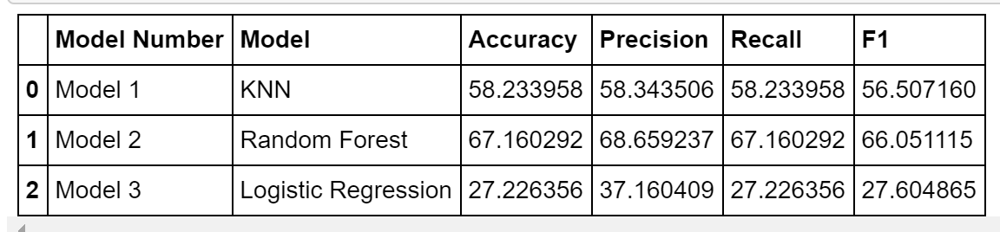

### Random Forest Classifier with new feature:

Data was exported from this notebook and then imported into another Random forest evaluation notebook located here. 

https://github.com/jjschueder/7331DataMiningNotebooks/blob/master/lab3/RF_with_cluster_check.ipynb


The result follows. 

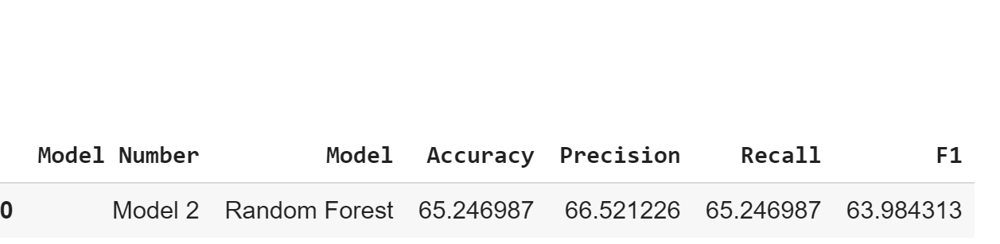

Unfortunately, the addition of the clustering feature did not improve the scoring and in fact may even have been lower. Therefore, clusterinf was not helpful in the intented purpose.

## Deployment (10 points)



Be critical of your performance and tell the reader how you current model might be usable by other parties. 

Did you achieve your goals? If not, can you reign in the utility of your modeling?  
- Our goal was to take the clustering output from liquor type and feed that back into our best classfication model from lab-2, which was our random forest classifier to see if we could improve our classificaiton accuracy. Unfortunatley, the clustering did not improve our classification accuracy.  Our initial classification accuracy before the new feature was 67.16%.  Adding the new feature of the liquor cluster did not improve our accuracy score.  The accuracy score after adding the new feature was 65.24%

- In addition, we saw there is some other clustering going on outside the liquor categories; hence the 13 categories. There is an opporunity to explore these 13 categories.  We achieved the highest siloutte score at 7 clusters using k-means.  After LDA applied it drove our clusters down from 13 to 7 clusters.

---

How useful is your model for interested parties (i.e., the companies or organizations that might want to use it)?  

- We didn't glean the information from the clustering liked we hoped we would have.  Our initial thought process going into this exercise was that the clustering would help improve our classification.  That the clustering would possibly reveal things like highend/lowend liquor which would help in determine the most profitable liquors.  Having this information would be further highlighted in the improved accuracy score of classification.  However, since the clustering didn't yield those results, we wouldn't recommend the use of the current cluster output.

--- 

How would you deploy your model for interested parties? 
- Our deployment approach for clustering had it been successful would be as a feedback loop into our random forest classifier.  As new data sales came in, we would run the new data points through our clustering algorithm first, then merge the clustering data with the original data as a new feature.  Since this data is updated monthly, we would simply batch this process and update the models on a monthly basis.  The classification would still be deployed as an API endpoint that other wholesalers would be able to call.

--- 

What other data should be collected? 
- The sales transactions from the individual stores to look at the revenue/profits generated.  Looking at this information from wholesale perspective and then combining down to the retail store pricing, we could help invidual stores increase their profit margins.  Also, possibly looking at this at the zip code level and seeing the categories of how the liquor sales look.  Take models we have done and apply by zip code level, then can look at interesting market trends.  For example tier 1 liquor vs high end liquor.  Here are some low end vodka categoires and the type of sales they have and which stores push that liquor.  This would help in marketing to those stores to sell the different kind of liquors.

--- 

How often would the model need to be updated, etc.?  
- Since the data is released on a monthly basis, we would update the model at the same monthly frequency.  If the retail sales data was available, then we would update more frequently since the clustering algorithms run in seconds, frequent update to the models is not a concern.  If we were deployed at the edge in the retail space, then we could process data in real time, update the models locally, and then have a data pipeline that sends the data from the individual stores to a cloud provider to then merge data from all retail stores.  The combination of retail store data and wholesale date would give a clearer picture on sales and profitably from individual store perspective as well as overall sales.  This would allow us to taylor the types of liquor more specifically for each store and have only those liquors that are high voume and high profitability in each of the stores.

## Exceptional Work (10 points)


#### Exceptional Work 1 - Created visuals for every cluster on GMM and Kmeans. 

During modeling and evaluation 2, we went through and created separate cluster plots for both the kmeans and GMM procedures to test the optimal number of clusters would generate the highest slhouette score. Interestingly, we found that 13 clusters was the best for both, which would suggest that the clusters being chosen are not necessarily directly correlated with the liquor type. 

#### Exceptional Work 2 - DBScan and Agglomerative Clustering

On the notebooks below, we performed additional clustering using Agglomerative and DBscan to see if we can can exceed our performance from the Kmeans and the GMM clustering that was performed previously. 

Aggllomerative Clustering

https://github.com/jjschueder/7331DataMiningN

In the link above, we ran a linea discriminant analysis of our Smote Data set, which reduced our variables to 3 key components that we will use in our agglomerative clustering. The reason we are going to do LDA is that if we can reduce our compoenents, we will reduce the dimensions that can add noise to our clustering model. To be able to use 3 components, we are also able to have the 3 key dimensions in which we can see our clsuters floating in space. 

The reason we are looking at Agglomerative clustering is that, instead of Kmeans, which is another heirarchical cluster, we are starting with every point as it's own cluster and we join them over time based on the input of distances. This may provide some addtiional support to improve our Random Forest model classifier. 

After applying our LDA, we found that our average Agglomerative Silhouette Score was 0.32, which was strong in comparison to the GMM and Kmeans clustering we ran previously. After Applying our Random Forest Model, we are getting an average accuracy score of 86.57 with a margin of error of 1.45. This is strong compared to the random forest classifiers we ran in lab 2 to classify the 7 liquor types, which we maxed out at 67% accuracy. 

#### Exceptional Work 3
As part of our analysis of which number of clusters gave us the strongest silhouette score for both the Kmeans and GMM cluster, we decided to plot each of the clusters to see how they all compared with one another and to see if any patterns emerge with regards to what types of areas in our 2d scatter plots are getting divided first and how increasing the number of clusters can affect that. 

Generally, between all of our clusters, we saw that the split took place directly down the middle from top to bottom, and we kind of saw sub clusters emerge from there on each side of the halved plane. 

#### Exceptional Work 4

In addition to our KPI metric of silhouette score on on our clustering algorithms, we also looked into 5 additional metrics to tell the complete story of our clusters on our Kmeans cluster (unfortunately, we weren't abel to get these for GMM, so we stuck to Silhouette score) Below is an example of an output for the Homogeneity, Completelness, V-Measure, Adjusted Rand index and Adjusted mutual information.

In [0]:
# config 5
from sklearn.metrics import silhouette_score

# Get silhouette score
kms5_sil = silhouette_score(kms_X, kms_clusters5, random_state=1)
print("Average K-means Silhouette Score:", kms5_sil)
df_kms_result.loc[4, 'SilhouetteScore'] = kms5_sil

print("Homogeneity: %0.3f" % metrics.homogeneity_score(y1_train_res, kms5fit.labels_))
print("Completeness: %0.3f" % metrics.completeness_score(y1_train_res, kms5fit.labels_))
print("V-measure: %0.3f" % metrics.v_measure_score(y1_train_res, kms5fit.labels_))
print("Adjusted Rand Index: %0.3f"
      % metrics.adjusted_rand_score(y1_train_res, kms5fit.labels_))
print("Adjusted Mutual Information: %0.3f"
      % metrics.adjusted_mutual_info_score(y1_train_res, kms5fit.labels_, average_method='arithmetic'))

Average K-means Silhouette Score: 0.2794025141439556
Homogeneity: 0.141
Completeness: 0.156
V-measure: 0.149
Adjusted Rand Index: 0.085
Adjusted Mutual Information: 0.148


### Exceptional Work 5 - TSNE  
In the included notebooks below clustering analysis was completed using TSNE as a dimensionality reduction technique. It produced very high silhouette scores of 80 to over 90. However the number of clusters were well over 1,500 and were not useful when exploratory data analysis was performed there were so many clusters and it was hard to determine if there was a human intuitive difference among any of them. 

https://github.com/jjschueder/7331DataMiningNotebooks/blob/master/lab3/Lab3tnse3d.ipynb

When the clusters were used as an additional feature for classification improvement there scores did not approve.

https://colab.research.google.com/github/jjschueder/7331DataMiningNotebooks/blob/master/lab3/RF_with_cluster_check.ipynb